# Problem statement

> ***QUESTION:** ACME Insurance Inc. offers affordable health insurance to thousands of customer all over the United States. As the lead data scientist at ACME, you're tasked with creating an automated system to estimate the annual medical expenditure for new customers, using information such as their age, sex, BMI, children, smoking habits and region of residence. Estimates from your system will be used to determine the annual insurance premium (amount paid every month) offered to the customer. Due to regulatory requirements, you must be able to explain why your system outputs a certain prediction.*

> *You're given a [CSV file][] containing verified historical data, consisting of the aforementioned information and the actual medical charges incurred by over 1300 customers.*

[CSV file]: https://raw.githubusercontent.com/JovianML/opendatasets/master/data/medical-charges.csv

> *Dataset source: https://github.com/stedy/Machine-Learning-with-R-datasets*

> *Youtube: https://www.youtube.com/watch?v=hDKCxebp88A*


> Before proceeding further, take a moment to think about how can approach this problem. List five or more ideas that come to your mind below.

I would expect to check the following, just for my own interest:

- Check how all factors determine the sum of insurance;
- Check if there are any residency impact (e.g. people in South West seems to have higher insurance costs);
- Check which factor is the most important (and try to understand why) and may be the baseline of decision;
- Identify which factor is least impactful, and try to determine why;
- Check smoking habits;
- Determine how age impacts the insurance;
- Present the findings visually;
- Try to find something interesting.

Below are all libraries used in this notebook.

In [1]:
# if anything needs installing:

# !pip install ydata-profiling --quiet
# !pip install pandas --quiet
# !pip install scikit-learn -q

In [2]:
from urllib.request import urlretrieve

import pandas as pd

import dill

import plotly.express as px 
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot

from scipy.stats import pearsonr, pointbiserialr, chi2_contingency
import numpy as np

from sklearn import preprocessing

from sklearn.preprocessing import LabelEncoder, StandardScaler
from statsmodels.formula.api import ols
import statsmodels.api as sm

import scipy.stats as stats

from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error, r2_score

# this ensures graphs stays in the jupyter notebook
%matplotlib inline 

In [3]:
# improving chart style

sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (20,12 )
matplotlib.rcParams['figure.facecolor'] = '#00000000'

# 1. Exploratory data analysis

I will be following the course given in below:  
https://jovian.ai/aakashns/python-sklearn-linear-regression  
https://www.youtube.com/watch?v=hDKCxebp88A&t=3s  

<div class="alert alert-block alert-warning">
<b>Note:</b>  
My comments will be written in yellow boxes for my own references.
</div>

<div class="alert alert-block alert-warning">
<b>Links:</b>  

https://pypi.org/project/pandas-profiling/

https://docs.profiling.ydata.ai/latest/
</div>

I will use `urlretrieve` function from `urllib.request` package to import data from .csv file.

In [4]:
medical_charges_url = 'https://raw.githubusercontent.com/JovianML/opendatasets/master/data/medical-charges.csv'

In [5]:
urlretrieve(medical_charges_url, 'medical.csv')

('medical.csv', <http.client.HTTPMessage at 0x29911014750>)

In [6]:
medical_df = pd.read_csv('medical.csv')

In [7]:
medical_df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


> *Our objective is to find a way to estimate the value in the "charges" column using the values in the other columns. If we can do so for the historical data, then we should able to estimate charges for new customers too, simply by asking for information like their age, sex, BMI, no. of children, smoking habits and region.*

Notes after looking in the above example from imported .csv file:

- Check BMI categories for better understanding how healthy individuals' weight is;
- There might be outliers in Charges column, in BMI and number of children as well;
- I'd like to remove number of children, as this is personal from my POV, I am not sure how such information could indicate health insurance costs. Will need to check if this column is statistically important.

## 1.1. Initial data check

### Basic data check

Analyse dataset using `info` function first. `info` shows basic details only: data type, count and missing values.

In [8]:
medical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


From the first look dataset is unusually clean. There are no missing values, data types are corresponding to the logical types: age is integer, sex is categorical, BMI is floating number, number of children is integer, smoking habits is categorical, and charges are floating number.

From the first look, there will be no need to clean-up dataset, which will make the analysis as accurate as possible. The count of records is also relatively small (1338 entries).

### Basic statistics

Analyse statistical measures in columns by using `describe` function.

In [9]:
medical_df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


`describe` only checks numerical data, therefore `object` data type columns were ignored.




**Children**: mean shows that clients have at least one child, however, 1st percentile doesn't have any children, and half of clients have no or one child only. There shouldn't be any outliers in this data column.



### Duplicate values

I will also check for duplicate values, if there are any.


<div class="alert alert-block alert-warning">
<b>Links:</b>  
    
https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html  
    
https://www.w3schools.com/python/ref_func_any.asp
</div>


In [10]:
medical_df.duplicated().any()

True

Duplicates exist - following line checks all duplicated rows.

In [11]:
medical_df[medical_df.duplicated(keep=False)]

,age,sex,bmi,children,smoker,region,charges
195,19,male,30.59,0,no,northwest,1639.5631
581,19,male,30.59,0,no,northwest,1639.5631


I will remove the duplicated row even if that was not done in the initial course.


<div class="alert alert-block alert-warning">
<b>Links:</b>  
    
https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html#pandas.DataFrame.drop_duplicates
</div>

In [12]:
medical_df = medical_df.drop_duplicates()

In [13]:
medical_df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


### Checking for errors

I will check for any inconsistencies or mistype in text fields.

In [14]:
medical_df['region'].unique()

array(['southwest', 'southeast', 'northwest', 'northeast'], dtype=object)

In [15]:
medical_df['sex'].unique()

array(['female', 'male'], dtype=object)

In [16]:
medical_df['smoker'].unique()

array(['yes', 'no'], dtype=object)

There are no mistype or not correct words in text fields.

Since no further data adjustments are necessary, I will move on to univariate analysis.

#### Saving data

I am using `dill` package to save notebook information and variables.

<div class="alert alert-block alert-warning">
<b>Links:</b>  
    
https://stackoverflow.com/questions/34342155/how-to-pickle-or-store-jupyter-ipython-notebook-session-for-later
</div>

## 1.2. Univariate analysis

In this step I will examine all variables alone. I will compute statistical measures for numerical data, and I will analyse distributions and unique values for categorical data. 

### 1.2.1. Age

In [17]:
medical_df.age.describe()

count    1337.000000
mean       39.222139
std        14.044333
min        18.000000
25%        27.000000
50%        39.000000
75%        51.000000
max        64.000000
Name: age, dtype: float64

I will be using `plotly` histogram and a boxplot to check age distribution.

In [ ]:
fig = px.histogram(data_frame = medical_df,
                  x = 'age',
                  color_discrete_sequence = px.colors.qualitative.Antique,
                  marginal = 'box',
                  nbins = 47,
                  title = 'Distribution of Age')
fig.update_layout(bargap = 0.1)
fig.show()

There is a significant number of very young customers (18 - 19 years old) compared to all other age groups. I cannot see any outliers, which will probably save me fair amount of time; minimum and maximum values are logical (18 and 64 respectively), the dataset has more *younger* individuals than *older* (median is 39 years, and 75% of dataset are below 51 years old), and the mean is 39 years old, which is fairly young individuals; later on we will see if that will create issues for potential older new clients.

I will check for outliers using z-score method.

In [ ]:
import numpy as np
outliers = []
def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(medical_df.age)
    std = np.std(medical_df.age)
    # print(mean, std)
    for i in medical_df.age:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_zscore(medical_df)
print("Outliers from Z-scores method: ", sample_outliers)

I will check skewness of age.

In [ ]:
medical_df.age.skew()

as per site https://www.datacamp.com/tutorial/understanding-skewness-and-kurtosis

* (-0.5, 0.5) — low or approximately symmetric.
* (-1, -0.5) U (0.5, 1) — moderately skewed.
* Beyond -1 and 1 — Highly skewed.

In this case, data is approximately symmetric.

There are no outliers in age group as per z-score test.

In [21]:
sns.kdeplot(medical_df.age, color="blue")

font = {'family': 'serif',
        'color':  'grey',
        'weight': 'normal',
        'size': 25,
        }
with plt.style.context('bmh'):
    sns.despine(top=True, right=True, left=True)
    plt.xticks()
    plt.yticks()
    plt.ylabel("Density",fontdict=font)
    plt.xlabel("Age",fontdict=font)
    plt.title("Skewness of age", fontdict=font)

    # Tweak spacing to prevent clipping of ylabel
    plt.subplots_adjust(left=0.10)

    # Find the mean, median, mode
    mean_age = medical_df.age.mean()
    median_age = medical_df.age.median()
    mode_age = medical_df.age.mode().squeeze()

    # Add vertical lines at the position of mean, median, mode
    plt.axvline(mean_age, label="Mean")
    plt.axvline(median_age, color="black", label="Median")
    plt.axvline(mode_age, color="green", label="Mode")

    plt.legend()
plt.show()

### 1.2.2. BMI (Body Mass Index)

In [22]:
medical_df.bmi.describe()

count    1337.000000
mean       30.663452
std         6.100468
min        15.960000
25%        26.290000
50%        30.400000
75%        34.700000
max        53.130000
Name: bmi, dtype: float64

In [23]:
fig = px.histogram(data_frame = medical_df,
                  x = 'bmi',
                  color_discrete_sequence = px.colors.qualitative.Vivid,
                  marginal = 'box',
                  title = 'Distribution of BMI',)
fig.update_layout(bargap = 0.1)
fig.show()

BMI mean is more than 30, which means that majority of current clients are obese. Only less than 25% of the clients are in normal weight category (1st percentile is 26.27 which is overweight). There might be outliers.

Data for below is taken from [National Hearth, Lung and Blood institute][ID]:

[ID]: https://www.nhlbi.nih.gov/health/educational/lose_wt/risk.htm  

<div style="text-align: left;"> 
    <p>
    <table style="margin-left: 0;">
      <tr>
        <th>BMI</th>
        <th>Value</th>
      </tr>
      <tr>
        <td>Underweight</td>
        <td>below 18.5</td>
      </tr>
      <tr>
        <td>Normal</td>
        <td>18.5–24.9</td>
      </tr>
      <tr>
        <td>Overweight</td>
        <td>25.0–29.9</td>
      </tr>
      <tr>
        <td>Obesity</td>
        <td>30.0 and above</td>
      </tr>
    </table>
</div>


In [24]:
import numpy as np
outliers = []
def detect_outliers_zscore(medical_df):
    thres = 3
    mean = np.mean(medical_df.bmi)
    std = np.std(medical_df.bmi)
    # print(mean, std)
    for i in medical_df.bmi:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_zscore(medical_df)
print("Outliers from Z-scores method: ", sample_outliers)

Outliers from Z-scores method:  [49.06, 50.38, 52.58, 53.13]


There are some outliers found with z-score method. I will check the same using Inter Quantile Range (IQR) method:

In [25]:
outliers = []
def detect_outliers_iqr(medical_df):
    data = sorted(medical_df.bmi)
    q1 = np.percentile(medical_df.bmi, 25)
    q3 = np.percentile(medical_df.bmi, 75)
    # print(q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    # print(lwr_bound, upr_bound)
    for i in medical_df.bmi: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_iqr(medical_df)
print("Outliers from IQR method: ", sorted(sample_outliers))

Outliers from IQR method:  [47.41, 47.52, 47.6, 47.74, 48.07, 49.06, 50.38, 52.58, 53.13]


I will check skewness both via function and visually.

In [26]:
medical_df.bmi.skew()

0.28391419385321137

as per site https://www.datacamp.com/tutorial/understanding-skewness-and-kurtosis

* (-0.5, 0.5) — low or approximately symmetric.
* (-1, -0.5) U (0.5, 1) — moderately skewed.
* Beyond -1 and 1 — Highly skewed.

In this case, data is approximately symmetric.

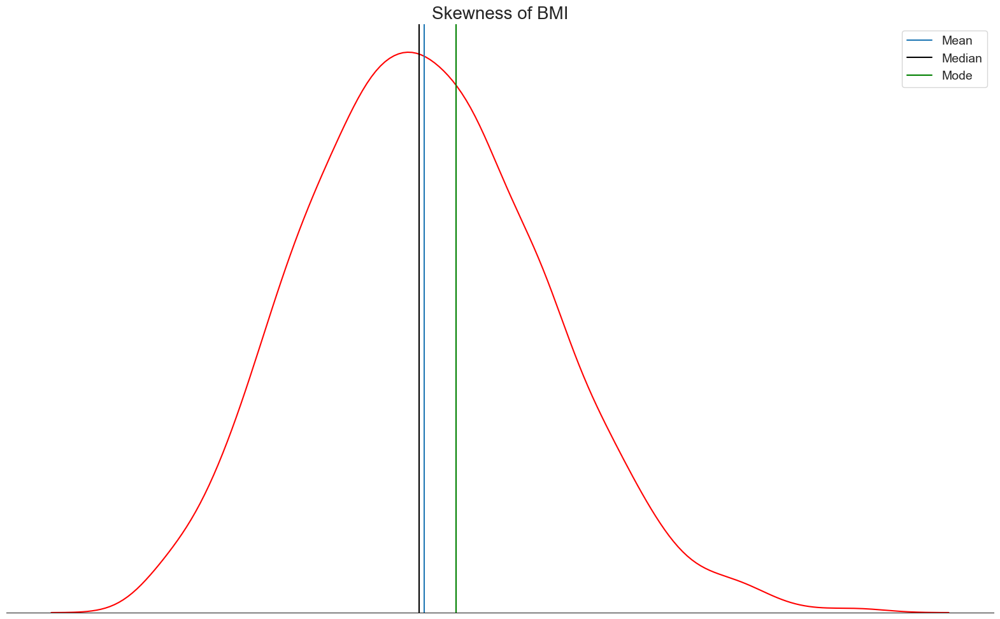

In [27]:
sns.kdeplot(medical_df.bmi, color="red")

sns.despine(top=True, right=True, left=True)
plt.xticks([])
plt.yticks([])
plt.ylabel("")
plt.xlabel("")
plt.title("Skewness of BMI", fontdict=dict(fontsize=20))

# Find the mean, median, mode
mean_bmi = medical_df.bmi.mean()
median_bmi = medical_df.bmi.median()
mode_bmi = medical_df.bmi.mode().squeeze()

# Add vertical lines at the position of mean, median, mode
plt.axvline(mean_bmi, label="Mean")
plt.axvline(median_bmi, color="black", label="Median")
plt.axvline(mode_bmi, color="green", label="Mode")

plt.legend();

I will also check kurtosis. Kurtosis focuses on the height, while skewness focuses on the tails of data.

High kurtosis indicates that more values are concentrated around mean than normal distribution and also heavier tails (with outliers), and also shows greater likelihood of extreme events. Low kurtosis shows flat peak, lighter tails, lower likelihood of extreme events; also shows fewer values around the mean, but still more than a normal distribution.

There are three types of kurtosis:
* Mesocurtic distribution (kurtosis = 3, excess kurtosis = 0): perfect normal distribution or very close to it.
* Leptokurtic distribution (kurtosis > 3, excess kurtosis > 0): sharp peak and heavy tails.
* Platykurtic distribution (kurtosis < 3, excess kurtosis < 0): flat peak and light tails.

In [28]:
from scipy.stats import kurtosis

print ("Kurtosis:", (kurtosis(medical_df.bmi) + 3), "Excess kurtosis:", kurtosis(medical_df.bmi))

Kurtosis: 2.9427662908999905 Excess kurtosis: -0.05723370910000947


As per above, kurtosis is very close to 0, and excess kurtosis is slightly below 0, which shows that it is very close to perfect normal distribution with little flat peak (sign of platycurtis kurtosis).

The data looks like normally distributed, and there are no skewness visible. Since the found outliers seems to be accurate data, and not errors, and also may contribute to the analysis (extreme BMI values may lead to inssights in medical charges), no changes will be applied to BMI data.

### 1.2.3. Charges

In [29]:
medical_df.charges.describe()

count     1337.000000
mean     13279.121487
std      12110.359656
min       1121.873900
25%       4746.344000
50%       9386.161300
75%      16657.717450
max      63770.428010
Name: charges, dtype: float64

In [30]:
fig = px.histogram (medical_df,
                    x = 'charges',
                    marginal = 'box',
                    color_discrete_sequence = ['#66AA00'],
                    title = 'Distribution of Annual Medical Charges')
fig.update_layout(bargap = 0.1)
fig.show()

Mean shows 13k per year, while minimul value is 1k per year. Whilst the 1st percentile is fairly low too (almost 5k per year), and grows slowly to 9k per year at 50%, the 3rd percentile is way higher (almost 17k) and the maximum value might be an anomaly (64k), the data looks skewed.

<div class="alert alert-block alert-warning">
<b>Links:</b>  
    
How to remove subplot figure titles:  
https://plotly.com/python/facet-plots/
   
https://plotly.com/python/legend/
</div>

I will check the many outliers, that are visible in box-plot.

z-score method:

In [31]:
import numpy as np
outliers = []
def detect_outliers_zscore(medical_df):
    thres = 3
    mean = np.mean(medical_df.charges)
    std = np.std(medical_df.charges)
    # print(mean, std)
    for i in medical_df.charges:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_zscore(medical_df)
print("Outliers from Z-scores method: ", sorted(sample_outliers))

Outliers from Z-scores method:  [51194.55914, 52590.82939, 55135.40209, 58571.07448, 60021.39897, 62592.87309, 63770.42801]


Inter Quantile Range (IQR) method:

In [32]:
outliers = []
def detect_outliers_iqr(medical_df):
    data = sorted(medical_df.charges)
    q1 = np.percentile(medical_df.charges, 25)
    q3 = np.percentile(medical_df.charges, 75)
    # print(q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    # print(lwr_bound, upr_bound)
    for i in medical_df.charges: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_iqr(medical_df)
print("Outliers from IQR method: ", sorted(sample_outliers))

Outliers from IQR method:  [34617.84065, 34672.1472, 34779.615, 34806.4677, 34828.654, 34838.873, 35069.37452, 35147.52848, 35160.13457, 35491.64, 35585.576, 35595.5898, 36021.0112, 36085.219, 36124.5737, 36149.4835, 36189.1017, 36197.699, 36219.40545, 36307.7983, 36397.576, 36580.28216, 36837.467, 36898.73308, 36910.60803, 36950.2567, 37079.372, 37133.8982, 37165.1638, 37270.1512, 37465.34375, 37484.4493, 37607.5277, 37701.8768, 37742.5757, 37829.7242, 38126.2465, 38245.59327, 38282.7495, 38344.566, 38415.474, 38511.6283, 38709.176, 38711.0, 38746.3551, 38792.6856, 38998.546, 39047.285, 39125.33225, 39241.442, 39556.4945, 39597.4072, 39611.7577, 39722.7462, 39725.51805, 39727.614, 39774.2763, 39836.519, 39871.7043, 39983.42595, 40003.33225, 40103.89, 40182.246, 40273.6455, 40419.0191, 40720.55105, 40904.1995, 40932.4295, 40941.2854, 40974.1649, 41034.2214, 41097.16175, 41661.602, 41676.0811, 41919.097, 41949.2441, 41999.52, 42111.6647, 42112.2356, 42124.5153, 42211.1382, 42303.69215, 

IQR method found way more outliers, as expected, as it was visible via box-plot.

I will check skewness both via function and visually.

In [33]:
medical_df.charges.skew()

1.5153909108403483

as per site https://www.datacamp.com/tutorial/understanding-skewness-and-kurtosis

* (-0.5, 0.5) — low or approximately symmetric.
* (-1, -0.5) U (0.5, 1) — moderately skewed.
* Beyond -1 and 1 — Highly skewed.

In this case, data is highly skewed.

<Axes: xlabel='charges', ylabel='Density'>

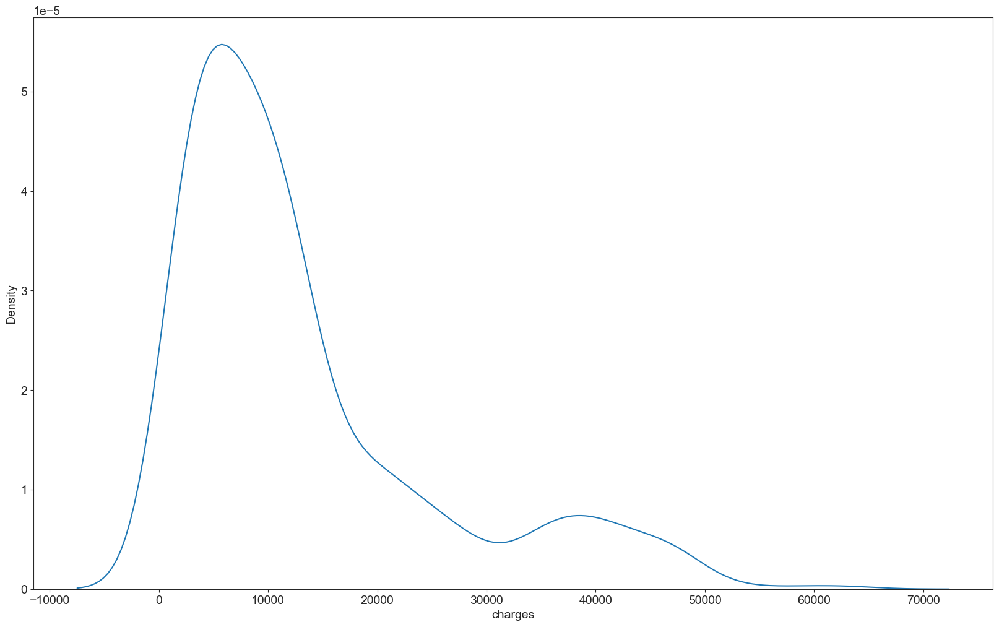

In [34]:
sns.kdeplot(medical_df.charges)

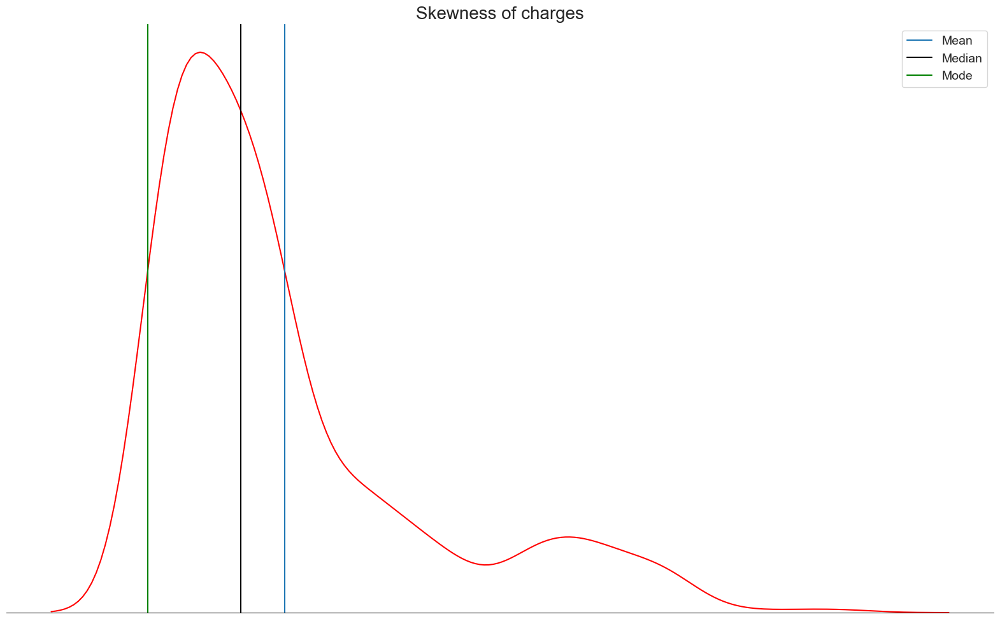

In [35]:
sns.kdeplot(medical_df.charges, color="red")

sns.despine(top=True, right=True, left=True)
plt.xticks([])
plt.yticks([])
plt.ylabel("")
plt.xlabel("")
plt.title("Skewness of charges", fontdict=dict(fontsize=20))

# Find the mean, median, mode
mean_charges = medical_df.charges.mean()
median_charges = medical_df.charges.median()
mode_charges = medical_df.charges.mode().iloc[0]

# Add vertical lines at the position of mean, median, mode
plt.axvline(mean_charges, label="Mean")
plt.axvline(median_charges, color="black", label="Median")
plt.axvline(mode_charges, color="green", label="Mode")

plt.legend();

I will also check kurtosis. Kurtosis focuses on the height, while skewness focuses on the tails of data.

High kurtosis indicates that more values are concentrated around mean than normal distribution and also heavier tails (with outliers), and also shows greater likelihood of extreme events. Low kurtosis shows flat peak, lighter tails, lower likelihood of extreme events; also shows fewer values around the mean, but still more than a normal distribution.

There are three types of kurtosis:
* Mesocurtic distribution (kurtosis = 3, excess kurtosis = 0): perfect normal distribution or very close to it.
* Leptokurtic distribution (kurtosis > 3, excess kurtosis > 0): sharp peak and heavy tails.
* Platykurtic distribution (kurtosis < 3, excess kurtosis < 0): flat peak and light tails.

In [36]:
from scipy.stats import kurtosis

print ("Kurtosis:", (kurtosis(medical_df.charges) + 3), "Excess kurtosis:", kurtosis(medical_df.charges))

Kurtosis: 4.593743329273719 Excess kurtosis: 1.5937433292737193


As per above, kurtosis is higher than 3, and excess kurtosis more than 0, which shows that this is leptokurtic curtosis: sharp peak and heavy tails.

The data is not normally distributed and is right-skewed, with outliers present. However, this is accurate representation of what real-world data looks like; there are patients which ucharge a lot and they cannot be removed from data as it shows correct representation of certain group of individuals. For now, no changes will be done to 'correct' data, however, we will keep this in mind while working with such skewed data and will check different data models for such data.

In [37]:
# saving session
dill.dump_session('medical_expenses.db')

### 1.2.4. Children

In [38]:
medical_df.children.describe()

count    1337.000000
mean        1.095737
std         1.205571
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max         5.000000
Name: children, dtype: float64

In [39]:
children_count = medical_df['children'].value_counts().sort_index()

In [40]:
# Create bar chart
bar_fig = px.bar(
    children_count,
    x=children_count.index,
    y=children_count.values,
    color_discrete_sequence=px.colors.qualitative.Pastel,
    title='Distribution of Family Size'
)
bar_fig.update_layout(
    bargap=0.1,
    xaxis_title="Count of Children",
    yaxis_title="Count of Customers"
)

# Create pie chart
pie_fig = px.pie(
    medical_df,
    values=children_count.values,
    names=children_count.index,
    title='Family size',
    color_discrete_sequence=px.colors.qualitative.Pastel
)

pie_fig.update_traces(marker=dict(colors=px.colors.qualitative.Pastel))

# Combine bar and pie charts using make_subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Distribution of Family Size", "Family Size"),
    specs=[[{"type": "bar"}, {"type": "pie"}]]
)

# Add bar chart to subplot
for trace in bar_fig['data']:
    fig.add_trace(trace, row=1, col=1)

# Add pie chart to subplot
for trace in pie_fig['data']:
    fig.add_trace(trace, row=1, col=2)

# Update layout
fig.update_layout(
    title_text="Family Size",
    bargap=0.1,
    xaxis_title="Count of Children",
    yaxis_title="Count of Customers"
)

# Show figure
fig.show()

Outliers will not be checked; this is current representation of customer's data and there are no extreme values (10+ children).

I will check skewness both via function and visually.

In [41]:
medical_df.children.skew()

0.9374206440474123

as per site https://www.datacamp.com/tutorial/understanding-skewness-and-kurtosis

* (-0.5, 0.5) — low or approximately symmetric.
* (-1, -0.5) U (0.5, 1) — moderately skewed.
* Beyond -1 and 1 — Highly skewed.

In this case, data is highly skewed towards individuals with no children. Data looks correct and expected.

<Axes: xlabel='children', ylabel='Density'>

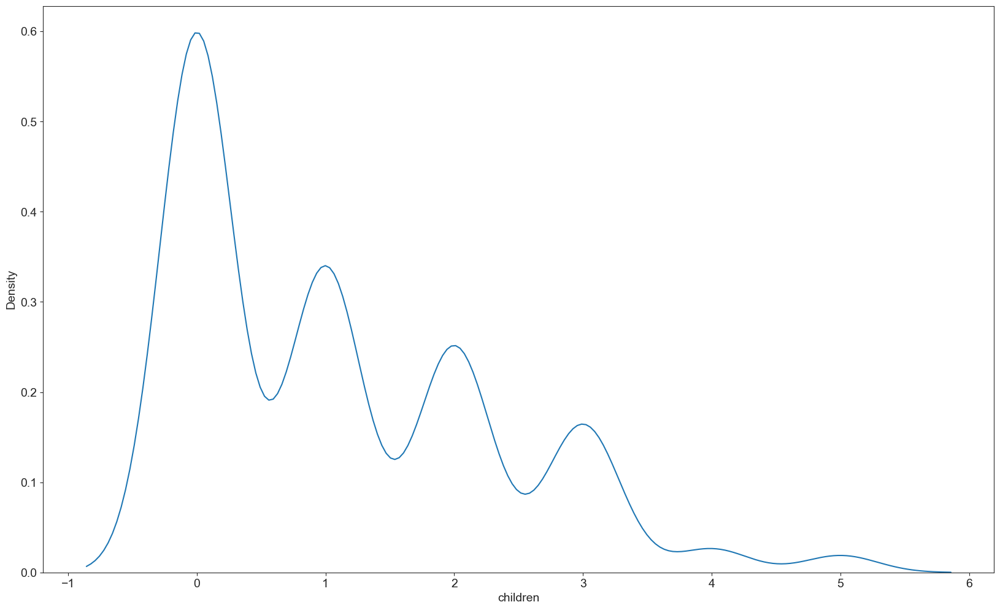

In [42]:
sns.kdeplot(medical_df.children)

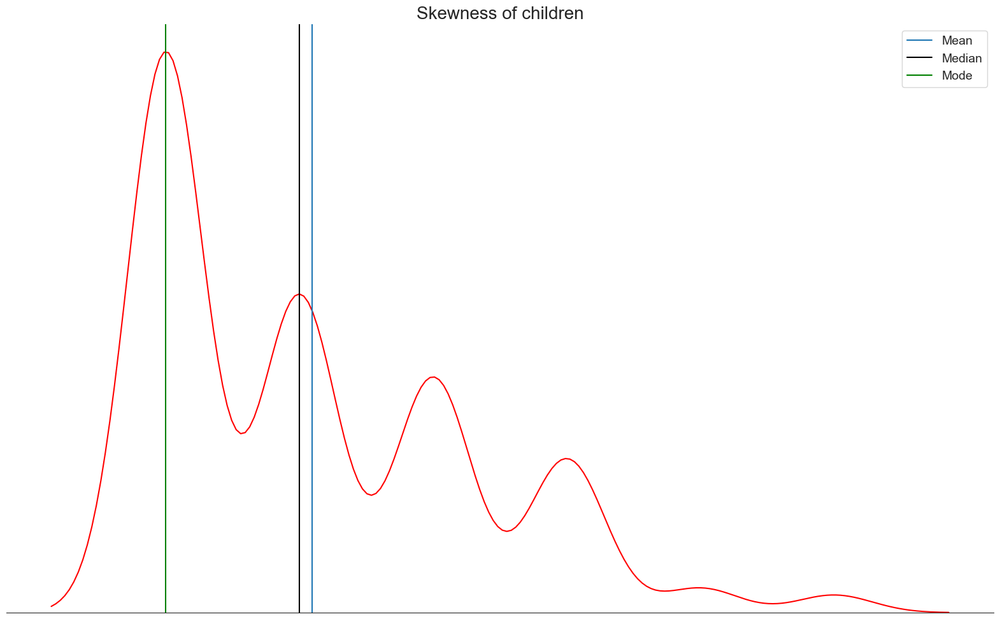

In [43]:
sns.kdeplot(medical_df.children, color="red")

sns.despine(top=True, right=True, left=True)
plt.xticks([])
plt.yticks([])
plt.ylabel("")
plt.xlabel("")
plt.title("Skewness of children", fontdict=dict(fontsize=20))

# Find the mean, median, mode
mean_children = medical_df.children.mean()
median_children = medical_df.children.median()
mode_children = medical_df.children.mode().squeeze()

# Add vertical lines at the position of mean, median, mode
plt.axvline(mean_children, label="Mean")
plt.axvline(median_children, color="black", label="Median")
plt.axvline(mode_children, color="green", label="Mode")

plt.legend();

I will also check kurtosis. Kurtosis focuses on the height, while skewness focuses on the tails of data.

High kurtosis indicates that more values are concentrated around mean than normal distribution and also heavier tails (with outliers), and also shows greater likelihood of extreme events. Low kurtosis shows flat peak, lighter tails, lower likelihood of extreme events; also shows fewer values around the mean, but still more than a normal distribution.

There are three types of kurtosis:
* Mesocurtic distribution (kurtosis = 3, excess kurtosis = 0): perfect normal distribution or very close to it.
* Leptokurtic distribution (kurtosis > 3, excess kurtosis > 0): sharp peak and heavy tails.
* Platykurtic distribution (kurtosis < 3, excess kurtosis < 0): flat peak and light tails.

In [44]:
from scipy.stats import kurtosis

print ("Kurtosis:", (kurtosis(medical_df.children) + 3), "Excess kurtosis:", kurtosis(medical_df.children))

Kurtosis: 3.1957194094827344 Excess kurtosis: 0.19571940948273436


As per above, kurtosis is higher than 3, and excess kurtosis more than 0, which shows that this is leptokurtic curtosis: sharp peak and heavy tails.

Data looks like as expected; more individuals without children are seen in the data. This could also be related in fact that a lot of customers are young age (18 - 20 years old).

In [45]:
age_bins = [0, 20, 30, 40, 50, 60, 100]
age_labels = ['0-20', '21-30', '31-40', '41-50', '51-60', '61-100']

# Create a new column 'age_group' based on the 'age' column
medical_df['age_group'] = pd.cut(medical_df['age'], bins=age_bins, labels=age_labels, right=True)

# Step 2: Group by the 'age_group' and 'children' columns, then count occurrences
age_group_children = medical_df.groupby(['age_group', 'children'], observed=False).size().unstack(fill_value=0)

# Step 3: Display the result
print(age_group_children)

children     0   1   2   3  4  5
age_group                       
0-20       117  26  14   4  1  3
21-30      130  59  48  33  6  2
31-40       61  81  61  39  8  7
41-50       71  92  72  35  6  5
51-60      133  55  36  37  3  1
61-100      61  11   9   9  1  0


C:\Users\Pica\AppData\Local\Temp\ipykernel_21804\2284462266.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



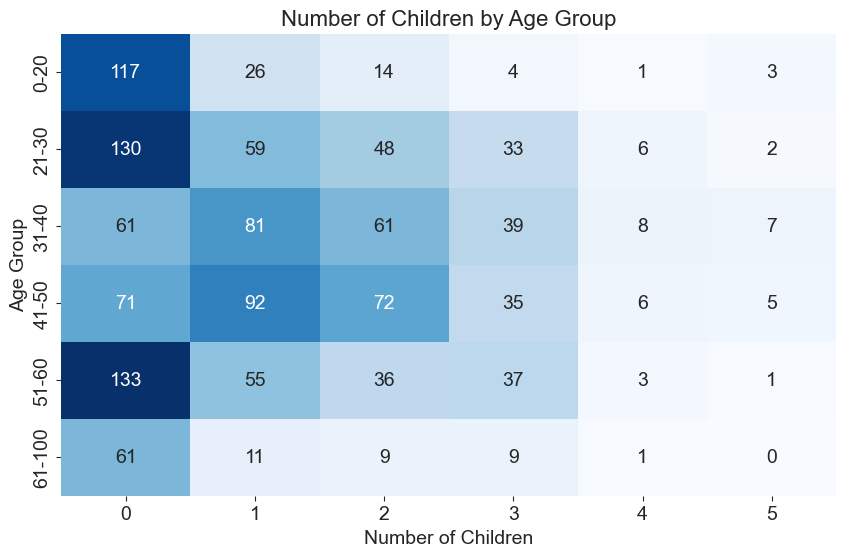

In [46]:
plt.figure(figsize=(10, 6))
sns.heatmap(age_group_children, annot=True, fmt="d", cmap="Blues", cbar=False)

# Add labels and title
plt.title('Number of Children by Age Group', fontsize=16)
plt.ylabel('Age Group', fontsize=14)
plt.xlabel('Number of Children', fontsize=14)

# Show the plot
plt.show()

I will try to compare if having children at all does impact the charges or not later on in bivariate analysis.

### 1.2.4. Smoker

In [47]:
medical_df.smoker.info()

<class 'pandas.core.series.Series'>
Index: 1337 entries, 0 to 1337
Series name: smoker
Non-Null Count  Dtype 
--------------  ----- 
1337 non-null   object
dtypes: object(1)
memory usage: 20.9+ KB


In [48]:
smoker_counts = medical_df['smoker'].value_counts()

In [49]:
fig = make_subplots(rows=1,
                    cols=2,
                    specs=[[{"type": "pie"}, {"type": "pie"}, ]],
                    subplot_titles = ('Smoking habit',
                                      'Annual Medical Charges for Smoking and Non-Smoking customers'))

fig.add_trace(go.Pie(values = smoker_counts.values,
                     labels = smoker_counts.index,
                     domain = dict(x=[0, 0.5]),
                     name = "Proportion of Smokers in dataset",
                     marker_colors = px.colors.qualitative.T10),
              row = 1, col = 1)

fig.add_trace(go.Pie(values = medical_df.charges,
                     labels = medical_df.smoker,
                     domain = dict(x=[0, 0.5]),
                     name = "Proportion of Smokers in dataset",
                     marker_colors=px.colors.qualitative.T10),
              row = 1, col = 2)

It is clearly visible that even if smokers are only 20% of the customers, half of medical expenses are coming to them.

### 1.2.5. Region

In [50]:
region_counts = medical_df['region'].value_counts()

In [51]:
fig = px.pie(medical_df,
             values = region_counts.values,
             names = region_counts.index,
             title = 'Region distribution',
             color_discrete_sequence = px.colors.qualitative.Antique)
fig.update_layout(showlegend=True,
                  bargap = 0.1)
fig.show()

In [52]:
region_counts = medical_df['region'].value_counts()

In [53]:
fig = make_subplots(rows=1,
                    cols=2,
                    specs=[[{"type": "pie"}, {"type": "pie"}, ]],
                    subplot_titles = ('Regions',
                                      'Annual Medical Charges for customers in each region'))

fig.add_trace(go.Pie(values = region_counts.values,
                     labels = region_counts.index,
                     domain = dict(x=[0, 0.5]),
                     name = "Proportion of region in dataset"),
              row = 1, col = 1)

fig.add_trace(go.Pie(values = medical_df.charges,
                     labels = medical_df.region,
                     domain = dict(x=[0, 0.5]),
                     name = "Charges in each region"),
              row = 1, col = 2)
fig.update_layout(showlegend=True,
                  bargap = 0.1)

### 1.2.6. Gender

In [54]:
gender_counts = medical_df['sex'].value_counts()

In [55]:
fig = px.pie(medical_df,
             values = gender_counts.values,
             names = gender_counts.index,
             title = 'Gender distribution',
             color_discrete_sequence = px.colors.qualitative.Safe)
fig.update_layout(showlegend=False,
                  bargap = 0.1)
fig.show()

In [56]:
gender_counts = medical_df['sex'].value_counts()

In [57]:
fig = make_subplots(rows=1,
                    cols=2,
                    specs=[[{"type": "pie"}, {"type": "pie"}, ]],
                    subplot_titles = ('Gender',
                                      'Annual Medical Charges for each gender'))

fig.add_trace(go.Pie(values = gender_counts.values,
                     labels = gender_counts.index,
                     domain = dict(x=[0, 0.5]),
                     name = "Proportion of genders in dataset"),
              row = 1, col = 1)

fig.add_trace(go.Pie(values = medical_df.charges,
                     labels = medical_df.sex,
                     domain = dict(x=[0, 0.5]),
                     name = "Charges by gender"),
              row = 1, col = 2)
fig.update_layout(showlegend=True,
                  bargap = 0.1)

It is possible that the difference in charges appears due to smokers in each group.

In [58]:
# Aggregating data
gender_smoker_counts = medical_df.groupby(['sex', 'smoker']).size()
charges_by_gender_smoker = medical_df.groupby(['sex', 'smoker'])['charges'].sum()

# Preparing labels and values for combined categories
gender_smoker_labels = [f"{gender} ({smoker})" for gender, smoker in gender_smoker_counts.index]
gender_smoker_values = gender_smoker_counts.values
gender_smoker_patterns = ['/' if 'yes' in label else '' for label in gender_smoker_labels]  # Pattern for smokers

charges_labels = [f"{gender} ({smoker})" for gender, smoker in charges_by_gender_smoker.index]
charges_values = charges_by_gender_smoker.values
charges_patterns = ['/' if 'yes' in label else '' for label in charges_labels]  # Pattern for smokers

# Assigning colors for each label
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA']  # Example colors for each segment

# Creating a 1x2 grid for two pie charts
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{"type": "pie"}, {"type": "pie"}]],
                    subplot_titles=('Gender and Smoking Status Distribution',
                                    'Charges by Gender and Smoking Status'))

# Pie chart for gender and smoking status distribution with colors and patterns
fig.add_trace(go.Pie(values=gender_smoker_values,
                     labels=gender_smoker_labels,
                     name="Gender & Smoker Status",
                     marker=dict(colors=colors, pattern=dict(shape=gender_smoker_patterns))),
              row=1, col=1)

# Pie chart for charges by gender and smoking status with colors and patterns
fig.add_trace(go.Pie(values=charges_values,
                     labels=charges_labels,
                     name="Charges by Gender & Smoker Status",
                     marker=dict(colors=colors, pattern=dict(shape=charges_patterns))),
              row=1, col=2)

# Update layout
fig.update_layout(showlegend=True,
                  title_text="Gender and Smoking Status in Medical Charges",
                  title_x=0.5)

# Display the figure
fig.show()

As expected, there are more male smokers than female; because smokers have almost half of the charges, it is also seen in gender graph above.

<div class="alert alert-block alert-warning">
<b>Data Standardisation</b>  
    
Standardisation is needed for distance-based models (PCA, clustering, KNN, SVM), varaibles needs to be standardised also before calculating importance in regression models, it is important for Lasso and Ridge regression models.
    
Standardisation is not needed when we're performing Logistic regresssion and tree-based models.
    
Since normalization has a restricted range and standardization does not, normalization is more likely to be affected by outliers, where standardization is less likely to be affected by outliers.
    
https://builtin.com/data-science/when-and-why-standardize-your-data#:~:text=Normalization%20involves%20scaling%20data%20values%20in%20a%20range%20between%20%5B0,is%20best%20for%20normal%20distributions.
</div>

## 1.3 Bivariate analysis

### 1.3.1. Correlation

I will check how initial correlation matrix looks like before running bivariate analysis.

First of all, I need to encode categorical variables - we have sex, smoker and region.

https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html

In [59]:
medical_df_encoded = pd.get_dummies(medical_df, drop_first=True)

In [60]:
medical_df_encoded

,age,bmi,children,charges,sex_male,smoker_yes,region_northwest,region_southeast,region_southwest,age_group_21-30,age_group_31-40,age_group_41-50,age_group_51-60,age_group_61-100
0,19,27.900,0,16884.92400,False,True,False,False,True,False,False,False,False,False
1,18,33.770,1,1725.55230,True,False,False,True,False,False,False,False,False,False
2,28,33.000,3,4449.46200,True,False,False,True,False,True,False,False,False,False
3,33,22.705,0,21984.47061,True,False,True,False,False,False,True,False,False,False
4,32,28.880,0,3866.85520,True,False,True,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50,30.970,3,10600.54830,True,False,True,False,False,False,False,True,False,False
1334,18,31.920,0,2205.98080,False,False,False,False,False,False,False,False,False,False
1335,18,36.850,0,1629.83350,False,False,False,True,False,False,False,False,False,False
1336,21,25.800,0,2007.94500,False,False,False,False,True,True,False,False,False,False


I noted that the variable count has expanded, I will keep that in mind when I will be working with larger datasets.  

I will now check the suggestion from ChatGPT of how to calculate correlation based on which datatype it is. For numerical - numerical data types, it is suggested to use Pearson or Spearman correlation; for categorical - numerical pair it is suggested to use Point-Biserial correlation, and for categorical data pairs it is suggested to use Cramer's V. All of this is included into code below:

In [61]:
# Function to calculate Cramér's V for categorical variables correlation
def cramers_v(x, y): # x and y will be replaced by categorical columns
    confusion_matrix = pd.crosstab(x, y) # creating confusion matrix
    chi2 = chi2_contingency(confusion_matrix)[0] ## Chi-square test of independence of variables in a contingency table. 
    # [0] means only first value is taken (the test statistic)
    n = confusion_matrix.sum().sum() # total sample size, calculated by summing confusion matrix columns
    phi2 = chi2 / n # normalizing the Chi-square statistic by the total sample size to get phi-squared.
    r, k = confusion_matrix.shape # calculating the dimension of contingency table to further scale phi2 by degrees of freedom
    return np.sqrt(phi2 / min((k-1), (r-1))) # Cramer's V is calculated by computing square root of phi2 scaled by the degrees of freedom

# Function to calculate eta squared for ANOVA
def eta_squared(aov):
    return aov['sum_sq'].iloc[1] / (aov['sum_sq'].iloc[1] + aov['sum_sq'].iloc[2])

# Initialize correlation matrix
cols = medical_df.columns.tolist()
corr_matrix = pd.DataFrame(index=cols, columns=cols)

# Calculate correlations
for col1 in cols:
    for col2 in cols:
        if col1 == col2:
            corr_matrix.loc[col1, col2] = 1.0
        elif medical_df[col1].dtype in [np.int64, np.float64] and medical_df[col2].dtype in [np.int64, np.float64]:
            # Numerical-Numerical
            corr_matrix.loc[col1, col2] = pearsonr(medical_df[col1], medical_df[col2])[0]
        elif medical_df[col1].dtype == 'object' and medical_df[col2].dtype in [np.int64, np.float64]:
            # Categorical-Numerical (ANOVA)
            model = ols(f"{col2} ~ C({col1})", data=medical_df).fit()
            aov_table = sm.stats.anova_lm(model, typ=3)
            eta_sq = eta_squared(aov_table)
            corr_matrix.loc[col1, col2] = eta_sq
        elif medical_df[col1].dtype in [np.int64, np.float64] and medical_df[col2].dtype == 'object':
            # Numerical-Categorical (ANOVA)
            model = ols(f"{col1} ~ C({col2})", data=medical_df).fit()
            aov_table = sm.stats.anova_lm(model, typ=3)
            eta_sq = eta_squared(aov_table)
            corr_matrix.loc[col1, col2] = eta_sq
        elif medical_df[col1].dtype == 'object' and medical_df[col2].dtype == 'object':
            # Categorical-Categorical (Cramér's V)
            corr_matrix.loc[col1, col2] = cramers_v(medical_df[col1], medical_df[col2])
        else:
            corr_matrix.loc[col1, col2] = np.nan

# Convert to numeric for better visualization
corr_matrix = corr_matrix.astype(float)

Visualise the correlation matrix:

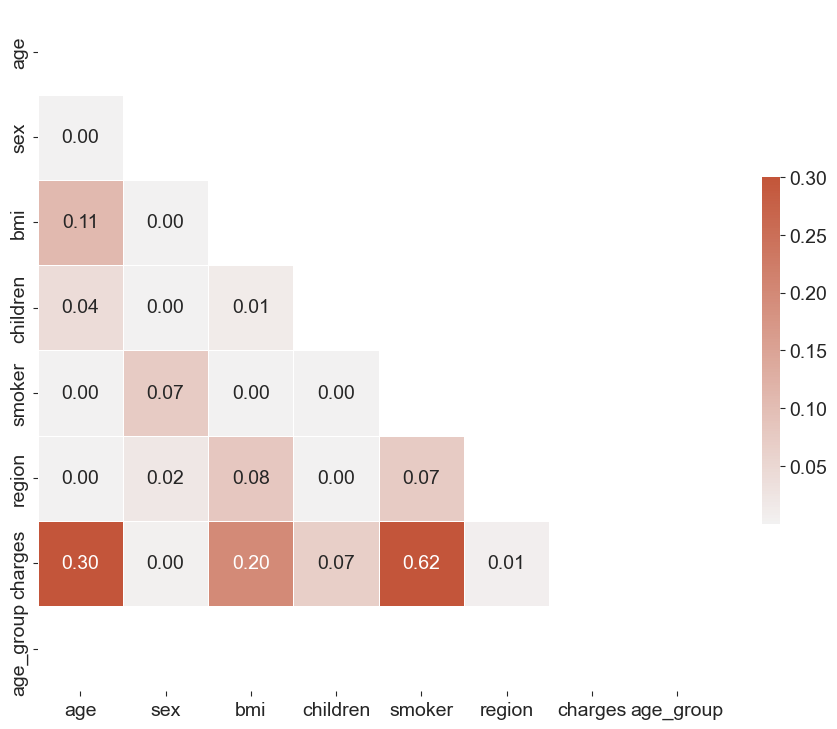

In [62]:
# Mask the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, annot=True, fmt=".2f", cbar_kws={"shrink": .5})

plt.show()

**Numerical-numerical variables:**  
Pearson correlation value was calculated. *The Pearson correlation measures the strength of the linear relationship between two variables. It has a value between -1 to 1, with a value of -1 meaning a total negative linear correlation, 0 being no correlation, and + 1 meaning a total positive correlation.*  

* **Age - Charges:** 0.3 shows *weak* positive correlation, which means that when age value is getting higher, annual medical charges may also be higher.
* **Age - Children:** 0.04 shows *very weak* positive correlation.
* **Age - BMI:** 0.11 shows *very weak* positive correlation.  

* **BMI - Charges:** 0.2 shows *weak* positive correlation, which means that when BMI value is getting higher, annual medical charges may also be higher.
* **BMI - Children:** 0.01 shows *very weak* positive correlation.  

* **Children - Charges:** 0.07 shows *very weak* positive correlation.

**Numerical-categorical variables:**  
Eta-squared was calculated to check the correlation between numerical and categorical variables. Eta-squared indicates the proportion of variance in the numerical variable explained by the categorical variable. Values closer to 1 indicate that a higher proportion of the variance in the numerical variable is explained by the categorical variable. The size of effect can be interpreted using such values: 0.01 - small effect; 0.06 - medium effect and 0.14 for a large effect.

* **Age - Region:** no effect (0.00).
* **Age - Smoker:** no effect (0.00).
* **Age - Sex:** no effect (0.00).  

* **BMI - Region:** medium effect (0.08). This means that certain regions may explain around 8% of variance in BMI.
* **BMI - Smoker:** no effect (0.00).

* **Children - Region:** no effect (0.00).
* **Children - Smoker:** no effect (0.00).

**Categorical-categorical variables:**  
Cramér's V is an effect size measurement for the chi-square test of independence. It measures how strongly two categorical fields are associated. Common threshold for interpreting Cramér's V is: 0.00 to 0.10 - weak; 0.10 to 0.30 - moderate; 0.30 to 0.50 - strong; 0.50 to 1.00 - very strong association.

* **Sex - Region:** weak association (0.02).
* **Sex - Smoker:** weak association (0.07).

* **Smoker - Region:** weak association (0.07).

Based on calculations above, it is worth mentioning that being a smoker can impact annual medical charges significantly and such customers should be treated as high-risk. This was also visible in the univariate data analysis chart, where only 1/4 of the sample size are smokers, but that 1/4 is taking up to 1/2 annual medical charges of whole population.

Age is also an impact, however, the correlation is not as high and is considered *weak* at this point. This however might be caused by relatively small sample size, where younger people (aged 18 - 19) appear more than elders. That means there is simply not enough data to calculate how age (in this case - old age) is impacting annual medical expenses.

Another mention is BMI, which also shows weak correlation to medical charges.

Interesting find is region, which impacts BMI a moderately. Might be a coincidence, but also could show that some of regions are holding more overweigth customers. Since BMI itself doesn't increase charges by a lot, the fact region may impact BMI doesn't mean region-BMI correlation is important.

Now I will try to visualise my above findigs to check how pair correlation looks.


#### 1.3.1.1. Smoker - Charges

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



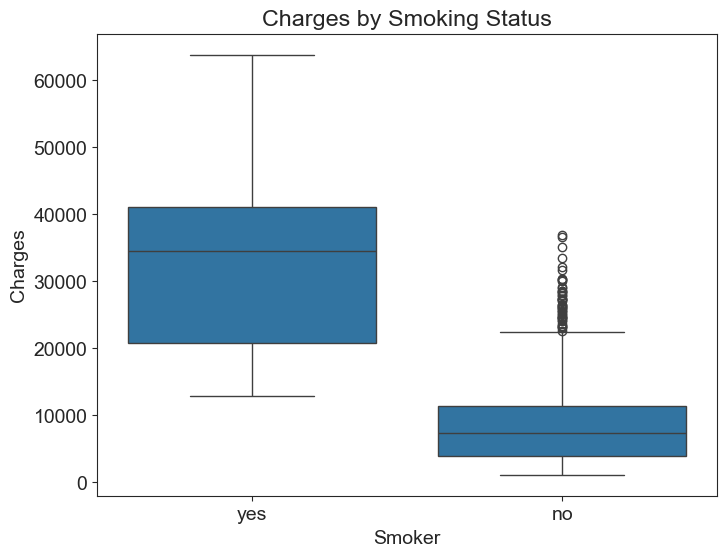

In [63]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='smoker', y='charges', data=medical_df)
plt.title('Charges by Smoking Status')
plt.xlabel('Smoker')
plt.ylabel('Charges')
plt.show()

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



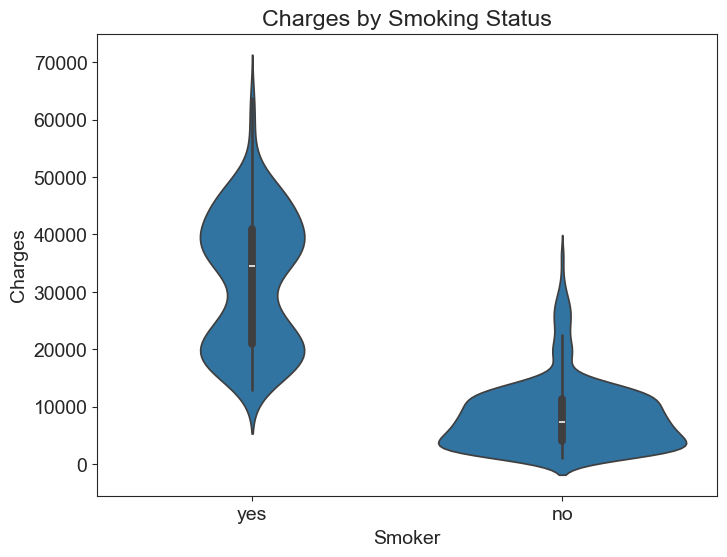

In [64]:
# Violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='smoker', y='charges', data=medical_df)
plt.title('Charges by Smoking Status')
plt.xlabel('Smoker')
plt.ylabel('Charges')
plt.show()

#### 1.3.1.2. Age - Charges

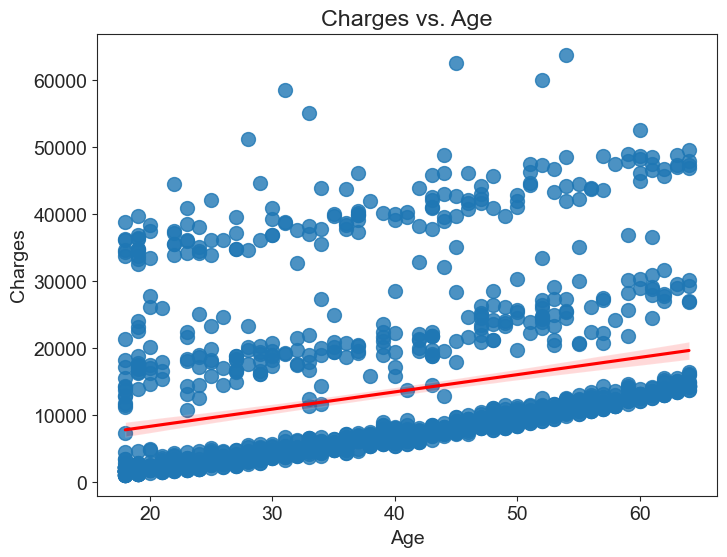

In [65]:
# Scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='age', y='charges', data=medical_df, scatter_kws={'s':100}, line_kws={'color':'red'})
plt.title('Charges vs. Age')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.show()

#### 1.3.1.3. BMI - Charges

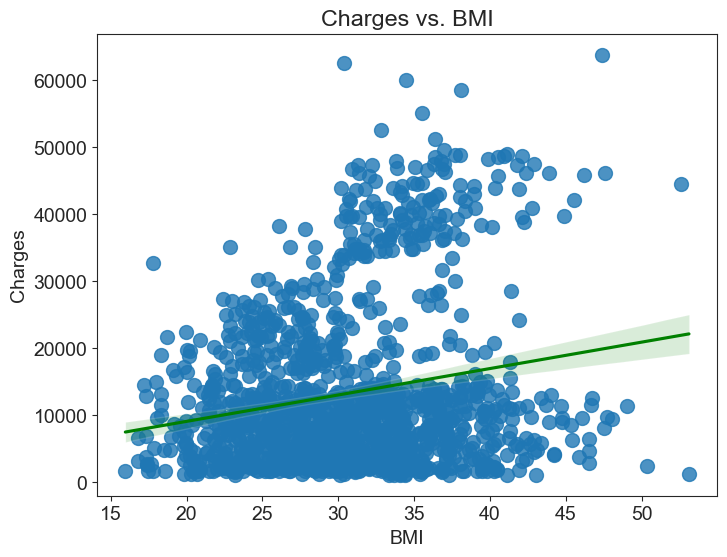

In [66]:
# Scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='bmi', y='charges', data=medical_df, scatter_kws={'s':100}, line_kws={'color':'green'})
plt.title('Charges vs. BMI')
plt.xlabel('BMI')
plt.ylabel('Charges')
plt.show()

#### 1.3.1.3. Region - BMI

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



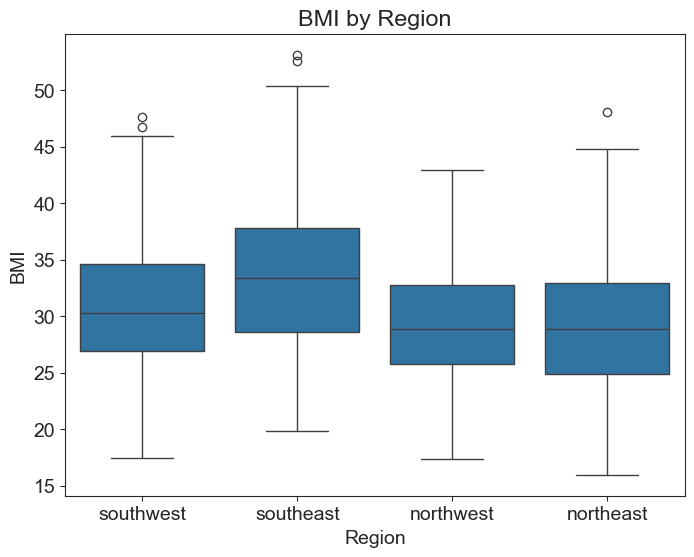

In [67]:
# Box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='region', y='bmi', data=medical_df)
plt.title('BMI by Region')
plt.xlabel('Region')
plt.ylabel('BMI')
plt.show()

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

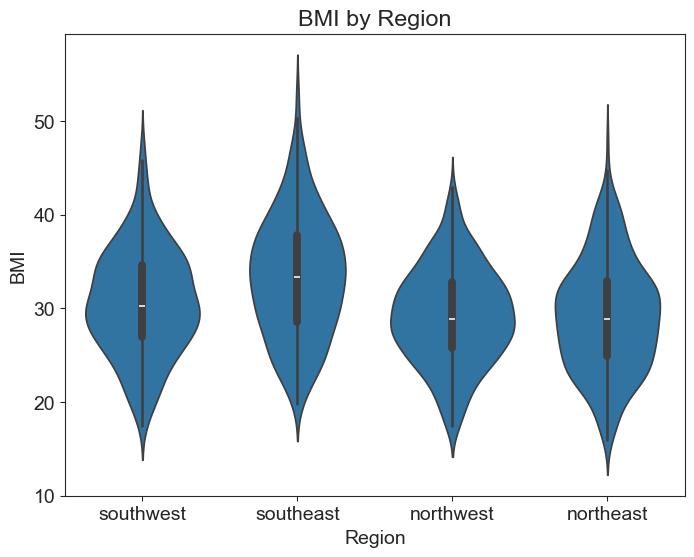

In [68]:
# Violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='region', y='bmi', data=medical_df)
plt.title('BMI by Region')
plt.xlabel('Region')
plt.ylabel('BMI')
plt.show()

Interpretation and comments.

#### 1.3.1.1. Correlation between numerical variables

Since our data has both numerical and categorical data, I will try to perform correlation analysis in a few diferent ways.

In [69]:
medical_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1337 entries, 0 to 1337
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        1337 non-null   int64   
 1   sex        1337 non-null   object  
 2   bmi        1337 non-null   float64 
 3   children   1337 non-null   int64   
 4   smoker     1337 non-null   object  
 5   region     1337 non-null   object  
 6   charges    1337 non-null   float64 
 7   age_group  1337 non-null   category
dtypes: category(1), float64(2), int64(2), object(3)
memory usage: 85.1+ KB


In [70]:
from scipy.stats import pointbiserialr, chi2_contingency

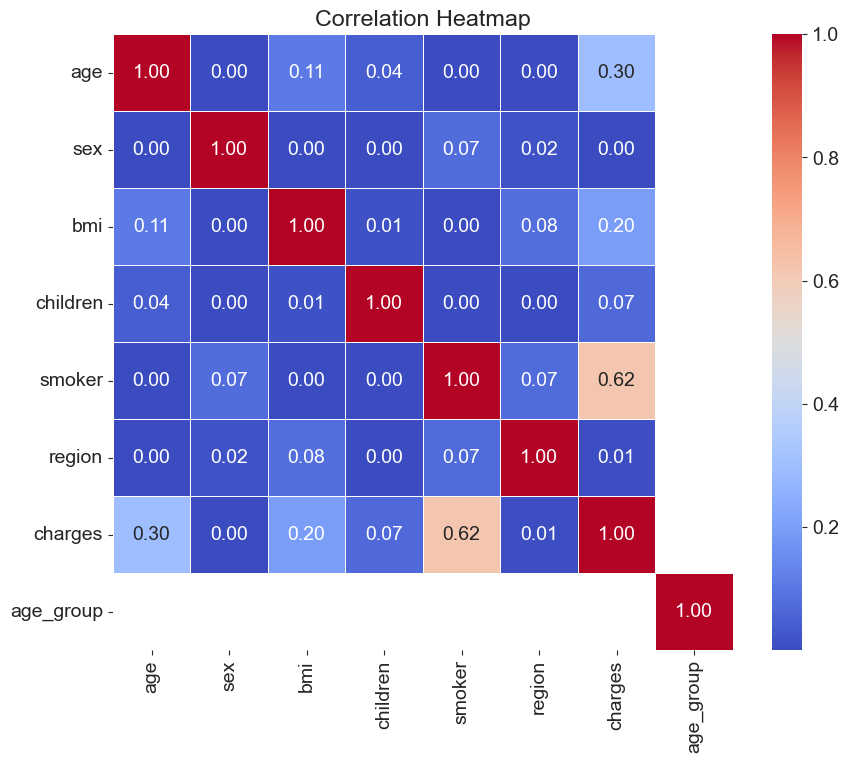

In [71]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

In [72]:
# saving session
dill.dump_session('medical_expenses.db')

In [73]:
dill.load_session('medical_expenses.db')

### 1.3.2. Comparative statistics

Comparative statistics are used to check whether two groups of data are significantly different.

#### 1.3.2.1. T-Test

T-test compares means of two groups to check whether it differs significantly:  
* Null hypothesis $H_0$: means of the two groups are equal.  
* Alternative hypothesis $H_A$: means of the two groups are different.  

Since t-test ir a parametric test, it makes following assumptions about given data:
* Data are independent;
* Data are normally distributed;
* Have similar amount of variance within each group (homogeneity of variance).


To run the T-Test, I need to create arrays for different data groups.

In [74]:
medical_df

,age,sex,bmi,children,smoker,region,charges,age_group
0,19,female,27.900,0,yes,southwest,16884.92400,0-20
1,18,male,33.770,1,no,southeast,1725.55230,0-20
2,28,male,33.000,3,no,southeast,4449.46200,21-30
3,33,male,22.705,0,no,northwest,21984.47061,31-40
4,32,male,28.880,0,no,northwest,3866.85520,31-40
...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,41-50
1334,18,female,31.920,0,no,northeast,2205.98080,0-20
1335,18,female,36.850,0,no,southeast,1629.83350,0-20
1336,21,female,25.800,0,no,southwest,2007.94500,21-30


    ##### 1.3.2.1.1. Smoker and charges

In [75]:
smoker = medical_df[medical_df.smoker == 'yes'].charges

In [76]:
smoker_array = smoker.to_numpy()

In [77]:
non_smoker = medical_df[medical_df.smoker == 'no'].charges

In [78]:
non_smoker_array = non_smoker.to_numpy()

Checking if data is normally distributed using Kolmogorov-Smirnov test:

In [79]:
mu_smoker = np.mean(smoker_array)
sigma_smoker = np.std(smoker_array)

In [80]:
from scipy.stats import kstest, norm

kstest(smoker_array, 'norm', args = (mu_smoker, sigma_smoker))

KstestResult(statistic=0.1217847044875317, pvalue=0.0005333069082692723, statistic_location=22478.6, statistic_sign=1)

Shapiro-Wilk test:

In [81]:
from scipy.stats import shapiro

shapiro(smoker_array)

ShapiroResult(statistic=0.9395519386965634, pvalue=3.6249900590074145e-09)

Anderson-Darling test:

In [82]:
from scipy.stats import anderson

anderson(smoker_array, dist = 'norm')

AndersonResult(statistic=6.353365256066354, critical_values=array([0.568, 0.647, 0.776, 0.905, 1.077]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=32050.23183153284, scale=11541.547175589121)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

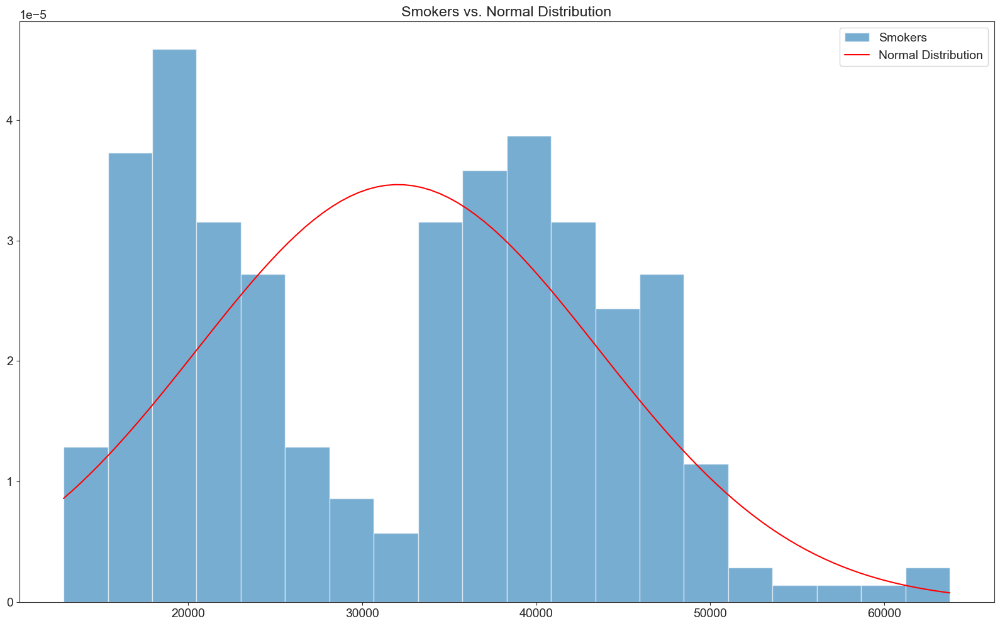

In [83]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(smoker_array), np.std(smoker_array)
x = np.linspace(min(smoker_array), max(smoker_array), 100)
normal_curve = norm.pdf(x, loc=mu_smoker, scale=sigma_smoker)

# Plot your data and the normal distribution
plt.hist(smoker_array, bins=20, density=True, alpha=0.6, label='Smokers')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("Smokers vs. Normal Distribution")
plt.show()

All three tests shows that data is not normally distributed for smokers.

I will check non-smokers data below:

In [84]:
mu_non_smoker = np.mean(non_smoker_array)
sigma_non_smoker = np.std(non_smoker_array)

In [85]:
kstest(non_smoker_array, 'norm', args = (mu_non_smoker, sigma_non_smoker))

KstestResult(statistic=0.11089113052189126, pvalue=7.694179434202162e-12, statistic_location=1121.8739, statistic_sign=-1)

In [86]:
shapiro(non_smoker_array)

ShapiroResult(statistic=0.872913393508985, pvalue=1.5035032808411558e-28)

In [87]:
anderson(non_smoker_array, dist = 'norm')

AndersonResult(statistic=27.703077713854555, critical_values=array([0.574, 0.654, 0.784, 0.915, 1.088]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=8440.660306508937, scale=5992.973800106525)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

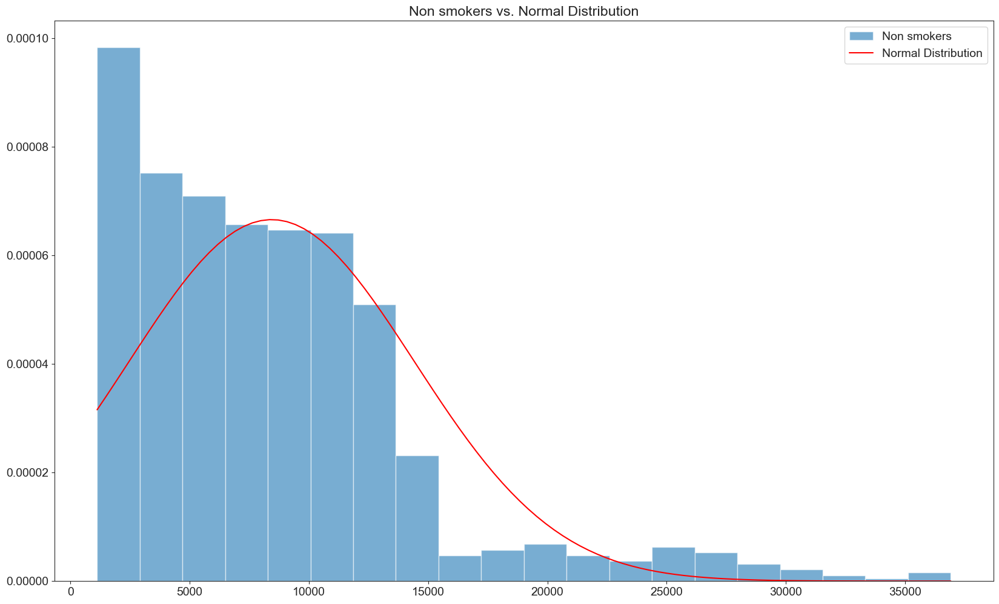

In [88]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(non_smoker_array), np.std(non_smoker_array)
x = np.linspace(min(non_smoker_array), max(non_smoker_array), 100)
normal_curve = norm.pdf(x, loc=mu_non_smoker, scale=sigma_non_smoker)

# Plot your data and the normal distribution
plt.hist(non_smoker_array, bins=20, density=True, alpha=0.6, label='Non smokers')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("Non smokers vs. Normal Distribution")
plt.show()

For both groups (smokers and non-smokers) data is not normally distributed. I will perform t-test anyway because of large sample size. Before that, I will use Levene test and F test to determine variances.

In [89]:
from scipy.stats import levene

levene(smoker_array, non_smoker_array)

LeveneResult(statistic=332.47137394800666, pvalue=1.670117565125241e-66)

p value is less than 0.05 which means the group variances are significantly different.

I will check the same using F test as well.

In [90]:
# Calculate the sample variances
variance_smoker = np.var(smoker_array, ddof=1)
variance_non_smoker = np.var(non_smoker_array, ddof=1)
 
# Calculate the F-statistic
f_value = variance_smoker / variance_non_smoker
 
# Calculate the degrees of freedom
df1 = len(smoker_array) - 1
df2 = len(non_smoker_array) - 1
 
# Calculate the p-value
p_value = 1 - stats.f.cdf(f_value, df1, df2)
 
# Print the results
print('Degree of freedom 1:',df1)
print('Degree of freedom 2:',df2)
print("F-statistic:", f_value)
print("p-value:", p_value)

Degree of freedom 1: 273
Degree of freedom 2: 1062
F-statistic: 3.7088844575282325
p-value: 1.1102230246251565e-16


Both tests agree that variances are not equal, therefore, to run t-test I will use Welch's t-test.

In [91]:
stats.ttest_ind(a = smoker_array, b = non_smoker_array, equal_var = False)

TtestResult(statistic=32.7423097372529, pvalue=6.261720774727631e-103, df=311.87741711542276)

If $p$ < $\alpha$, then $H_0$ is rejected.
If $p$ > $\alpha$, then $H_0$ is accepted.

In this case, $H_0$ is rejected, which means that there is a significant difference in means.

Welch's t-test was performed, and it showed that the difference in charges between smokers (mean: 32050.23, standard deviation: 11541.55) and non-smokers (mean: 8440.66, standard deviation: 5992.97) was significant ($t(312) = 32.74; p < 0.0001$).

##### 1.3.2.1.1. Sex and charges

In [92]:
sex_m = medical_df[medical_df.sex == 'male'].charges

In [93]:
sex_m_array = sex_m.to_numpy()

In [94]:
sex_f = medical_df[medical_df.sex == 'female'].charges

In [95]:
sex_f_array = sex_f.to_numpy()

Checking if data is normally distributed using Kolmogorov-Smirnov test:

In [96]:
mu_sex_m = np.mean(sex_m_array)
sigma_sex_m = np.std(sex_m_array)

In [97]:
from scipy.stats import kstest, norm

stats.kstest(sex_m_array, 'norm', args = (mu_sex_m, sigma_sex_m))

KstestResult(statistic=0.19815489701395844, pvalue=1.0576071664086254e-23, statistic_location=13143.86485, statistic_sign=1)

Shapiro-Wilk test:

In [98]:
from scipy.stats import shapiro

shapiro(sex_m_array)

ShapiroResult(statistic=0.8230361988228667, pvalue=1.270698716763824e-26)

Anderson-Darling test:

In [99]:
from scipy.stats import anderson

anderson(sex_m_array, dist = 'norm')

AndersonResult(statistic=43.48515507323009, critical_values=array([0.573, 0.652, 0.782, 0.913, 1.086]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=13974.998863762965, scale=12971.958662967088)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

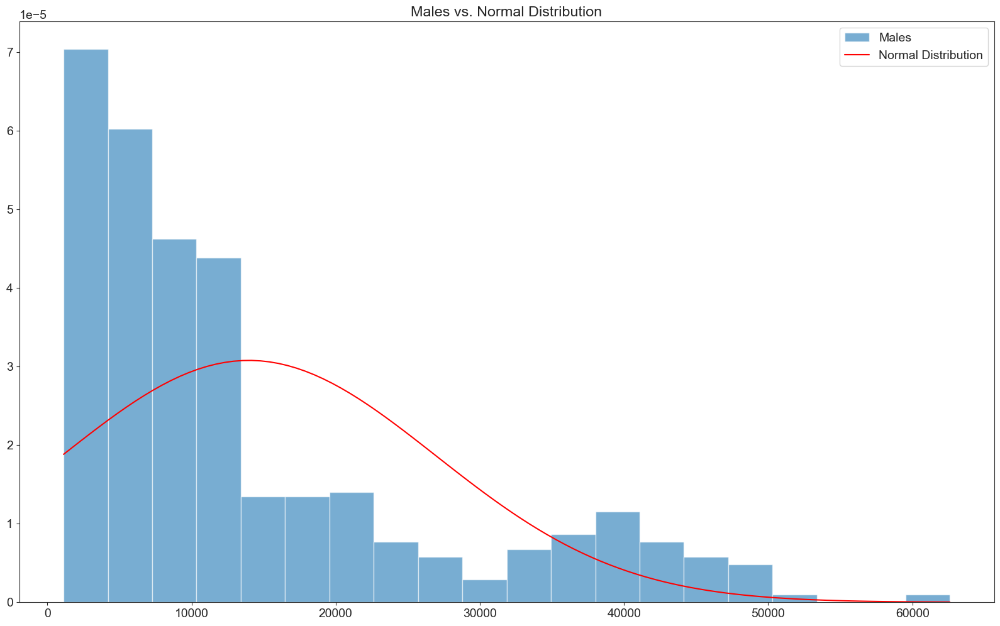

In [100]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(sex_m_array), np.std(sex_m_array)
x = np.linspace(min(sex_m_array), max(sex_m_array), 100)
normal_curve = norm.pdf(x, loc=mu_sex_m, scale=sigma_sex_m)

# Plot your data and the normal distribution
plt.hist(sex_m_array, bins=20, density=True, alpha=0.6, label='Males')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("Males vs. Normal Distribution")
plt.show()

All three tests shows that data is not normally distributed for males.

I will check non-smokers data below:

In [101]:
mu_sex_f = np.mean(sex_f_array)
sigma_sex_f = np.std(sex_f_array)

In [102]:
stats.kstest(sex_f_array, 'norm', args = (mu_sex_f, sigma_sex_f))

KstestResult(statistic=0.18425309917462995, pvalue=3.8265539000084363e-20, statistic_location=14474.675, statistic_sign=1)

In [103]:
shapiro(sex_f_array)

ShapiroResult(statistic=0.8053936070521869, pvalue=1.8303726201913448e-27)

In [104]:
anderson(sex_f_array, dist = 'norm')

AndersonResult(statistic=40.40939521998689, critical_values=array([0.573, 0.652, 0.782, 0.913, 1.086]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=12569.578843835347, scale=11128.703800915438)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

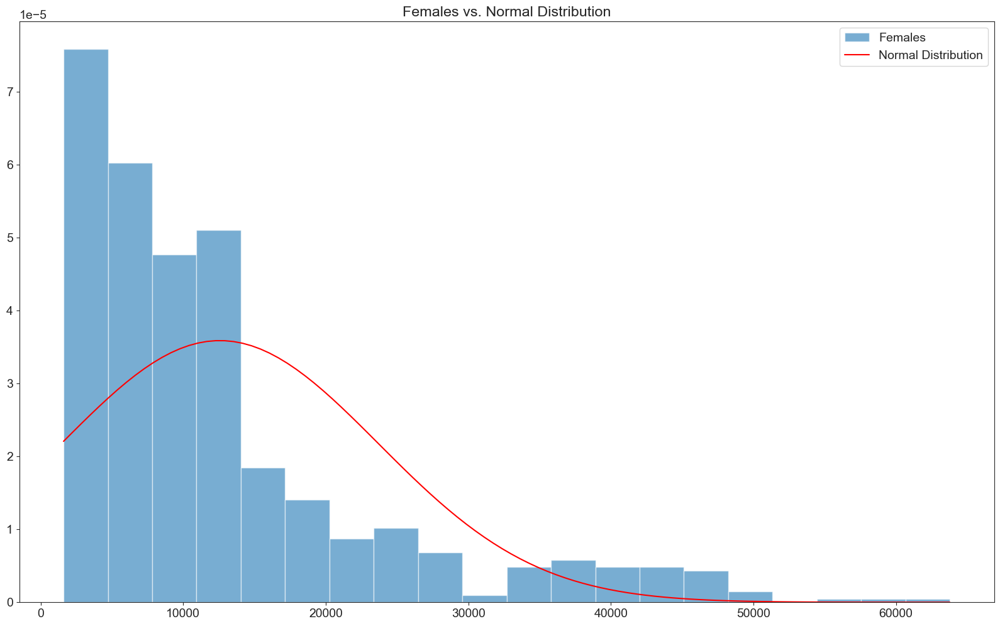

In [105]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(sex_f_array), np.std(sex_f_array)
x = np.linspace(min(sex_f_array), max(sex_f_array), 100)
normal_curve = norm.pdf(x, loc=mu, scale=sigma)

# Plot your data and the normal distribution
plt.hist(sex_f_array, bins=20, density=True, alpha=0.6, label='Females')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("Females vs. Normal Distribution")
plt.show()

For both groups (smokers and non-smokers) data is not normally distributed. I will perform t-test anyway because of large sample size. Before that, I will use Levene test and F test to determine variances.

In [106]:
from scipy.stats import levene

levene(sex_m_array, sex_f_array)

LeveneResult(statistic=9.924363781581253, pvalue=0.0016672604848662713)

p value is less than 0.05 which means the group variances are significantly different.

I will check the same using F test as well.

In [107]:
# Calculate the sample variances
variance_male = np.var(sex_m_array, ddof=1)
variance_female = np.var(sex_f_array, ddof=1)
 
# Calculate the F-statistic
f_value = variance_male / variance_female
 
# Calculate the degrees of freedom
df1 = len(sex_m_array) - 1
df2 = len(sex_f_array) - 1
 
# Calculate the p-value
p_value = 1 - stats.f.cdf(f_value, df1, df2)
 
# Print the results
print('Degree of freedom 1:',df1)
print('Degree of freedom 2:',df2)
print("F-statistic:", f_value)
print("p-value:", p_value)

Degree of freedom 1: 674
Degree of freedom 2: 661
F-statistic: 1.3586948997511061
p-value: 3.938534720526743e-05


Both tests agree that variances are not equal, therefore, to run t-test I will use Welch's t-test.

In [108]:
import scipy.stats as stats

In [109]:
stats.ttest_ind(a = sex_m_array, b = sex_f_array, equal_var = False)

TtestResult(statistic=2.1275372170149476, pvalue=0.03356154763676579, df=1311.8540822395769)

If $p$ < $\alpha$, then $H_0$ is rejected.
If $p$ > $\alpha$, then $H_0$ is accepted.

In this case, $H_0$ is rejected, which means that there is a significant difference in means.

Welch's t-test was performed, and it showed that the difference in charges between males (mean: 13975, standard deviation: 12962.35) and females (mean: 12569.58, standard deviation: 11120.3) was significant ($t(2) = 1311.85; p < 0.033$).

In [110]:
print(sex_m_array.mean(), sex_m_array.std(), sex_f_array.mean(), sex_f_array.std())

13974.998863762965 12962.34624322321 12569.578843835347 11120.29525887552


##### 1.3.2.1.3. Chlidren and charges

I will try to check if having children, regardless of children cound, have any significant affect on charges.

In [111]:
has_children = medical_df[medical_df.children > 0].charges

In [112]:
has_children_array = has_children.to_numpy()

In [113]:
no_children = medical_df[medical_df.children == 0].charges

In [114]:
no_children_array = no_children.to_numpy()

Checking if data is normally distributed using Kolmogorov-Smirnov test:

In [115]:
mu_has_children = np.mean(has_children_array)
sigma_has_children = np.std(has_children_array)

In [116]:
from scipy.stats import kstest, norm

stats.kstest(has_children_array, 'norm', args = (mu_has_children, sigma_has_children))

KstestResult(statistic=0.21426066535474925, pvalue=2.911793028448231e-31, statistic_location=12646.207, statistic_sign=1)

Shapiro-Wilk test:

In [117]:
from scipy.stats import shapiro

shapiro(has_children_array)

ShapiroResult(statistic=0.7925189756064888, pvalue=4.344519684840125e-30)

Anderson-Darling test:

In [118]:
from scipy.stats import anderson

anderson(has_children_array, dist = 'norm')

AndersonResult(statistic=58.83102489190196, critical_values=array([0.573, 0.653, 0.783, 0.913, 1.086]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=13949.941093481675, scale=12138.305910566816)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

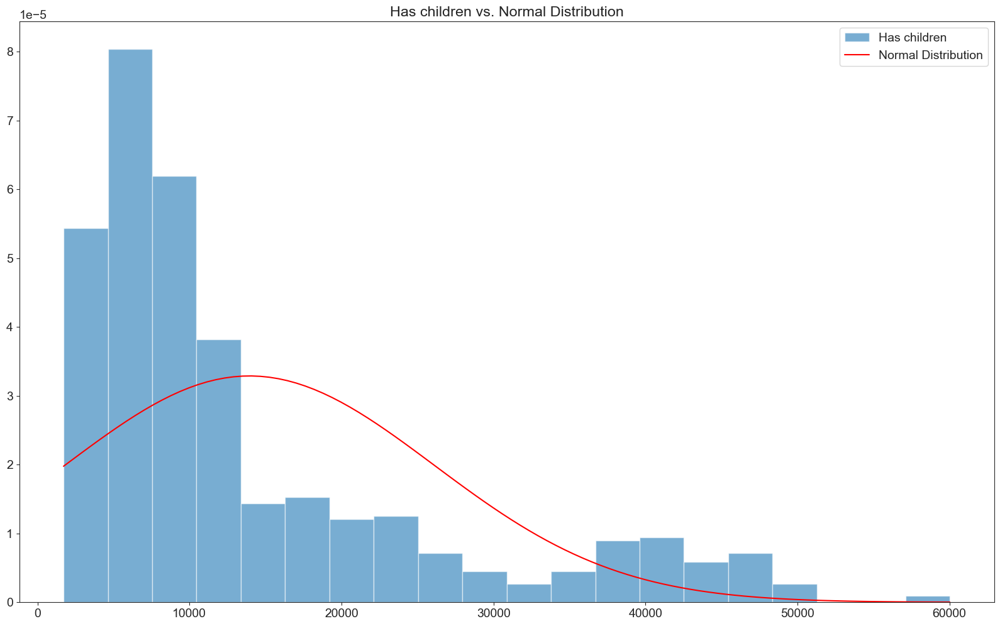

In [119]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(has_children_array), np.std(has_children_array)
x = np.linspace(min(has_children_array), max(has_children_array), 100)
normal_curve = norm.pdf(x, loc=mu, scale=sigma)

# Plot your data and the normal distribution
plt.hist(has_children_array, bins=20, density=True, alpha=0.6, label='Has children')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("Has children vs. Normal Distribution")
plt.show()

All three tests shows that data is not normally distributed for individuals, who have children.

I will check individuals without children data below:

In [120]:
mu_no_children = np.mean(no_children_array)
sigma_no_children = np.std(no_children_array)

In [121]:
stats.kstest(no_children_array, 'norm', args = (mu_no_children, sigma_no_children))

KstestResult(statistic=0.18388153524452244, pvalue=1.9797716314378782e-17, statistic_location=14451.83515, statistic_sign=1)

In [122]:
shapiro(no_children_array)

ShapiroResult(statistic=0.8172767927664188, pvalue=5.448651955110425e-25)

In [123]:
anderson(no_children_array, dist = 'norm')

AndersonResult(statistic=33.20091081102851, critical_values=array([0.572, 0.652, 0.782, 0.912, 1.085]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=12384.69534422164, scale=12025.424151550085)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')

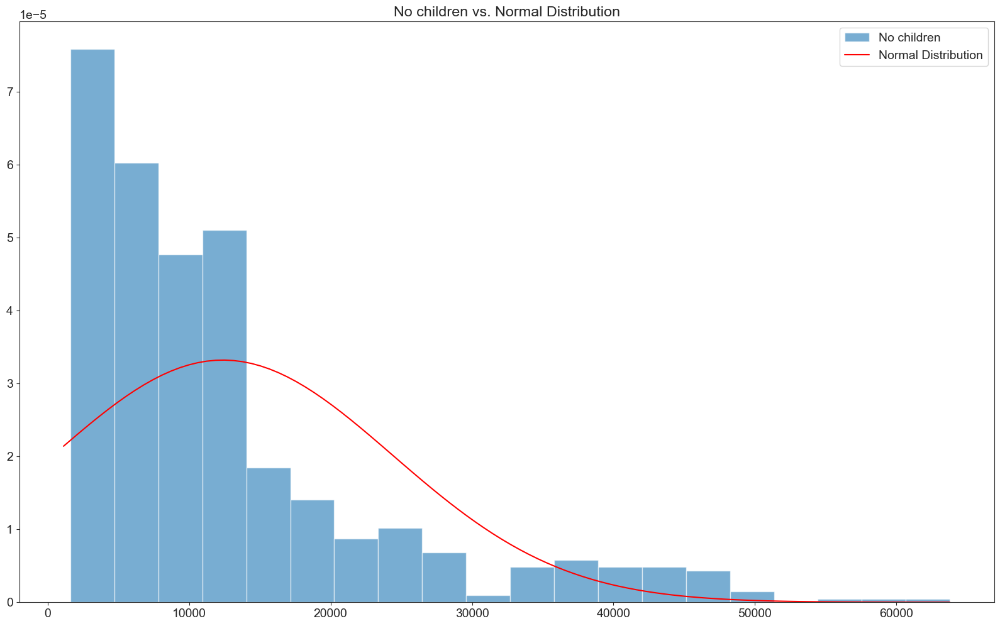

In [124]:
# Generate a normal distribution with the same mean and std as your data
mu, sigma = np.mean(no_children_array), np.std(no_children_array)
x = np.linspace(min(no_children_array), max(no_children_array), 100)
normal_curve = norm.pdf(x, loc=mu, scale=sigma)

# Plot your data and the normal distribution
plt.hist(sex_f_array, bins=20, density=True, alpha=0.6, label='No children')
plt.plot(x, normal_curve, 'r-', label='Normal Distribution')
plt.legend()
plt.title("No children vs. Normal Distribution")
plt.show()

For both groups regardless data is not normally distributed. I will perform t-test anyway because of large sample size. Before that, I will use Levene test and F test to determine variances.

In [125]:
from scipy.stats import levene

levene(has_children_array, no_children_array)

LeveneResult(statistic=0.352297737095088, pvalue=0.5529158572659985)

p value is more than 0.05 which means the group variances are not significantly different.

I will check the same using F test as well.

In [126]:
# Calculate the sample variances
variance_has_children = np.var(has_children_array, ddof=1)
variance_no_children = np.var(no_children_array, ddof=1)
 
# Calculate the F-statistic
f_value = variance_has_children / variance_no_children
 
# Calculate the degrees of freedom
df1 = len(has_children_array) - 1
df2 = len(no_children_array) - 1
 
# Calculate the p-value
p_value = 1 - stats.f.cdf(f_value, df1, df2)
 
# Print the results
print('Degree of freedom 1:',df1)
print('Degree of freedom 2:',df2)
print("F-statistic:", f_value)
print("p-value:", p_value)

Degree of freedom 1: 763
Degree of freedom 2: 572
F-statistic: 1.0188619651017803
p-value: 0.40711330696021497


Both tests agree that variances are equal, therefore, I will use t-test.

In [127]:
import scipy.stats as stats

In [128]:
stats.ttest_ind(a = has_children_array, b = no_children_array, equal_var = True)

TtestResult(statistic=2.342674957951972, pvalue=0.019292282503621135, df=1335.0)

If $p$ < $\alpha$, then $H_0$ is rejected.
If $p$ > $\alpha$, then $H_0$ is accepted.

In this case, $H_0$ is rejected, which means that there is a significant difference in means.

Student's t-test was performed, and it showed that the difference in charges between individuals with children (mean: 13949.94, standard deviation: 12130.36) and and individuals without children (mean: 12384.7, standard deviation: 12014.93) was significant ($t(2) = 1335; p < 0.019$).

In [129]:
print(has_children_array.mean(), has_children_array.std(), no_children_array.mean(), no_children_array.std())

13949.941093481675 12130.359391934038 12384.69534422164 12014.926179971138


Up until now, we checked 1-by-1 pairs and performed t-test for smoker/non smoker and gender groups. The Welch's t-test helped to see, that even if no correlation was found, there is a statistically significant difference in both gender groups; that means that sex may be important in the amount of charges we see.

#### 1.3.2.2. ANOVA

##### 1.3.2.2.1.  Region and Charges

Since previous data analysis showed that 'Charges' column is not normally distributed, I cannot perform ANOVA analysis, but I still want to check whether different groups of data (region) are impactful for the groups. In this case I will use Kruskal-Wallis test.

All regions will be sliced into four independent groups first.

In [130]:
medical_df

,age,sex,bmi,children,smoker,region,charges,age_group
0,19,female,27.900,0,yes,southwest,16884.92400,0-20
1,18,male,33.770,1,no,southeast,1725.55230,0-20
2,28,male,33.000,3,no,southeast,4449.46200,21-30
3,33,male,22.705,0,no,northwest,21984.47061,31-40
4,32,male,28.880,0,no,northwest,3866.85520,31-40
...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,41-50
1334,18,female,31.920,0,no,northeast,2205.98080,0-20
1335,18,female,36.850,0,no,southeast,1629.83350,0-20
1336,21,female,25.800,0,no,southwest,2007.94500,21-30


In [131]:
southwest = medical_df[medical_df.region == "southwest"].charges.to_list()
southeast = medical_df[medical_df.region == "southeast"].charges.to_list()
northwest = medical_df[medical_df.region == "northwest"].charges.to_list()
northeast = medical_df[medical_df.region == "northeast"].charges.to_list()

I will perform Kruskal-Wallis test:

In [132]:
from scipy.stats import kruskal

kruskal(southwest, southeast, northwest, northeast)

KruskalResult(statistic=4.622506584464645, pvalue=0.20161983372311595)

Since p value 0.2 is greater than alpha value 0.05 that means we cannot reject null hypothesis. It appears the region means are not different and region may have no significant value to the charges.

##### 1.3.2.2.2.  Age Group and Charges

Since I already created age groups variable, I can now perform analysis on different age groups and their significance. This will let me understand of different age groups have statistically significant difference in mean, even though I already found that moderate positive correlation between age and charges exist, suggesting that when age increases, charges may also increase.

In [133]:
age_020 = medical_df[medical_df.age_group == "0-20"].charges.to_list()
age_2130 = medical_df[medical_df.age_group == "21-30"].charges.to_list()
age_3140 = medical_df[medical_df.age_group == "31-40"].charges.to_list()
age_4150 = medical_df[medical_df.age_group == "41-50"].charges.to_list()
age_5160 = medical_df[medical_df.age_group == "51-60"].charges.to_list()
age_61100 = medical_df[medical_df.age_group == "61-100"].charges.to_list()

In [134]:
print(len(age_020), len(age_2130), len(age_3140), len(age_4150), len(age_5160), len(age_61100))

165 278 257 281 265 91


In [135]:
print(len(age_020) + len(age_2130) + len(age_3140) + len(age_4150) + len(age_5160) + len(age_61100))

1337


In [136]:
from scipy.stats import kruskal

kruskal(age_020, age_2130, age_3140, age_4150, age_5160, age_61100)

KruskalResult(statistic=362.1008067493385, pvalue=4.3397532956401474e-76)

Since p value 0.0001 is less than alpha value 0.05 that means we can reject null hypothesis. It appears the different age group means are statistically different and specific age group may have significant value to the charges. This confirms that age is statistically important to charges, as we found before.

#### 1.3.2.2.3.  BMI Group and Charges

Previously it was confirmed that BMI and charges has weak positive correlation, meaning that when BMI increases, charges may increase as well. I will perform Kruskal-Wallis test on different BMI groups to get more insights on whether the individuals in different BMI groups have different charges overall.

<div style="text-align: left;"> 
    <p>
    <table style="margin-left: 0;">
      <tr>
        <th>BMI</th>
        <th>Value</th>
      </tr>
      <tr>
        <td>Underweight</td>
        <td>below 18.5</td>
      </tr>
      <tr>
        <td>Normal</td>
        <td>18.5–24.9</td>
      </tr>
      <tr>
        <td>Overweight</td>
        <td>25.0–29.9</td>
      </tr>
      <tr>
        <td>Obesity</td>
        <td>30.0 and above</td>
      </tr>
    </table>
</div>


In [137]:
BMI_bins = [0, 18.40, 25.00, 30.00, 100.00]
BMI_labels = ['Underweight', 'Normal', 'Overweight', 'Obesity']

from decimal import Decimal, ROUND_HALF_UP

def round_up(n, decimals=2):
    return Decimal(str(n)).quantize(Decimal('1e-{0}'.format(decimals)), rounding=ROUND_HALF_UP)

# Apply the rounding to the 'bmi' column
medical_df['bmi_rounded'] = medical_df['bmi'].apply(lambda x: round_up(x, 1))

# Create a new column 'BMI_group' based on the rounded BMI column
medical_df['BMI_group'] = pd.cut(medical_df['bmi_rounded'], bins=BMI_bins, labels=BMI_labels, right=False)

# Check the results
print(medical_df[['bmi', 'bmi_rounded']].head())

      bmi bmi_rounded
0  27.900        27.9
1  33.770        33.8
2  33.000        33.0
3  22.705        22.7
4  28.880        28.9


In [138]:
normal_bmi = medical_df[medical_df['BMI_group'] == 'Normal']

normal_bmi_sorted = normal_bmi.sort_values(by='bmi', ascending=False)

print(normal_bmi_sorted[['bmi', 'bmi_rounded', 'BMI_group']])

         bmi bmi_rounded BMI_group
376   24.890        24.9    Normal
1142  24.860        24.9    Normal
872   24.860        24.9    Normal
91    24.795        24.8    Normal
966   24.795        24.8    Normal
...      ...         ...       ...
613   19.000        19.0    Normal
169   18.905        18.9    Normal
1027  18.715        18.7    Normal
1129  18.600        18.6    Normal
684   18.500        18.5    Normal

[222 rows x 3 columns]


Performing the Kruskal-Wallis test:

In [139]:
underweight = medical_df[medical_df.BMI_group == "Underweight"].charges.to_list()
normal = medical_df[medical_df.BMI_group == "Normal"].charges.to_list()
overweight = medical_df[medical_df.BMI_group == "Overweight"].charges.to_list()
obesity = medical_df[medical_df.BMI_group == "Obesity"].charges.to_list()

In [140]:
print(len(underweight), len(normal), len(overweight), len(obesity))

20 222 389 706


In [141]:
print(len(underweight) + len(normal) + len(overweight) + len(obesity))

1337


In [142]:
from scipy.stats import kruskal

kruskal(underweight, normal, overweight, obesity)

KruskalResult(statistic=17.13310959331602, pvalue=0.0006635599153917088)

Since p value 0.0006 is less than alpha value 0.05 that means we can reject null hypothesis. It appears BMI group means are statistically different and specific BMI group may have significant value to the charges. This confirms that BMI is statistically important to charges, as we found before.

##### 1.3.2.2.4.  Children count  and Charges

Previously ran t-test suggest that whether consumer has children or not doesn't statistically impact charges, but I will try to find if any specific group may have statistically significant mean changes which could suggest otherwise.

In [143]:
child0 = medical_df[medical_df.children == 0].charges.to_list()
child1 = medical_df[medical_df.children == 1].charges.to_list()
child2 = medical_df[medical_df.children == 2].charges.to_list()
child3 = medical_df[medical_df.children == 3].charges.to_list()
child4 = medical_df[medical_df.children == 4].charges.to_list()
child5 = medical_df[medical_df.children == 5].charges.to_list()

In [144]:
print(len(child0), len(child1), len(child2), len(child3), len(child4), len(child5))

573 324 240 157 25 18


In [145]:
print(len(child0) + len(child1) + len(child2) + len(child3) + len(child4) + len(child5))

1337


In [146]:
from scipy.stats import kruskal

kruskal(child0, child1, child2, child3, child4, child5)

KruskalResult(statistic=29.12066893697647, pvalue=2.1957270957731766e-05)

Since p value 0.0001 is less than alpha value 0.05 that means we can reject null hypothesis. It appears that different count of children in each group has statistically significan different mean and specific count of children group may have significant value to the charges. 

#### 1.3.3. Visualisations

Here we will try to visualise our findings above and also check for any other missed connection between given variables.

##### 1.3.3.1. Smoker

Smoking habit was found as one of the most important things to the charges - we will try to visualise it in different approach to see the impact from different perspectives as well.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='smoker'>

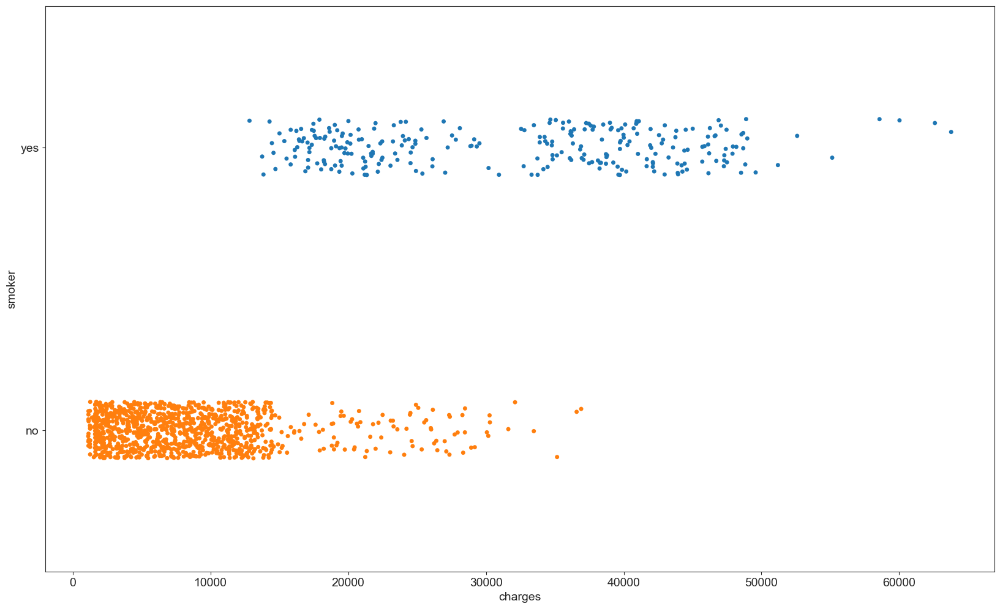

In [147]:
sns.stripplot(medical_df, x = 'charges', y = 'smoker', hue = "smoker")

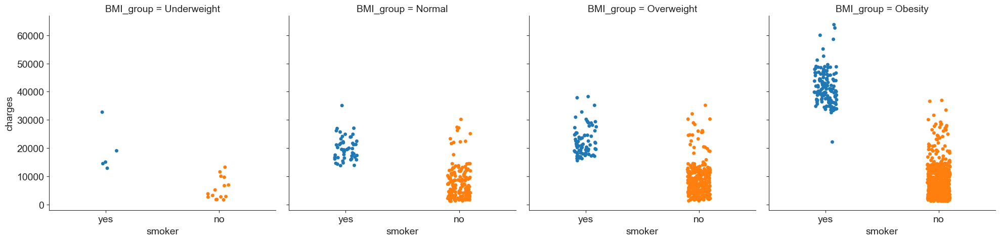

In [148]:
sns.catplot(medical_df, x = 'smoker', y = 'charges', col = "BMI_group", hue = "smoker")

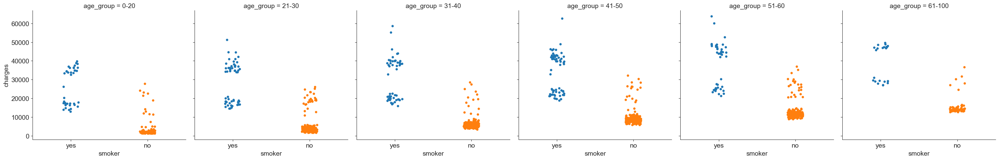

In [149]:
sns.catplot(medical_df, x = 'smoker', y = 'charges', col = "age_group", hue = "smoker")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='smoker'>

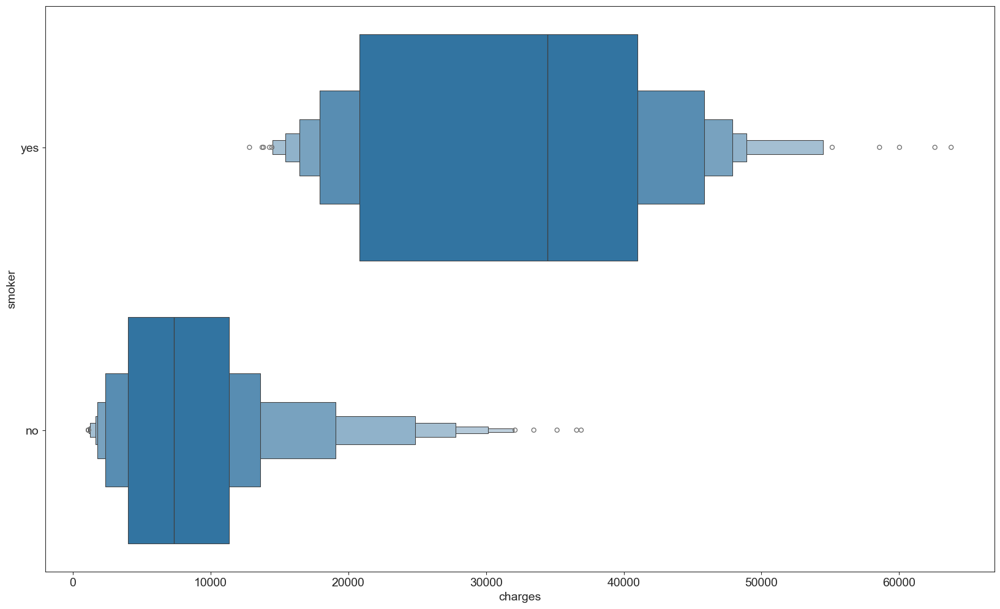

In [150]:
sns.boxenplot(medical_df, x = "charges", y = "smoker" )

Only seaborn package boxen plot shows significant difference between genders - it looks like more males have charges around 10k - 30k thank females, which may indicate males are more likely to have medium-to large scale charges than females.

<Axes: xlabel='charges', ylabel='smoker'>

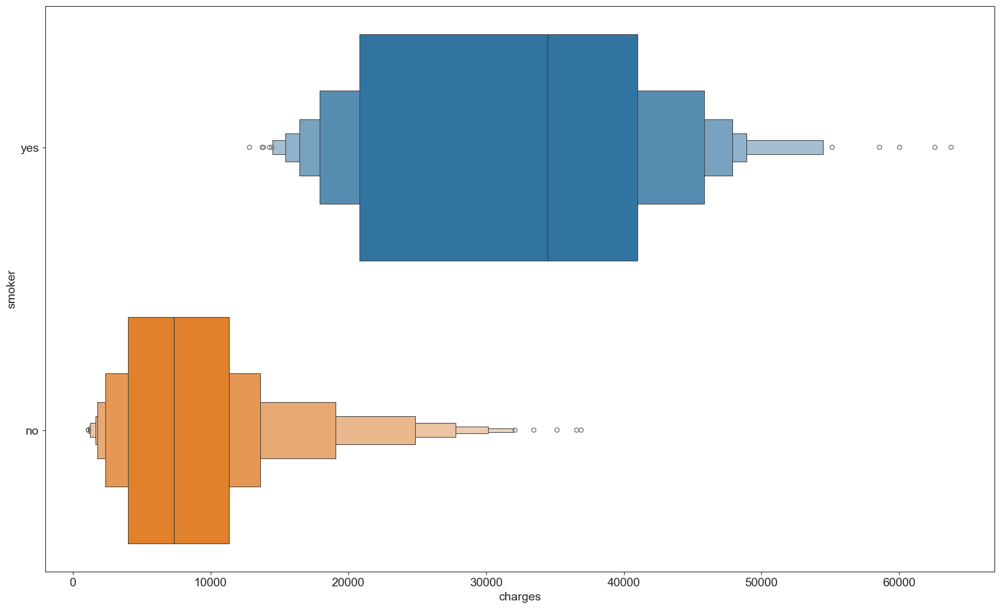

In [151]:
sns.boxenplot(medical_df, x = "charges", y = "smoker", hue = "smoker", legend = "auto")

Above box plot shows that the median of male smoker is higher than median in female smokers; that menas overall male smokers have higher charges.

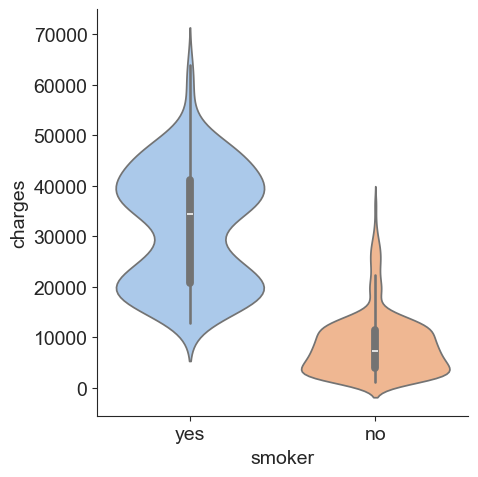

In [152]:
sns.catplot(
    data=medical_df, x="smoker", y="charges", hue="smoker",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='BMI_group', ylabel='charges'>

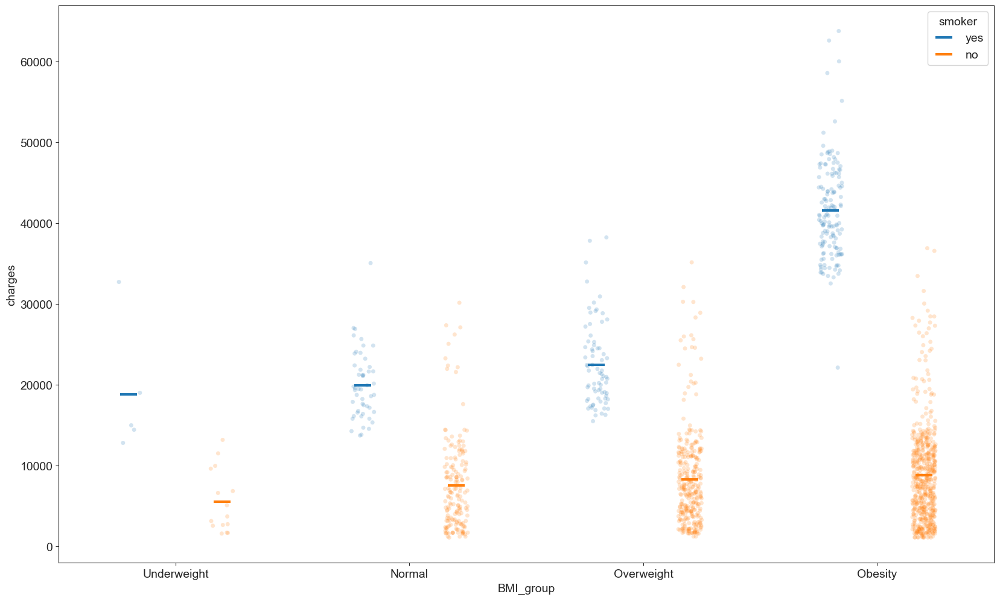

In [153]:
sns.stripplot(
    data=medical_df, x="BMI_group", y="charges", hue="smoker",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="BMI_group", y="charges", hue="smoker",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

<Axes: xlabel='smoker', ylabel='charges'>

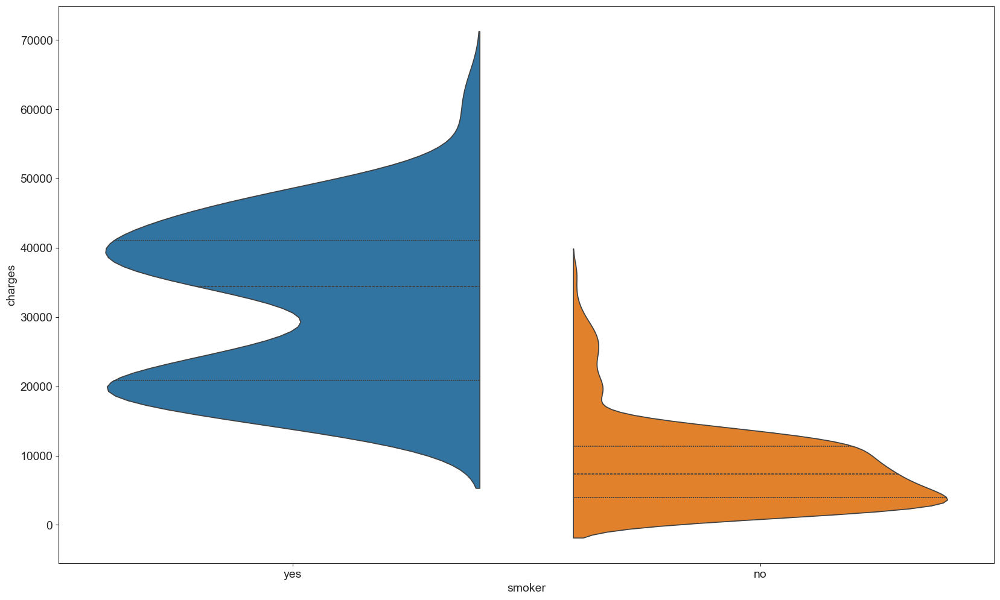

In [154]:
sns.violinplot(data=medical_df, x="smoker", y="charges", hue = "smoker", split=True, inner="quart")

As noted in the above visualisations, men tend to have higher charges than female.

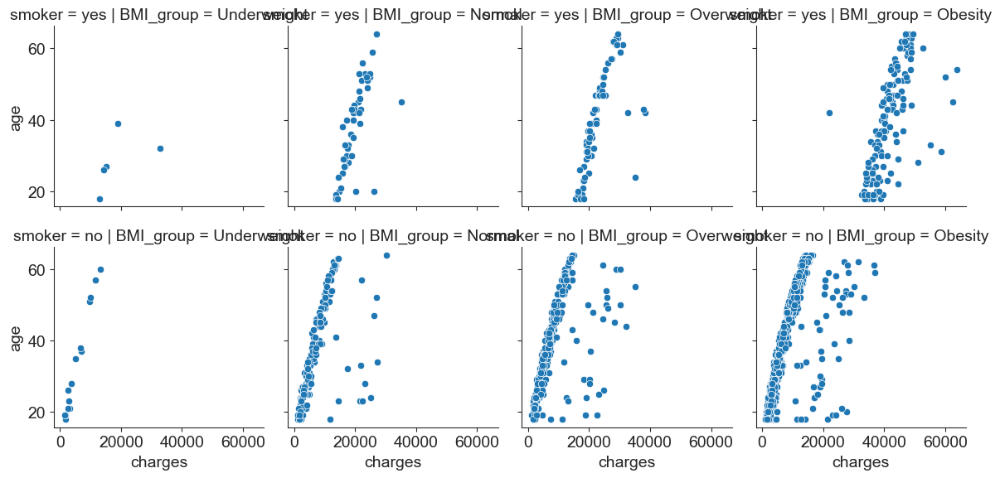

In [155]:
g = sns.FacetGrid(medical_df, col="BMI_group",  row="smoker")
g.map(sns.scatterplot, "charges", "age")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

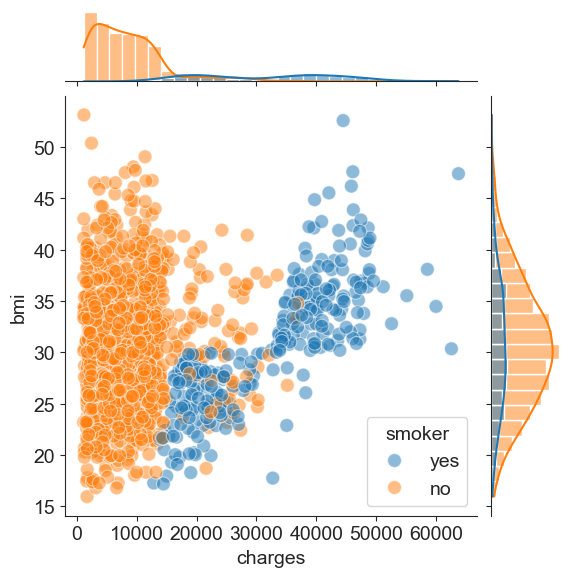

In [156]:
g = sns.JointGrid(data=medical_df, x="charges", y="bmi", hue = "smoker")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

##### 1.3.3.2. Sex

It was found that gender may have an impact to the charges - we will visualise data to further investigate such statement.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='sex'>

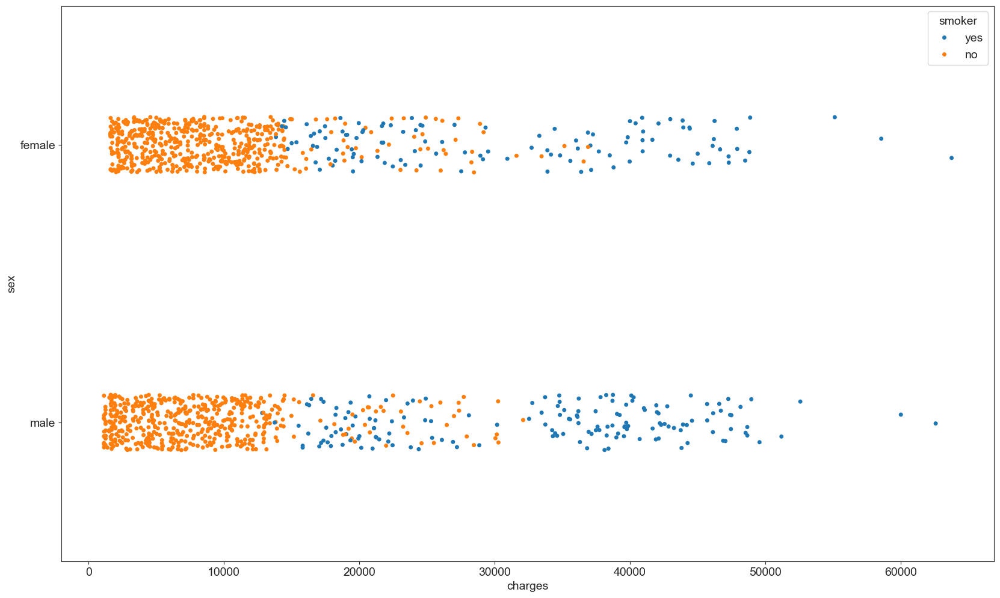

In [157]:
sns.stripplot(medical_df, x = 'charges', y = 'sex', hue = "smoker")

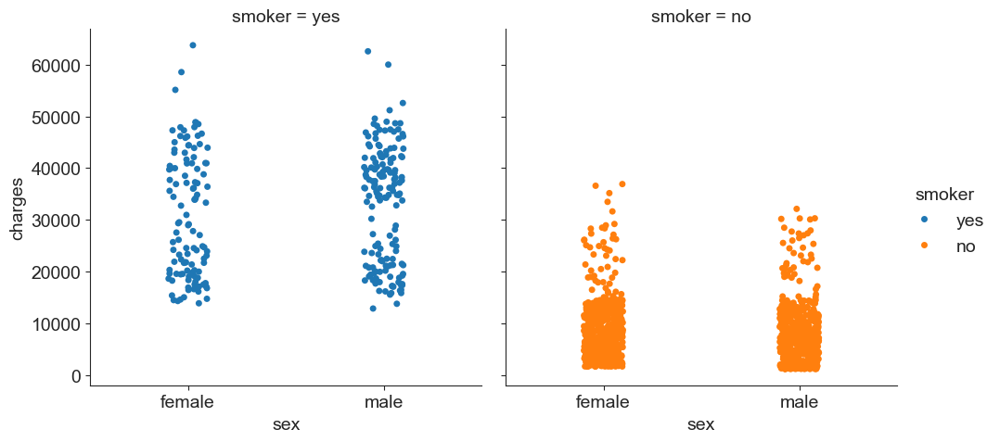

In [158]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "smoker", hue = "smoker")

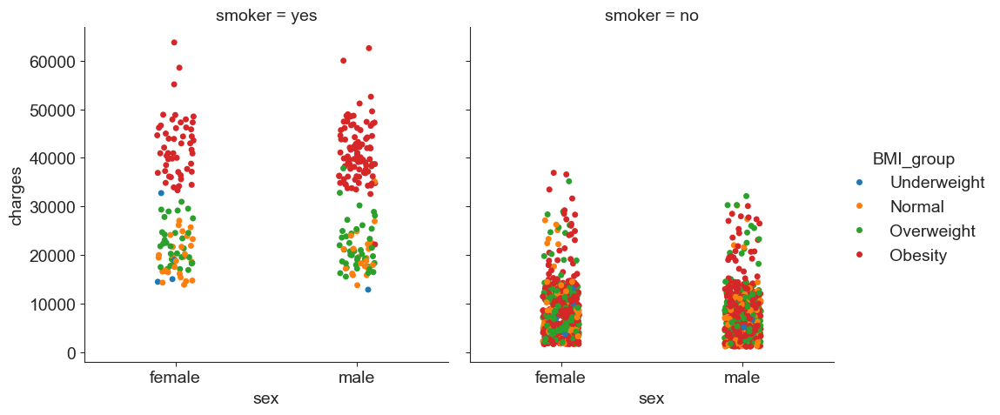

In [159]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "smoker", hue = "BMI_group")

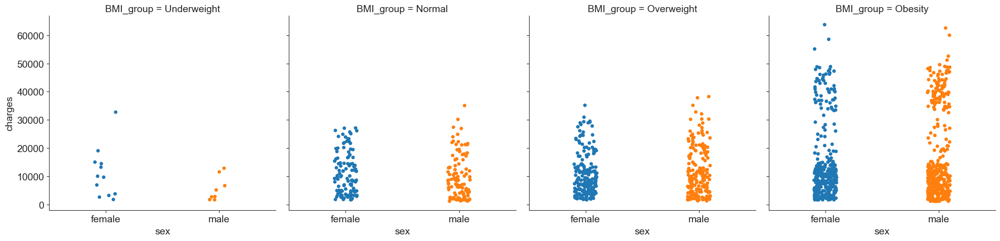

In [160]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "BMI_group", hue = "sex")

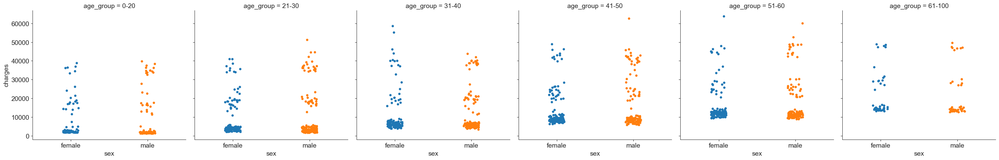

In [161]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "age_group", hue = "sex")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='sex'>

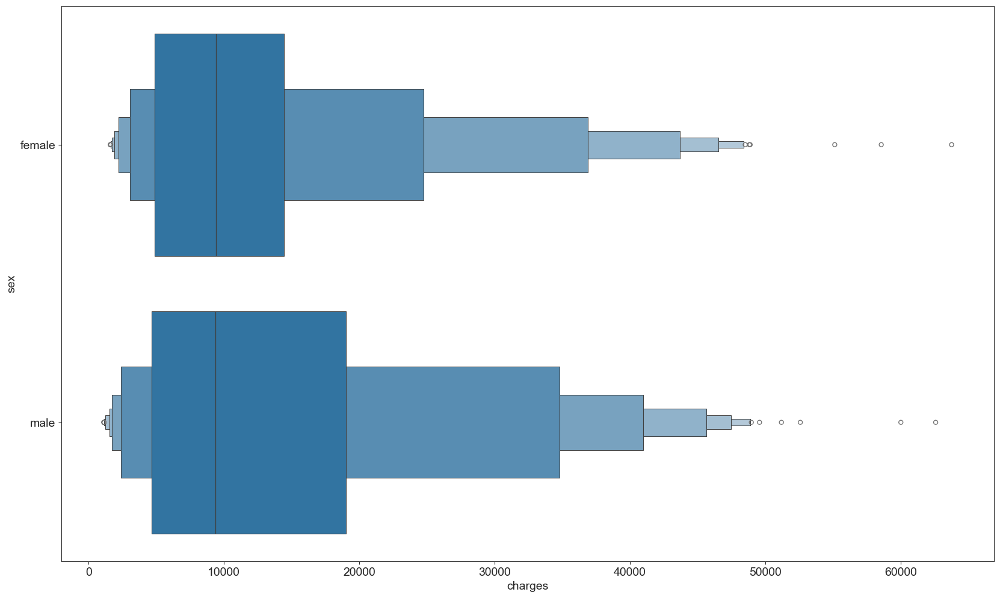

In [162]:
sns.boxenplot(medical_df, x = "charges", y = "sex" )

Only seaborn package boxen plot shows significant difference between genders - it looks like more males have charges around 10k - 30k thank females, which may indicate males are more likely to have medium-to large scale charges than females.

<Axes: xlabel='charges', ylabel='sex'>

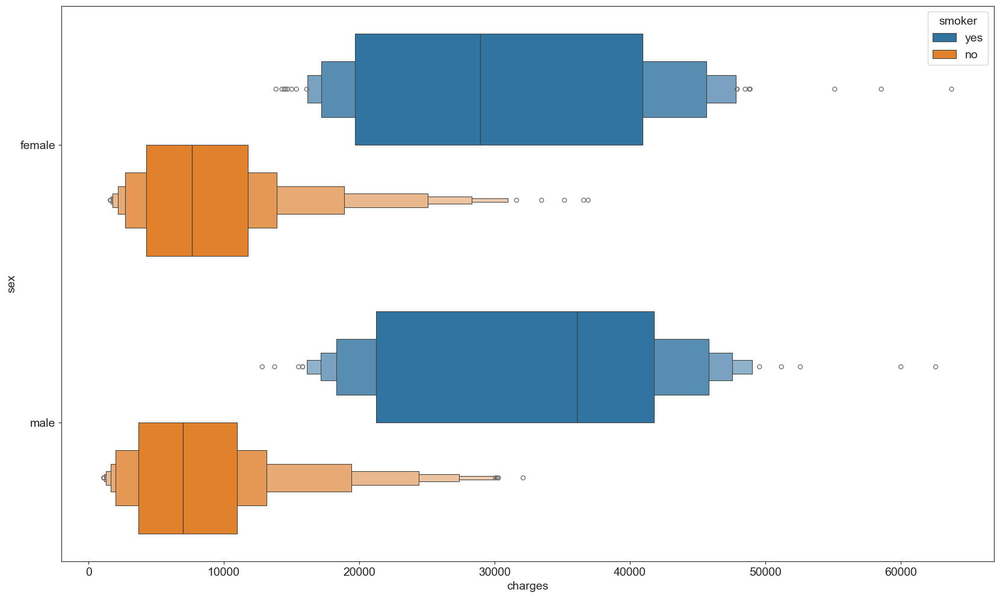

In [163]:
sns.boxenplot(medical_df, x = "charges", y = "sex", hue = "smoker", legend = "auto")

Above box plot shows that the median of male smoker is higher than median in female smokers; that menas overall male smokers have higher charges.

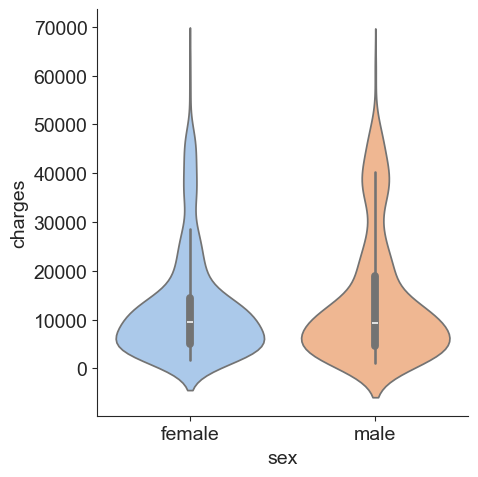

In [164]:
sns.catplot(
    data=medical_df, x="sex", y="charges", hue="sex",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='BMI_group', ylabel='charges'>

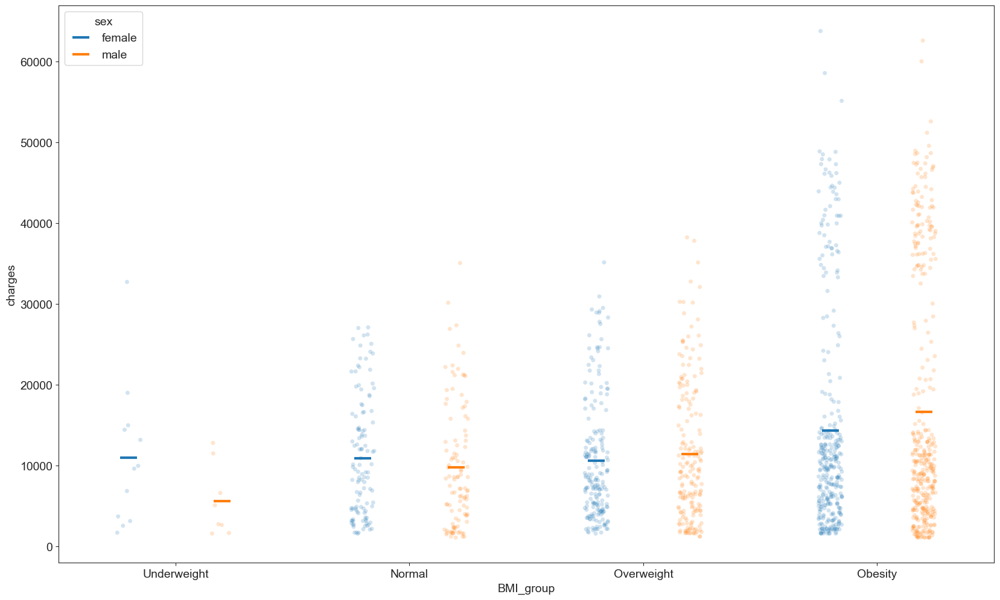

In [165]:
sns.stripplot(
    data=medical_df, x="BMI_group", y="charges", hue="sex",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="BMI_group", y="charges", hue="sex",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

<Axes: xlabel='sex', ylabel='charges'>

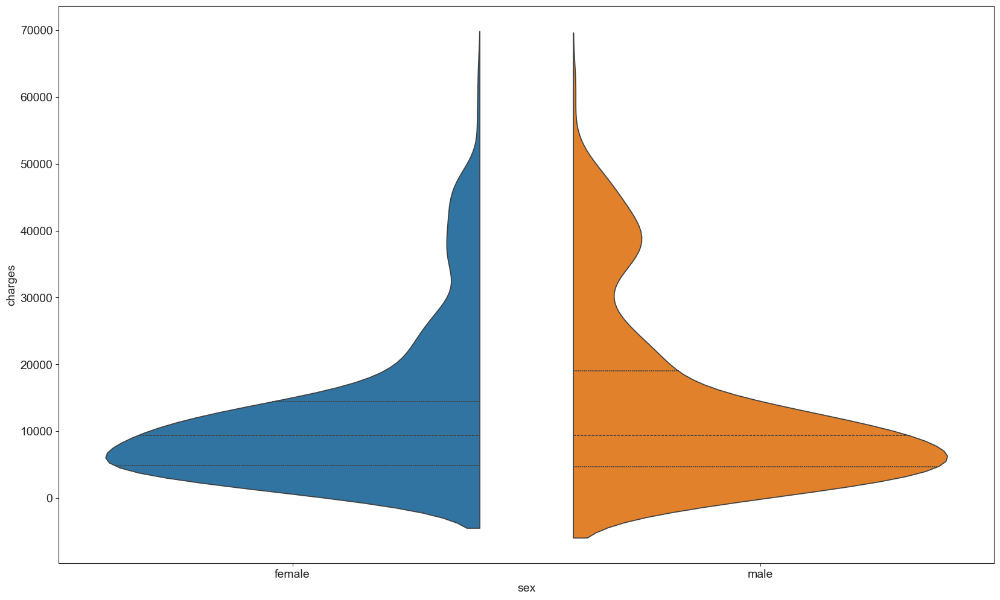

In [166]:
sns.violinplot(data=medical_df, x="sex", y="charges", hue = "sex", split=True, inner="quart")

As noted in the above visualisations, men tend to have higher charges than female.

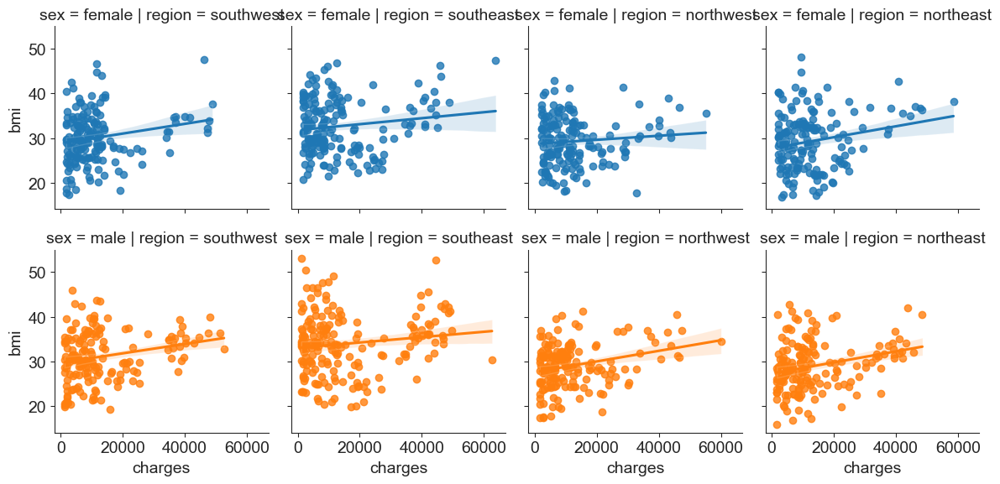

In [167]:
sns.lmplot(
    data=medical_df, x="charges", y="bmi",
    col="region", row="sex", hue="sex", height=3,
)

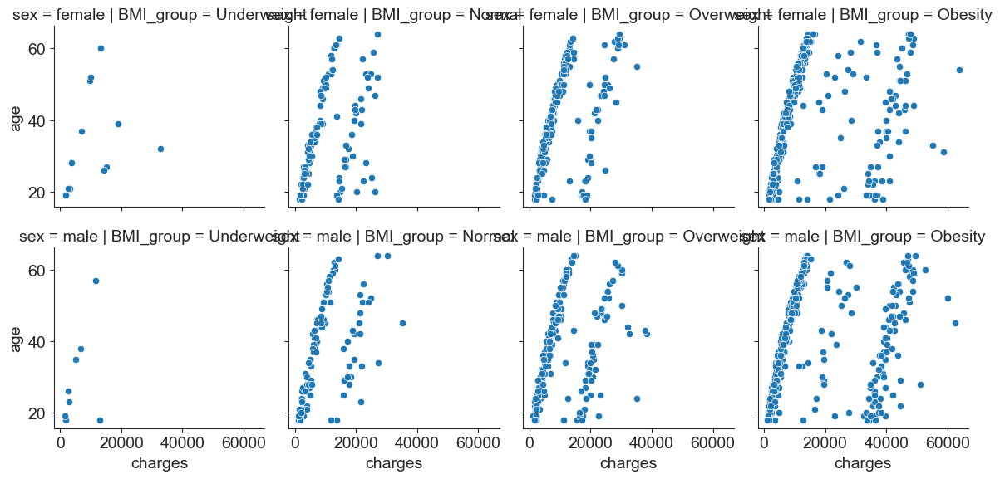

In [168]:
g = sns.FacetGrid(medical_df, col="BMI_group",  row="sex")
g.map(sns.scatterplot, "charges", "age")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

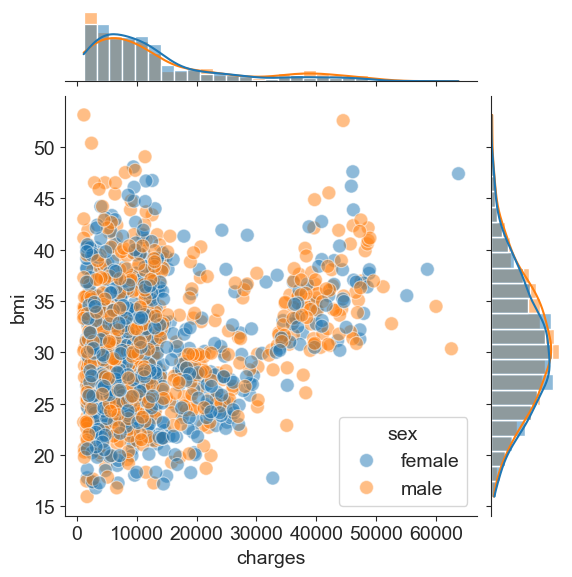

In [169]:
g = sns.JointGrid(data=medical_df, x="charges", y="bmi", hue = "sex")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

Visual checks shows that it is possible that females have a bit lowe charges than men.

##### 1.3.3.3. Children

It was found that having and not having children may impact the charges - we will try to visualise this below. To do that simply, we will create new variable which will indicate whether individual has children or not, regardless of the count.

Method 1: np.where function

In [170]:
medical_df["has_children"] = np.where(medical_df["children"] == 0, 0, 1)

Method 2: simple if function

In [171]:
def label_value(x):
    if x == 0:
        return 0
    else:
        return 1

In [172]:
medical_df["has_children"] = medical_df["children"].apply(label_value)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='sex'>

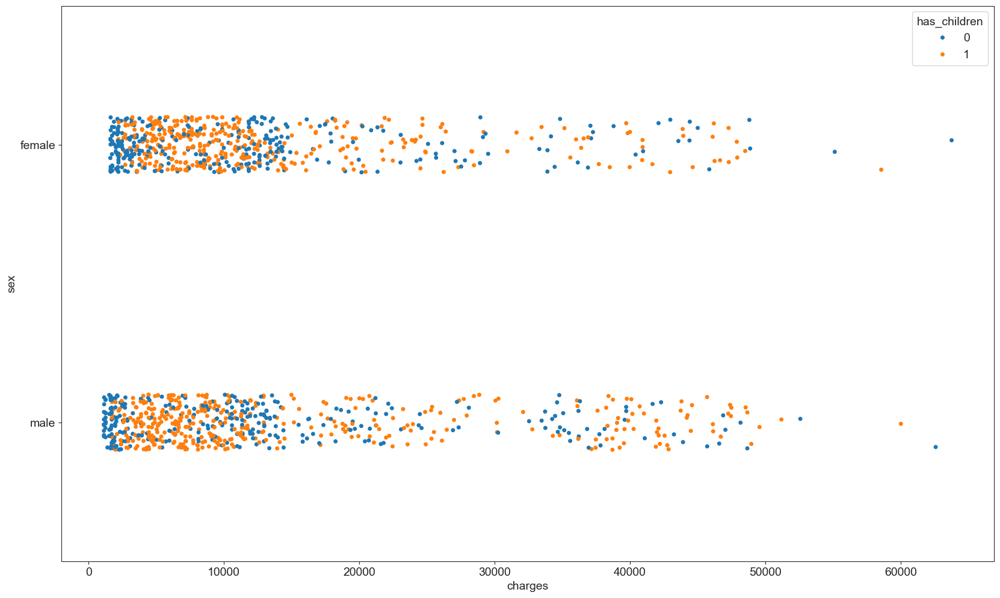

In [173]:
sns.stripplot(medical_df, x = 'charges', y = 'sex', hue = "has_children")

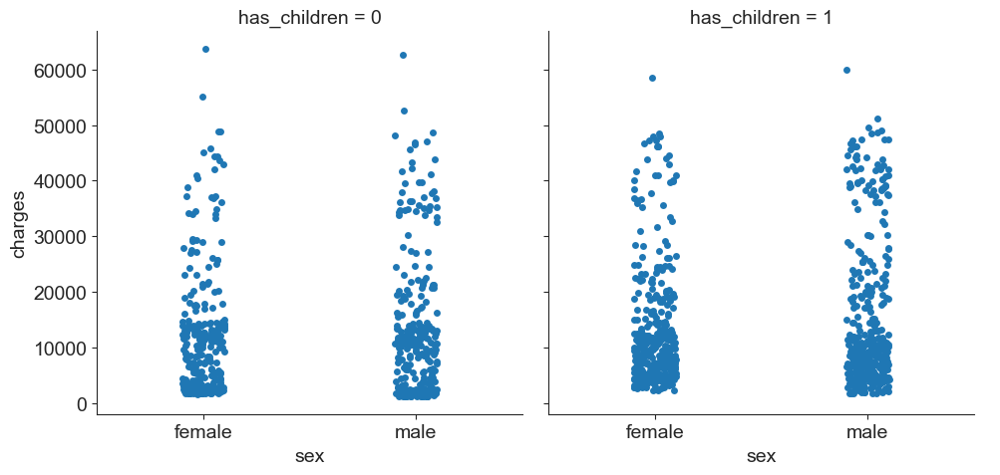

In [174]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "has_children")

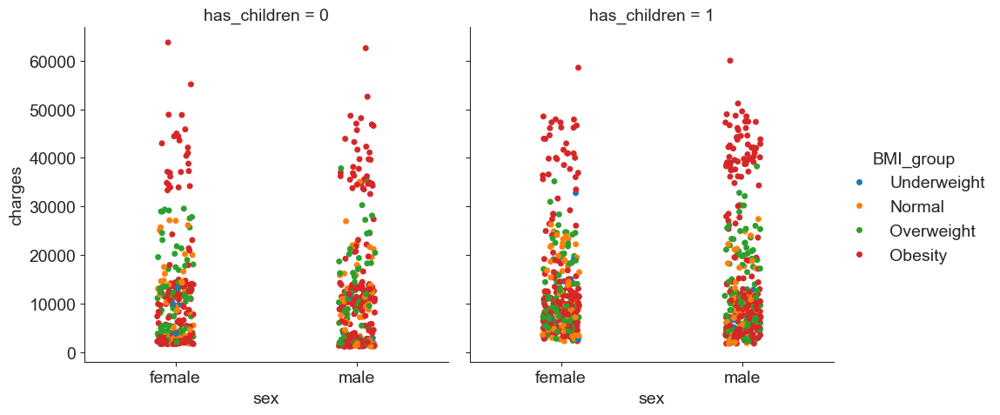

In [175]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "has_children", hue = "BMI_group")

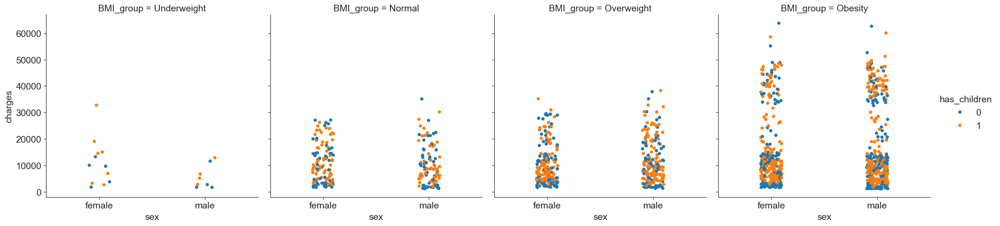

In [176]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "BMI_group", hue = "has_children")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='has_children', ylabel='charges'>

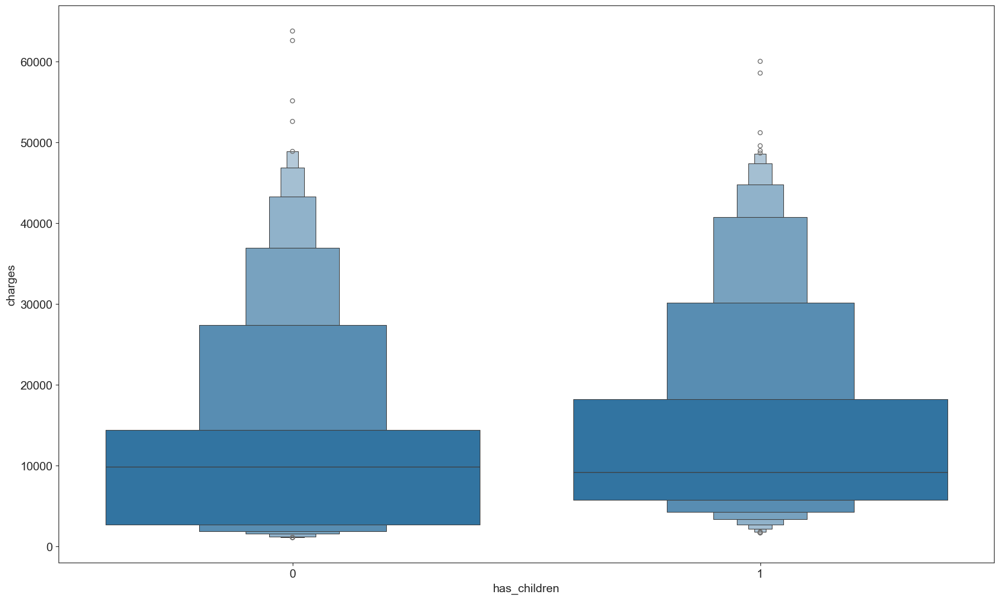

In [177]:
sns.boxenplot(medical_df, x = "has_children", y = "charges" )

Only seaborn package boxen plot shows significant difference between genders - it looks like more males have charges around 10k - 30k thank females, which may indicate males are more likely to have medium-to large scale charges than females.

<Axes: xlabel='charges', ylabel='sex'>

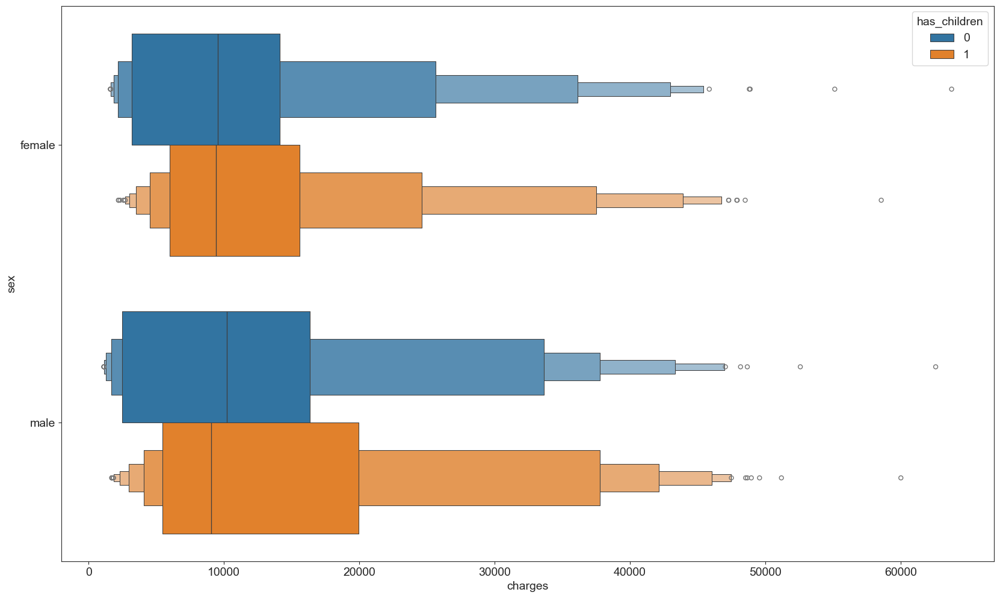

In [178]:
sns.boxenplot(medical_df, x = "charges", y = "sex", hue = "has_children", legend = "auto")

<Axes: xlabel='charges', ylabel='smoker'>

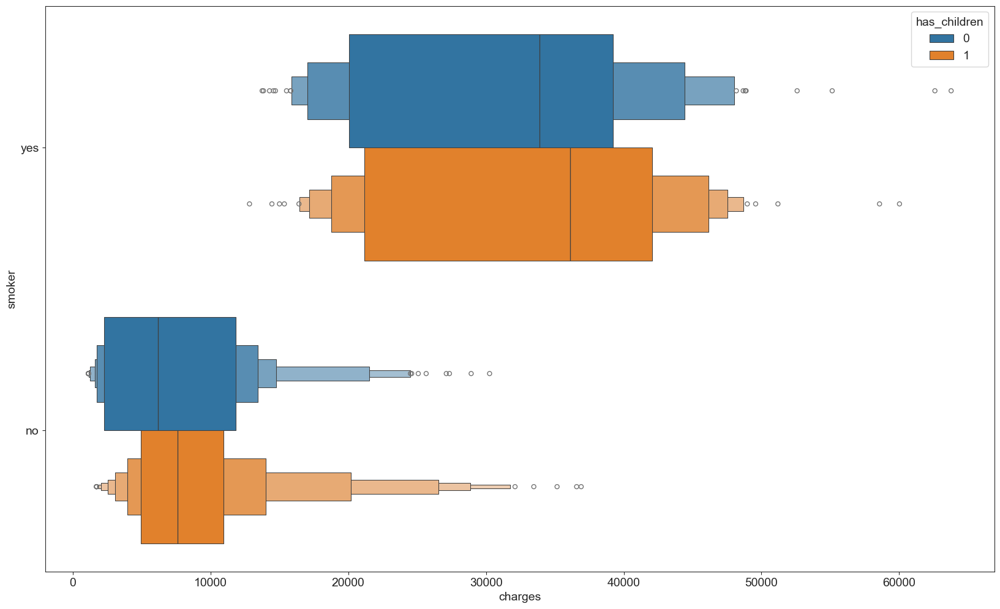

In [179]:
sns.boxenplot(medical_df, x = "charges", y = "smoker", hue = "has_children", legend = "auto")

Both above boxen plots shows that the charges starts higher for individuals whi has children than ones who do not. It also has wider tails, which could point that the high charges more likely appears where individuals have children.

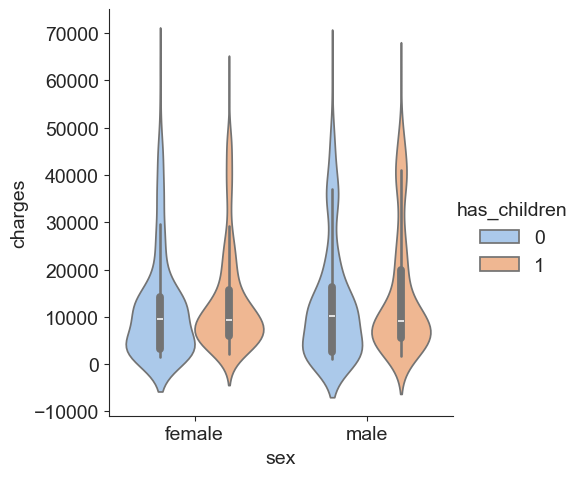

In [180]:
sns.catplot(
    data=medical_df, x="sex", y="charges", hue="has_children",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='BMI_group', ylabel='charges'>

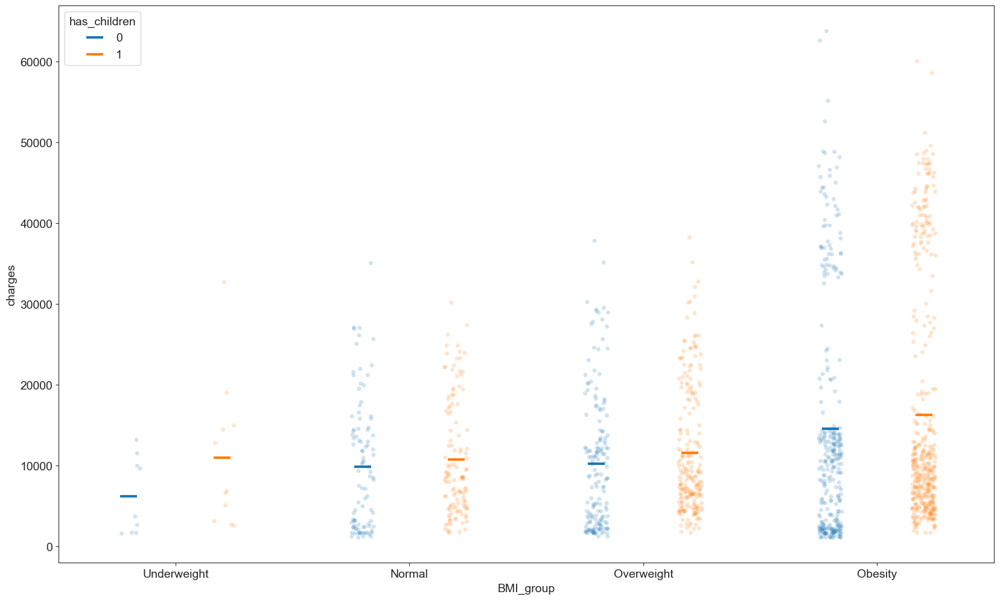

In [181]:
sns.stripplot(
    data=medical_df, x="BMI_group", y="charges", hue="has_children",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="BMI_group", y="charges", hue="has_children",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

In the above plot it is visible the central tendency of charges in each group has higher values where individuals has children.

<Axes: xlabel='has_children', ylabel='charges'>

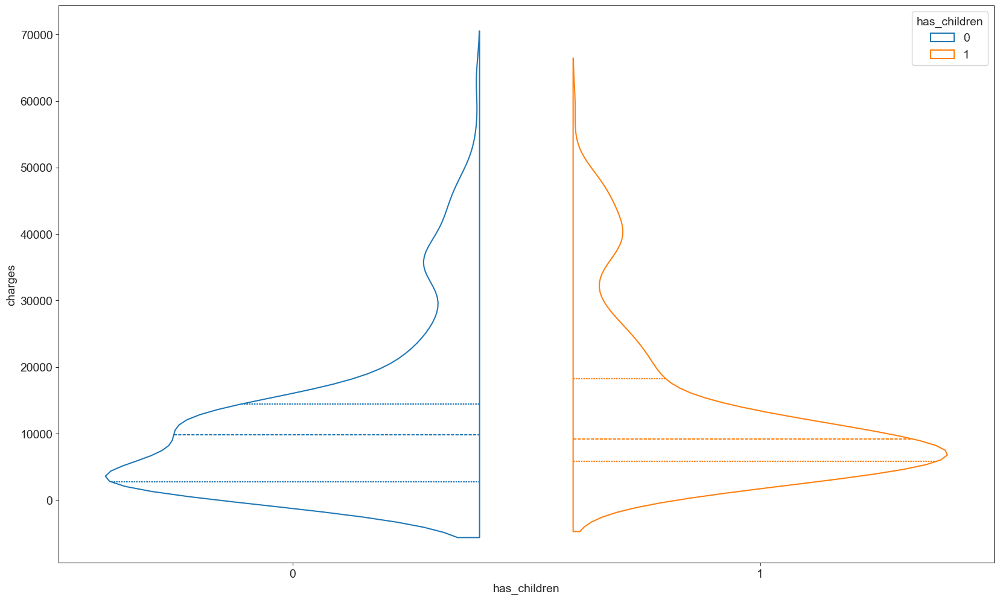

In [182]:
sns.violinplot(data=medical_df, x="has_children", y="charges", hue = "has_children", 
               saturation = 0.5, fill = False, legend = "full",
               split=True, inner="quart")

As noted in the above visualisations, individuals with children have higher charges in both first and third quartile, however, the median (or a second quartile) are very similar.

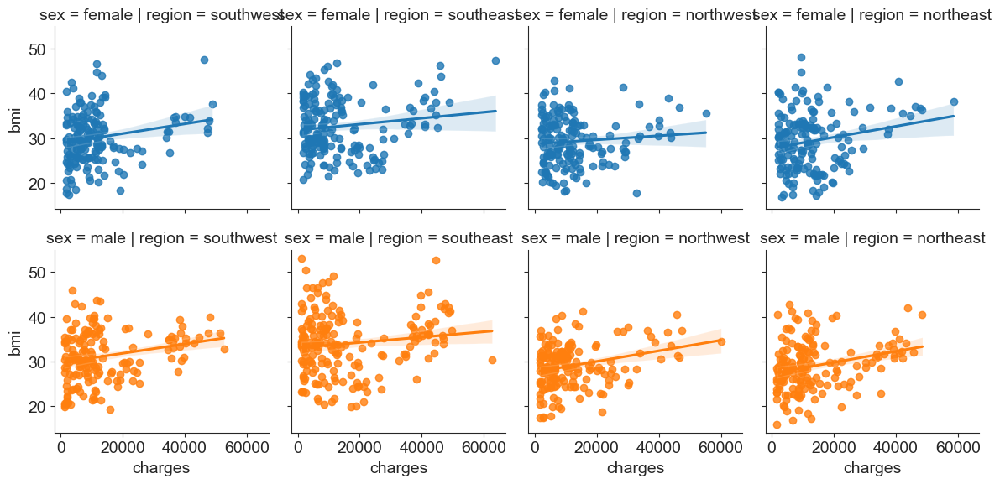

In [183]:
sns.lmplot(
    data=medical_df, x="charges", y="bmi",
    col="region", row="sex", hue="sex", height=3,
)

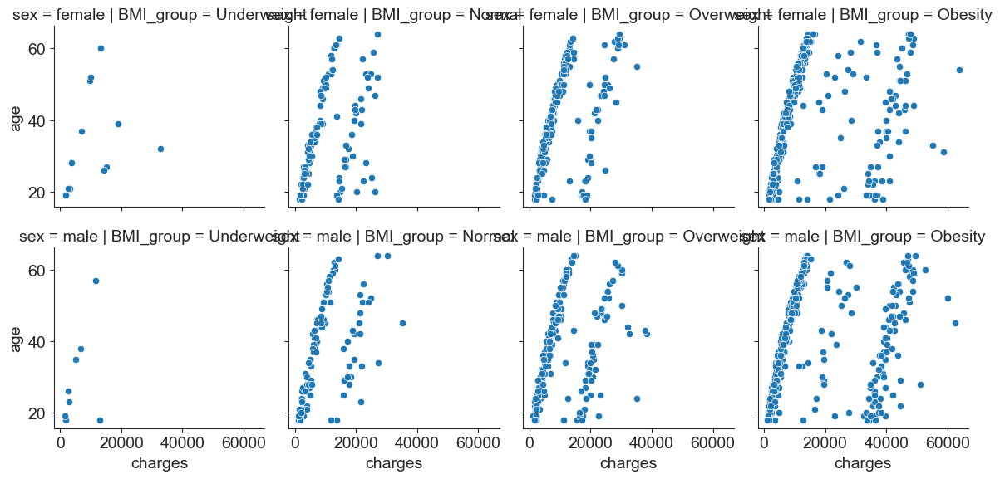

In [184]:
g = sns.FacetGrid(medical_df, col="BMI_group",  row="sex")
g.map(sns.scatterplot, "charges", "age")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

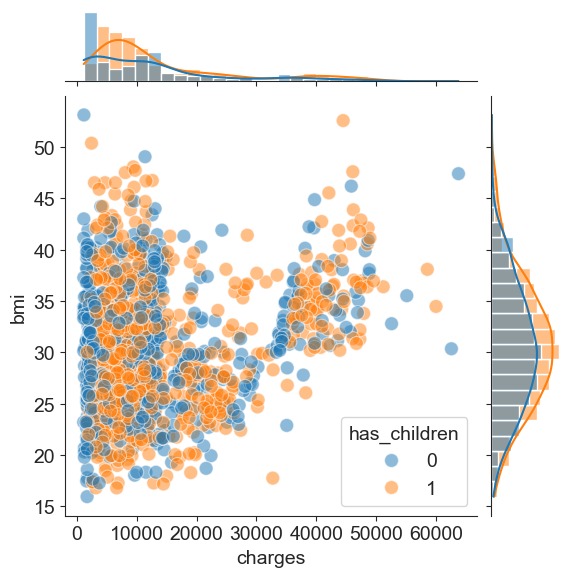

In [185]:
g = sns.JointGrid(data=medical_df, x="charges", y="bmi", hue = "has_children")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

##### 1.3.3.4. Age

Various age groups were proven to have statistically significant impact to charges, therefore below we will check it visually.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='age_group'>

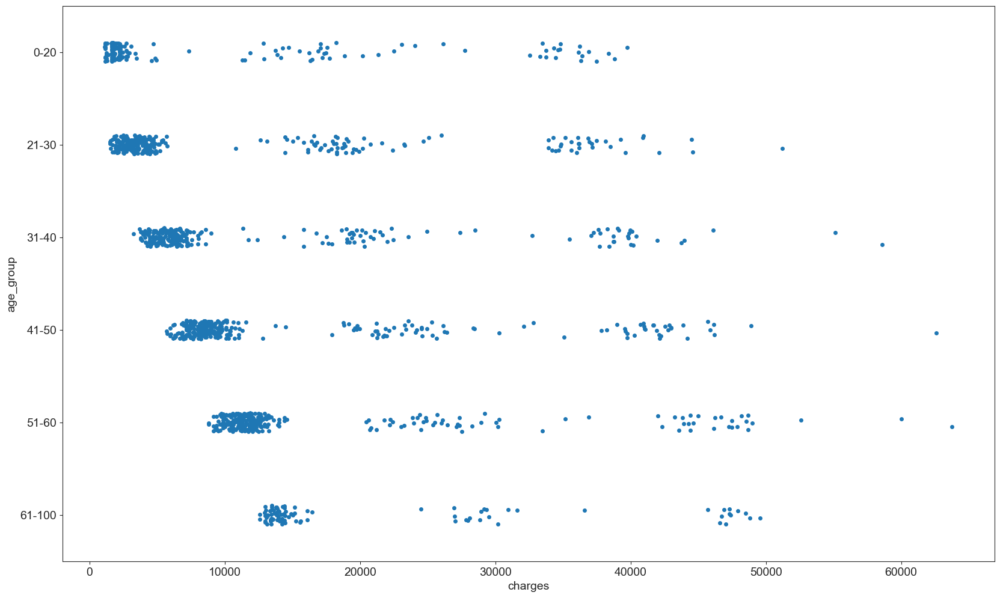

In [186]:
sns.stripplot(medical_df, x = 'charges', y = 'age_group')

It can be seen that clients aged above 60 years old have charges starting from 10k a year, while younger clients may not even reach such number.

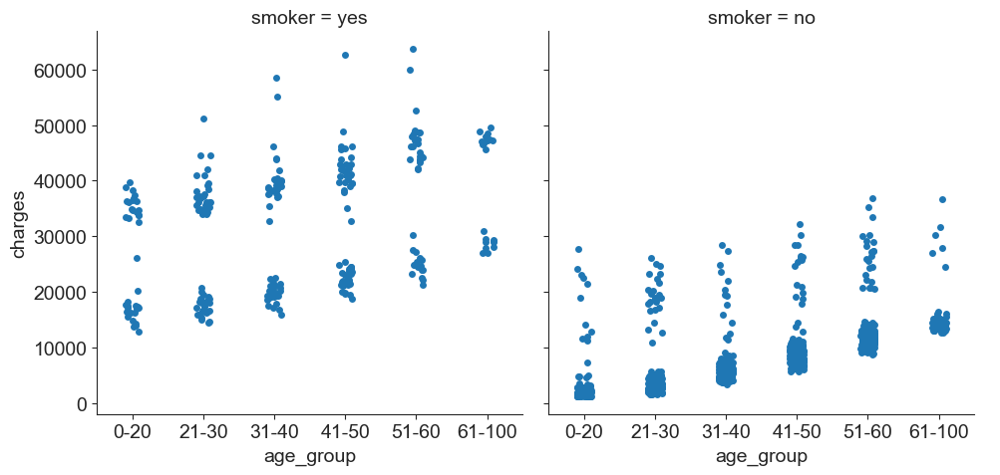

In [187]:
sns.catplot(medical_df, x = 'age_group', y = 'charges', col = "smoker")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



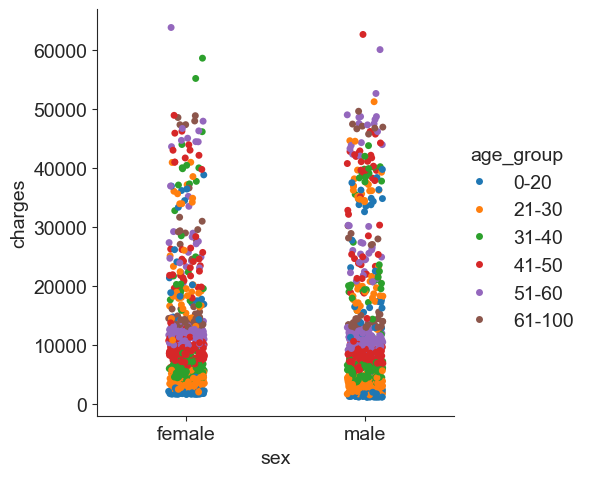

In [188]:
sns.catplot(medical_df, x = 'sex', y = 'charges', hue = "age_group")

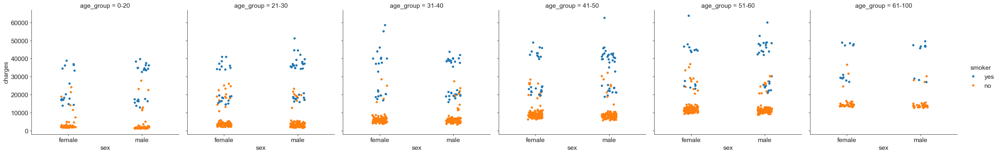

In [189]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "age_group", hue = "smoker")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='age_group', ylabel='charges'>

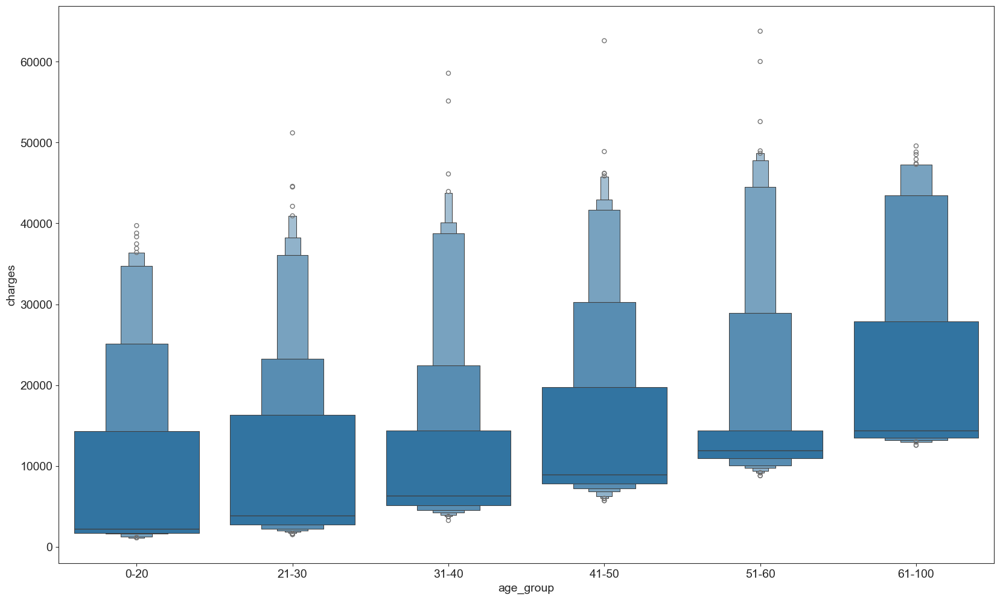

In [190]:
sns.boxenplot(medical_df, x = "age_group", y = "charges" )

It is clearly visible individuals have clearly increasing charges pattern based on their age.

<Axes: xlabel='charges', ylabel='age_group'>

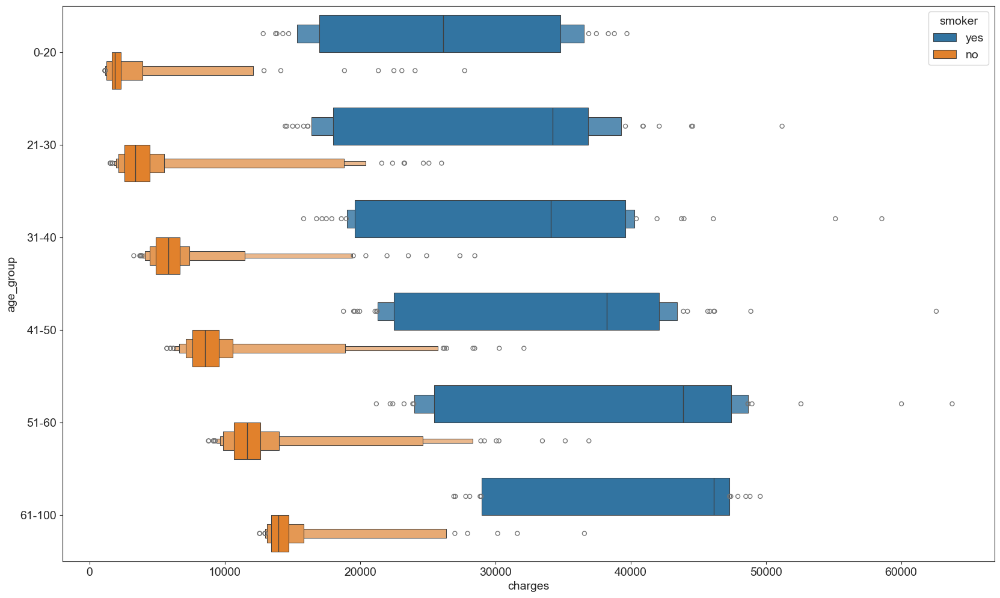

In [191]:
sns.boxenplot(medical_df, x = "charges", y = "age_group", hue = "smoker", legend = "auto")

<Axes: xlabel='charges', ylabel='age_group'>

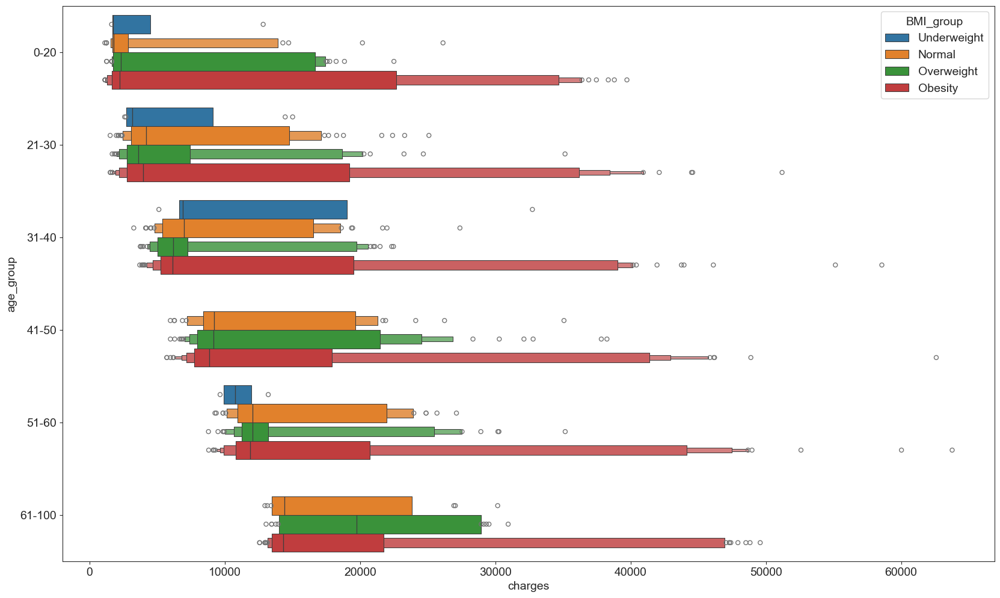

In [192]:
sns.boxenplot(medical_df, x = "charges", y = "age_group", hue = "BMI_group", legend = "auto")

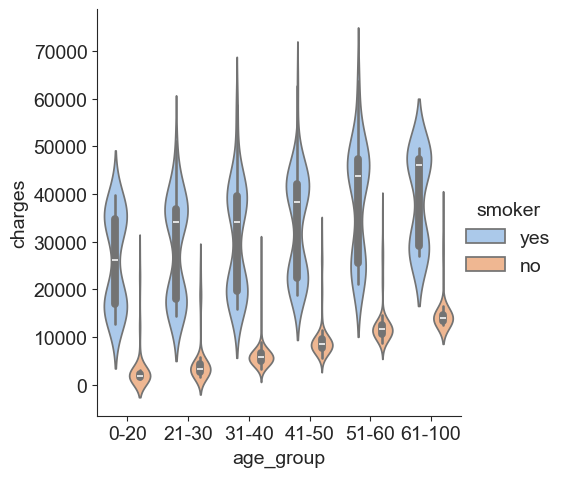

In [193]:
sns.catplot(
    data=medical_df, x="age_group", y="charges", hue="smoker",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='age_group', ylabel='charges'>

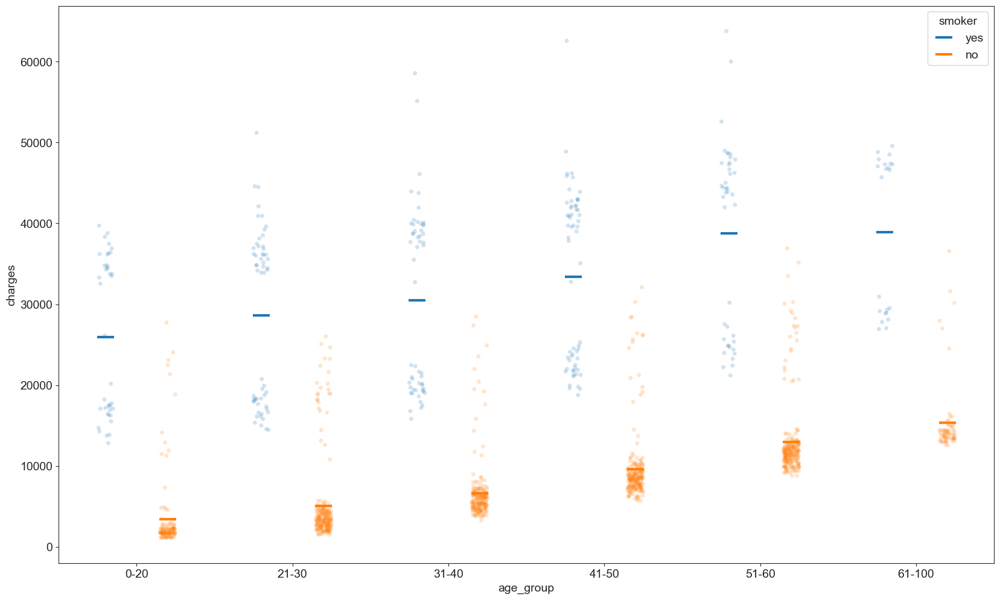

In [194]:
sns.stripplot(
    data=medical_df, x="age_group", y="charges", hue="smoker",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="age_group", y="charges", hue="smoker",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

In the above plot it is visible the central tendency of charges in each group has higher values where individuals has children.

<Axes: xlabel='age_group', ylabel='charges'>

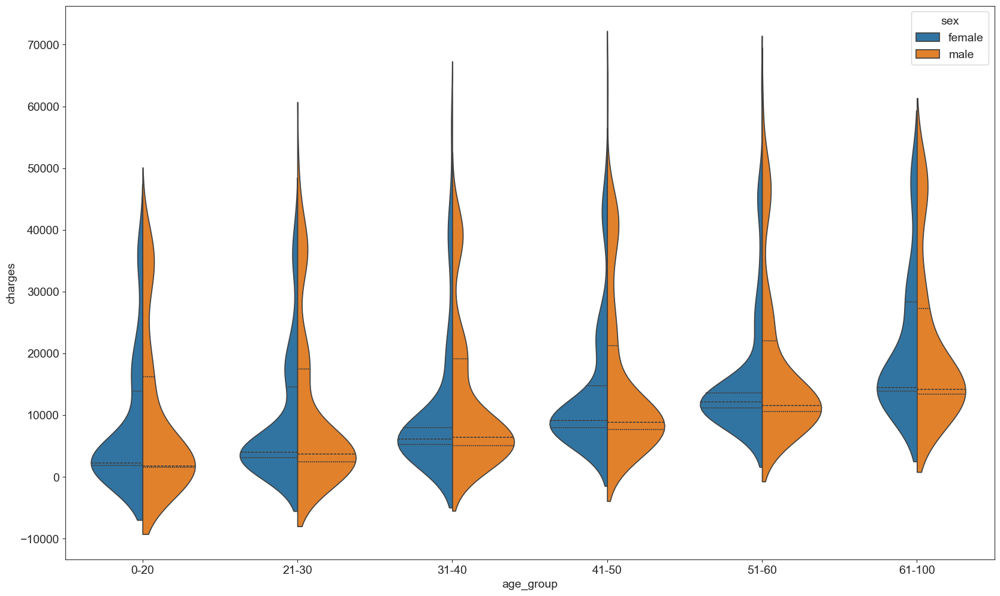

In [195]:
sns.violinplot(data=medical_df, x="age_group", y="charges", hue = "sex", 
               fill = True, legend = "full",
               split=True, inner="quart")

As noted in the above visualisations, individuals with children have higher charges in both first and third quartile, however, the median (or a second quartile) are very similar.

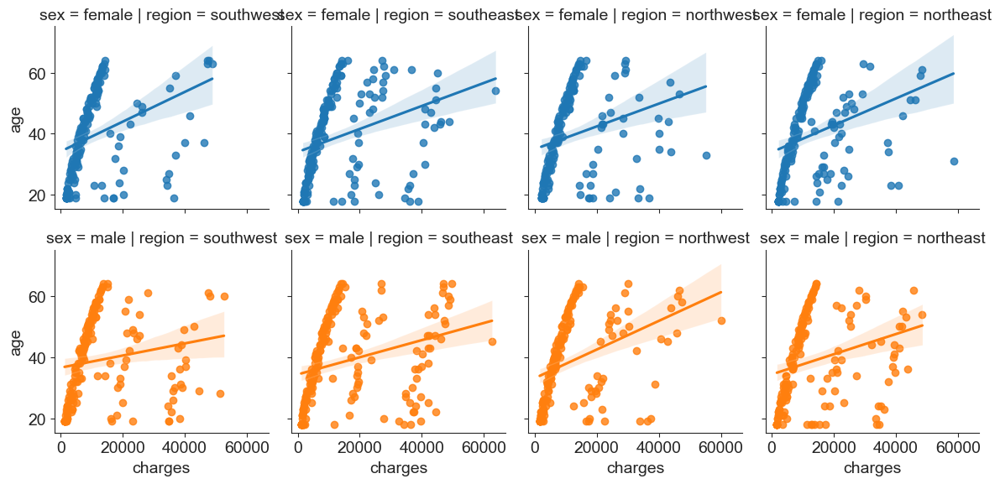

In [196]:
sns.lmplot(
    data=medical_df, x="charges", y="age",
    col="region", row="sex", hue="sex", height=3,
)

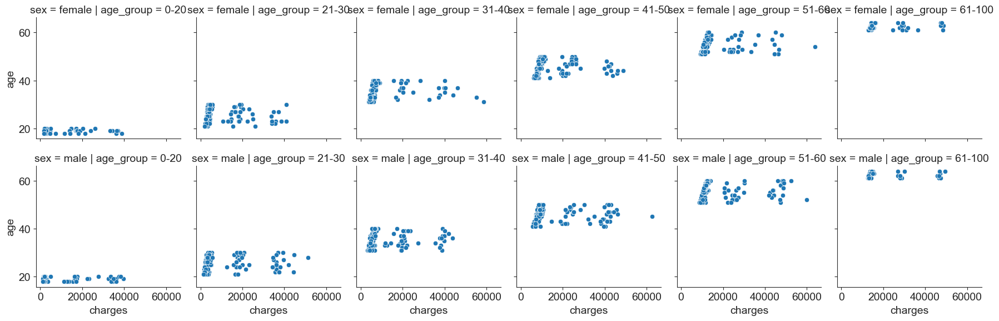

In [197]:
g = sns.FacetGrid(medical_df, col="age_group",  row="sex")
g.map(sns.scatterplot, "charges", "age")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

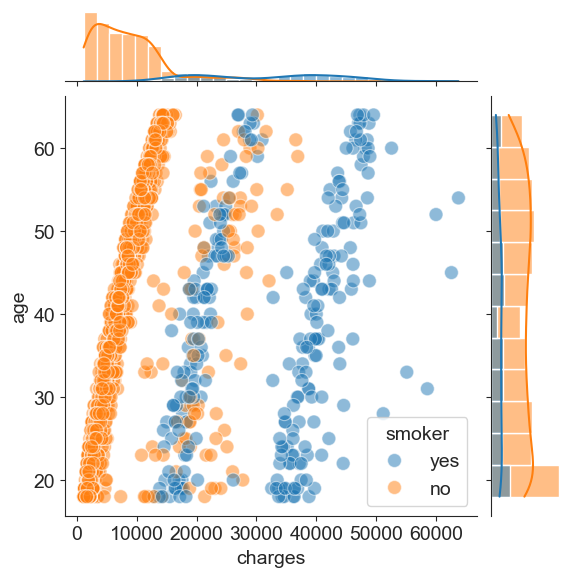

In [198]:
g = sns.JointGrid(data=medical_df, x="charges", y="age", hue = "smoker")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

##### 1.3.3.5. BMI

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='BMI_group'>

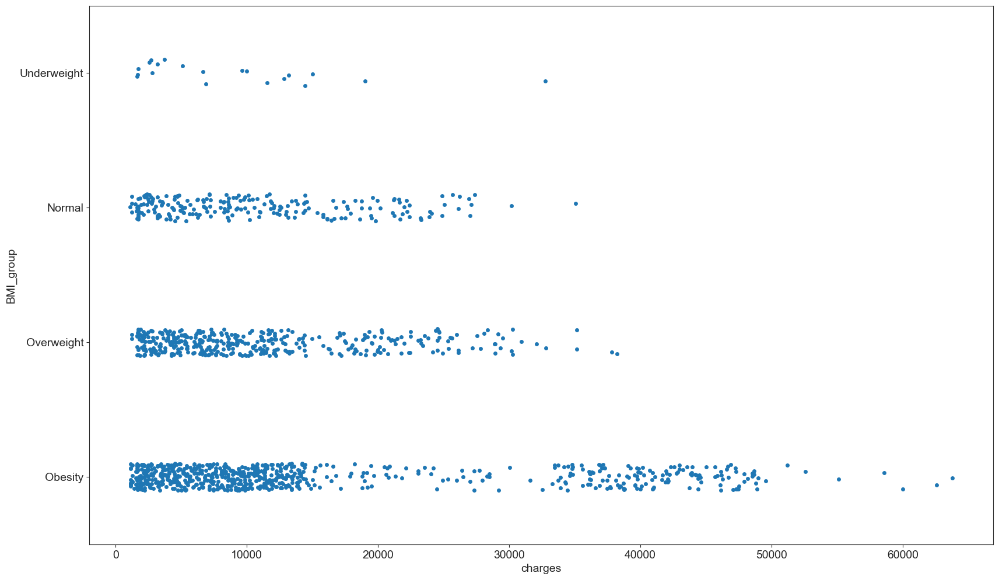

In [199]:
sns.stripplot(medical_df, x = 'charges', y = 'BMI_group')

Since the obese clients group is the largest, the visualisation above appears like this as well.

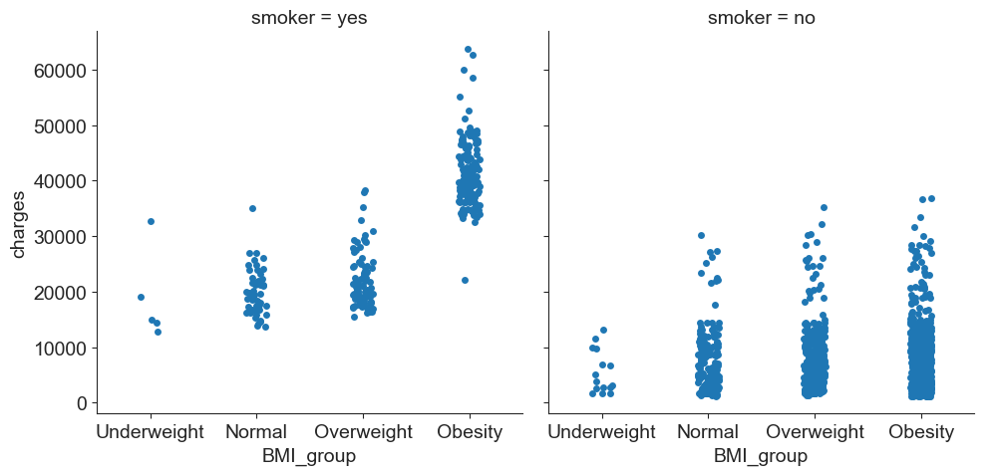

In [200]:
sns.catplot(medical_df, x = 'BMI_group', y = 'charges', col = "smoker")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



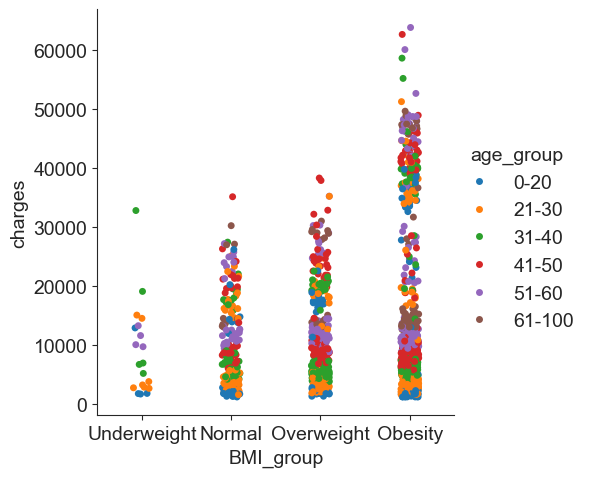

In [201]:
sns.catplot(medical_df, x = 'BMI_group', y = 'charges', hue = "age_group")

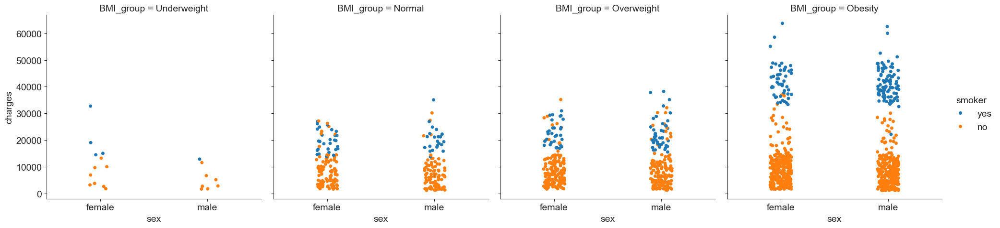

In [202]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "BMI_group", hue = "smoker")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='BMI_group', ylabel='charges'>

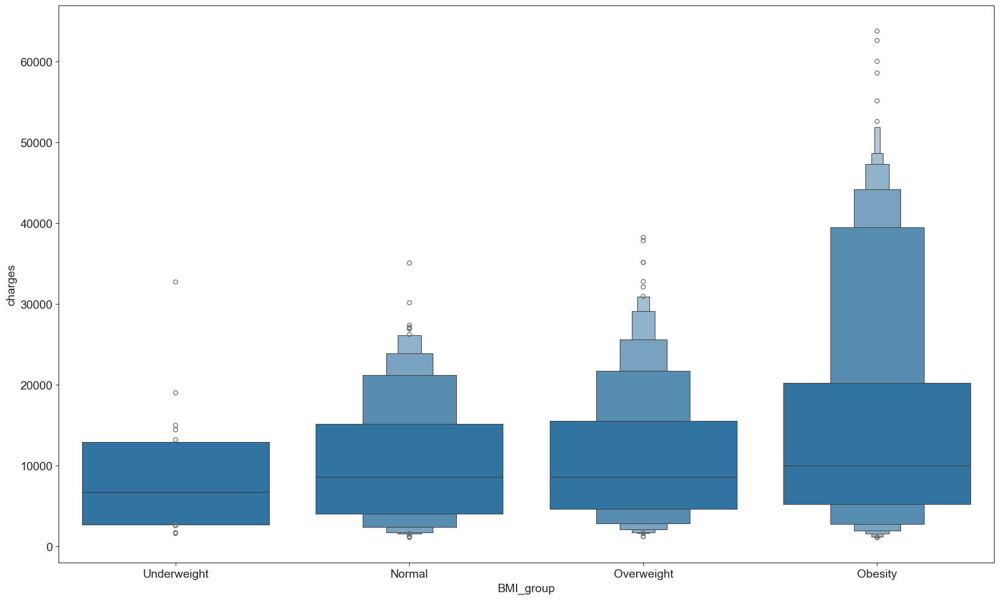

In [203]:
sns.boxenplot(medical_df, x = "BMI_group", y = "charges" )

<Axes: xlabel='charges', ylabel='BMI_group'>

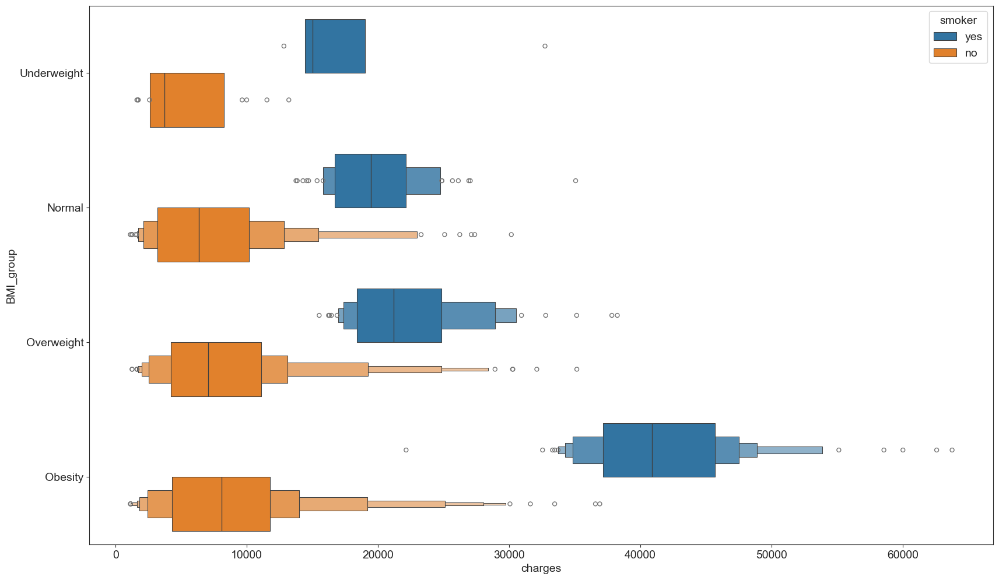

In [204]:
sns.boxenplot(medical_df, x = "charges", y = "BMI_group", hue = "smoker", legend = "auto")

It looks like obese smokers have largest charges.

<Axes: xlabel='charges', ylabel='age_group'>

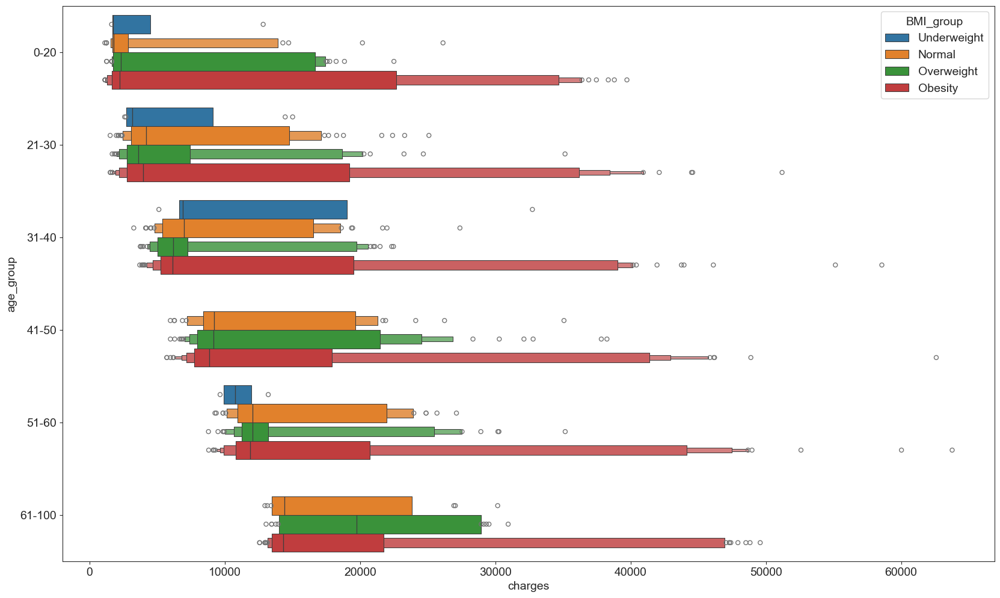

In [205]:
sns.boxenplot(medical_df, x = "charges", y = "age_group", hue = "BMI_group", legend = "auto")

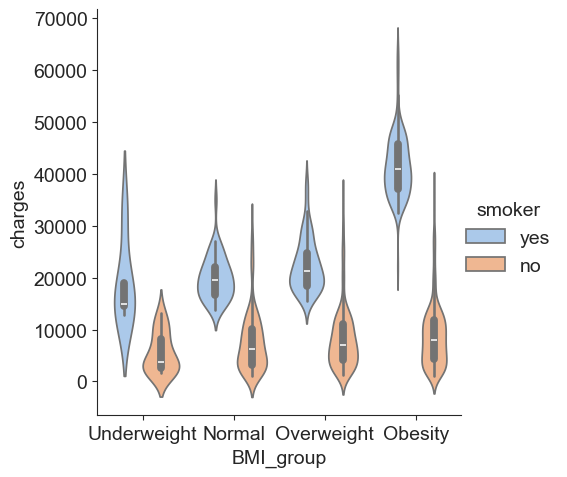

In [206]:
sns.catplot(
    data=medical_df, x="BMI_group", y="charges", hue="smoker",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='BMI_group', ylabel='charges'>

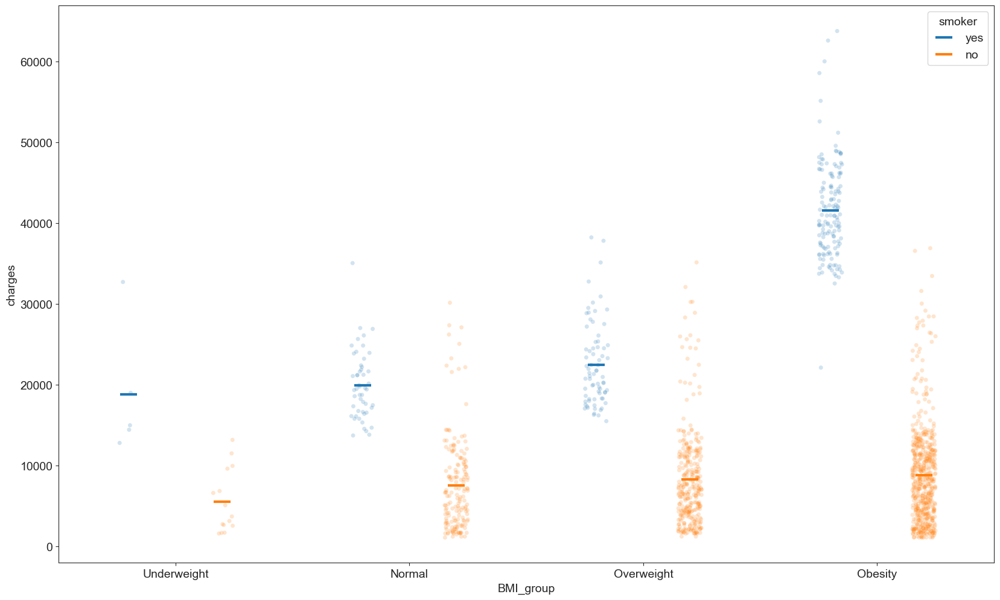

In [207]:
sns.stripplot(
    data=medical_df, x="BMI_group", y="charges", hue="smoker",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="BMI_group", y="charges", hue="smoker",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

In the above plot it is visible the central tendency of charges in each group has higher values where individuals has children.

<Axes: xlabel='BMI_group', ylabel='charges'>

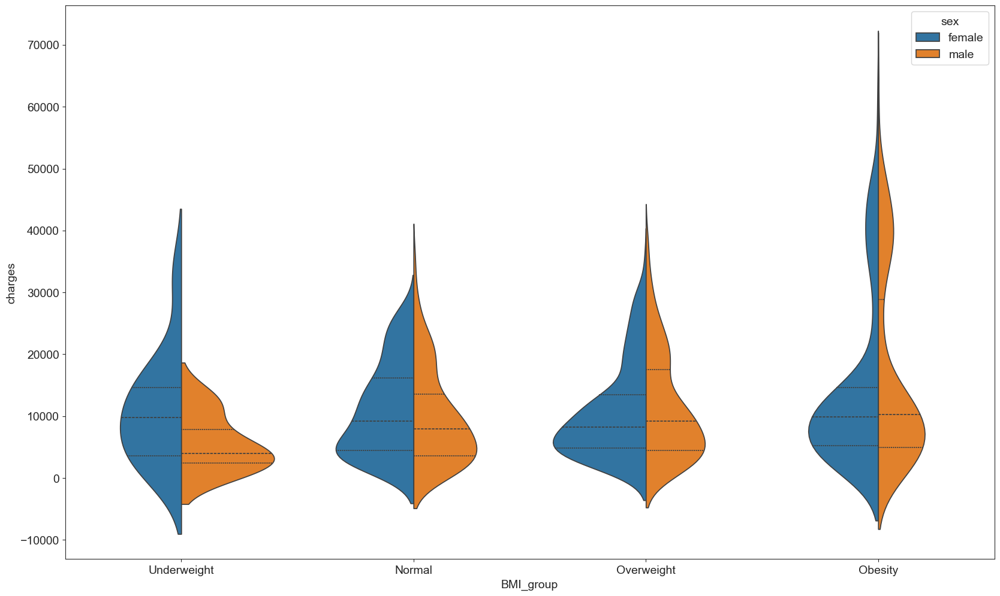

In [208]:
sns.violinplot(data=medical_df, x="BMI_group", y="charges", hue = "sex", 
               fill = True, legend = "full",
               split=True, inner="quart")

As noted in the above visualisations, individuals with children have higher charges in both first and third quartile, however, the median (or a second quartile) are very similar.

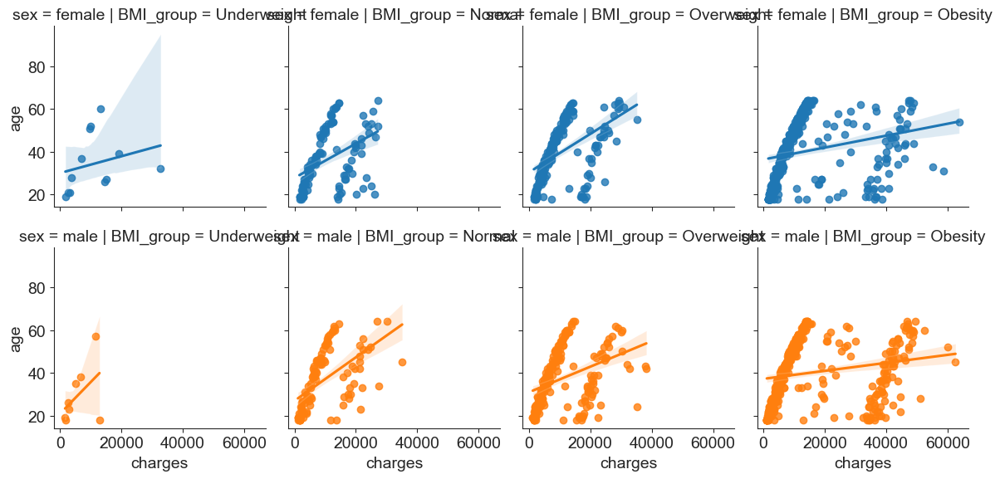

In [209]:
sns.lmplot(
    data=medical_df, x="charges", y="age",
    col="BMI_group", row="sex", hue="sex", height=3,
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When groupi

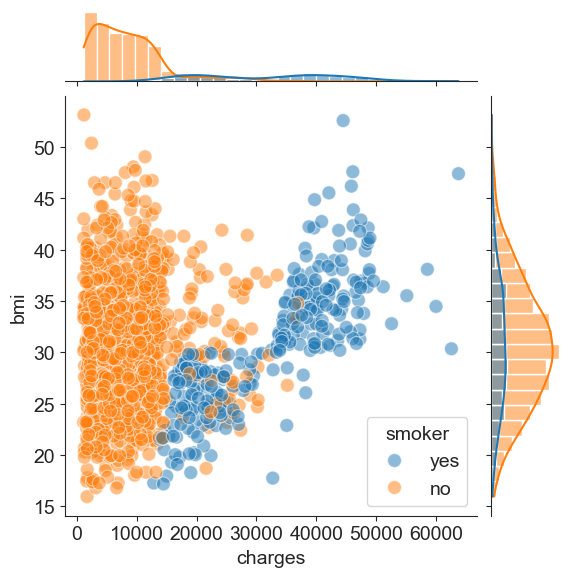

In [210]:
g = sns.JointGrid(data=medical_df, x="charges", y="bmi", hue = "smoker")
g.plot_joint(sns.scatterplot, s=100, alpha=.5)
g.plot_marginals(sns.histplot, kde=True)

It is still clear that the data was designed in a way that shows smoking individuals are the highest risk clients; the obesity adds up to this statement as well. Other types of data doesn't show that many differences.

##### 1.3.3.6. Region

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='charges', ylabel='region'>

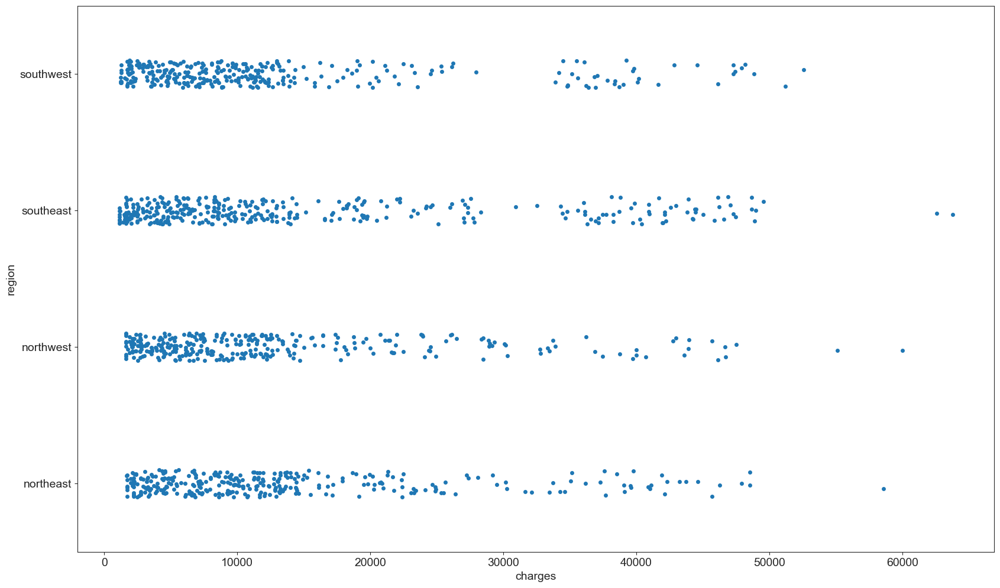

In [211]:
sns.stripplot(medical_df, x = 'charges', y = 'region')

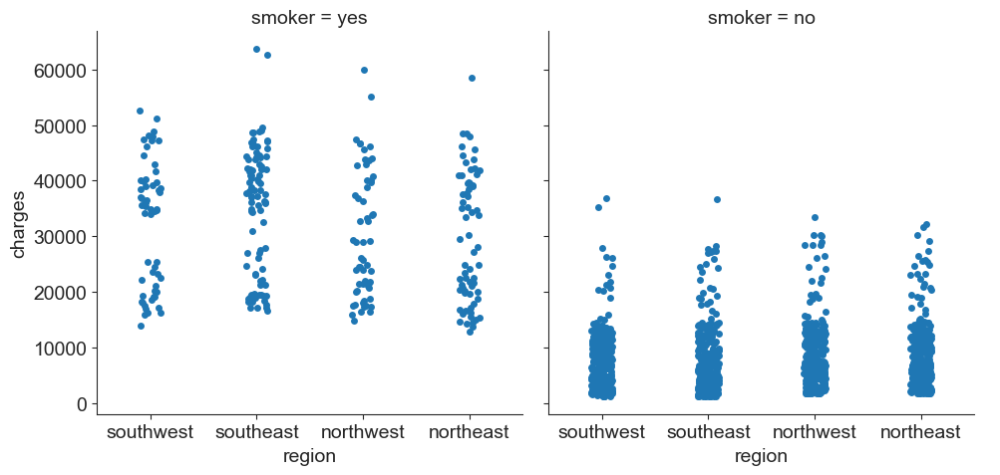

In [212]:
sns.catplot(medical_df, x = 'region', y = 'charges', col = "smoker")

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



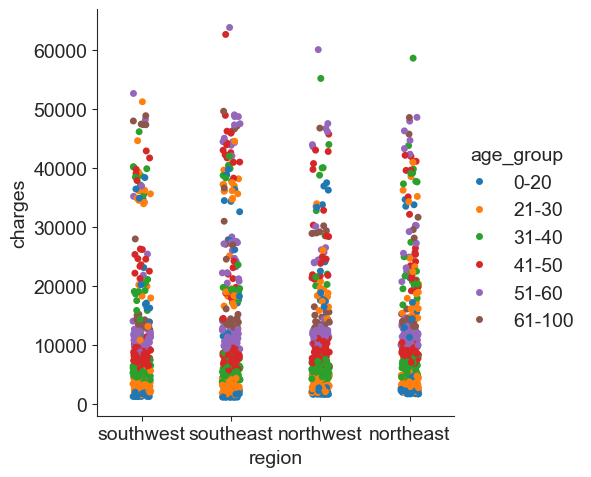

In [213]:
sns.catplot(medical_df, x = 'region', y = 'charges', hue = "age_group")

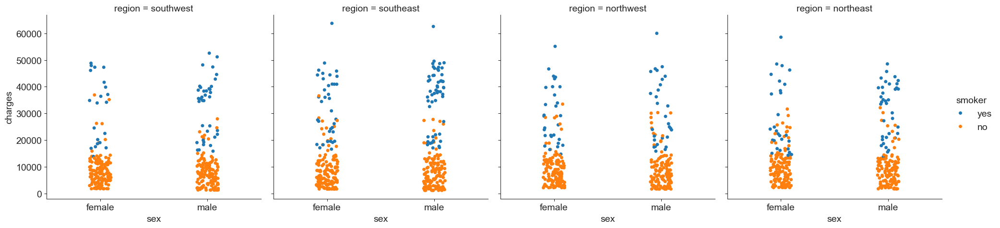

In [214]:
sns.catplot(medical_df, x = 'sex', y = 'charges', col = "region", hue = "smoker")

Boxenplot - enhanced box plot for larger datasets. The plot below is showing more quantiles, which helps to understand shape of distribution and its tails. 

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='region', ylabel='charges'>

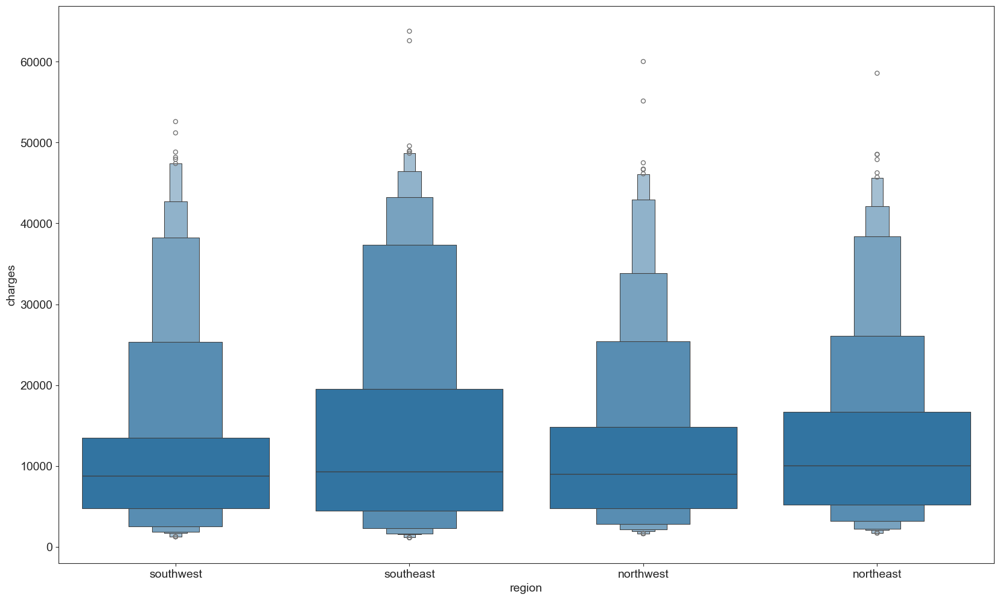

In [215]:
sns.boxenplot(medical_df, x = "region", y = "charges" )

I started to notice southeast.

<Axes: xlabel='charges', ylabel='region'>

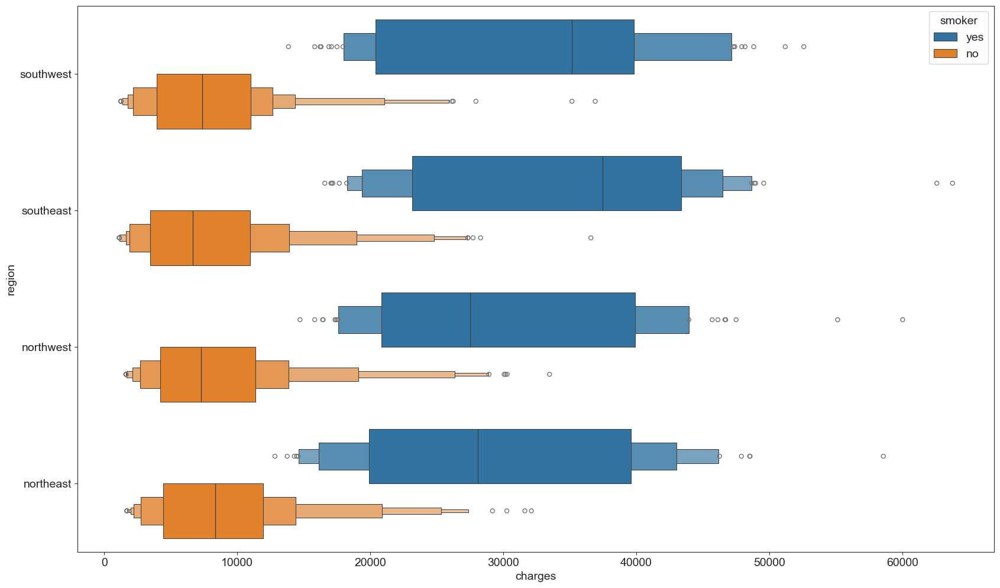

In [216]:
sns.boxenplot(medical_df, x = "charges", y = "region", hue = "smoker", legend = "auto")

It looks like obese smokers have largest charges.

<Axes: xlabel='charges', ylabel='region'>

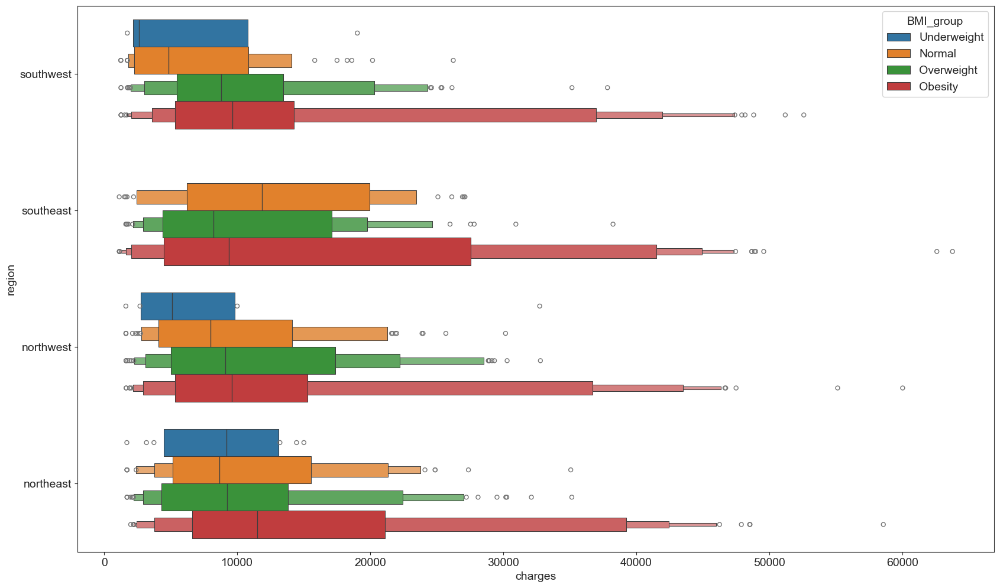

In [217]:
sns.boxenplot(medical_df, x = "charges", y = "region", hue = "BMI_group", legend = "auto")

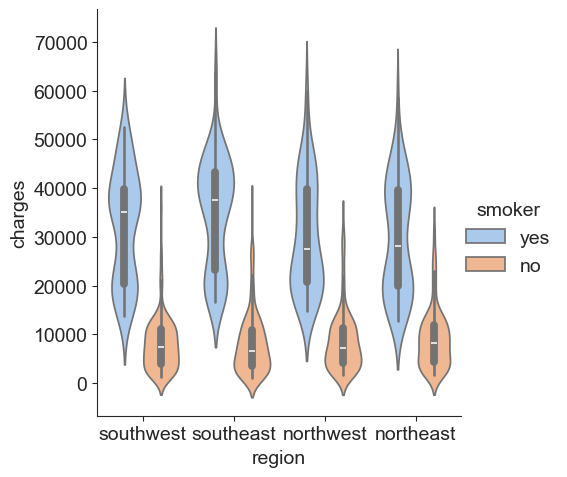

In [218]:
sns.catplot(
    data=medical_df, x="region", y="charges", hue="smoker",
    kind="violin", split=False, palette="pastel",
)

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<Axes: xlabel='region', ylabel='charges'>

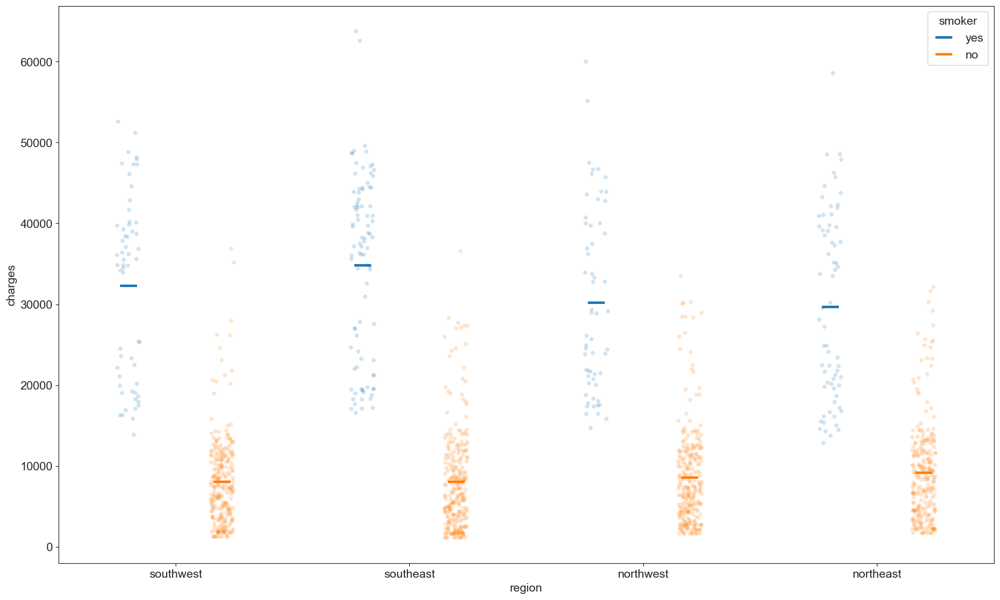

In [219]:
sns.stripplot(
    data=medical_df, x="region", y="charges", hue="smoker",
    dodge=True, alpha=.2, legend=False,
)
sns.pointplot(
    data=medical_df, x="region", y="charges", hue="smoker",
    dodge=.4, linestyle="none", errorbar=None,
    marker="_", markersize=20, markeredgewidth=3,
)

In the above plot it is visible the central tendency of charges in each group has higher values where individuals has children.

<Axes: xlabel='region', ylabel='charges'>

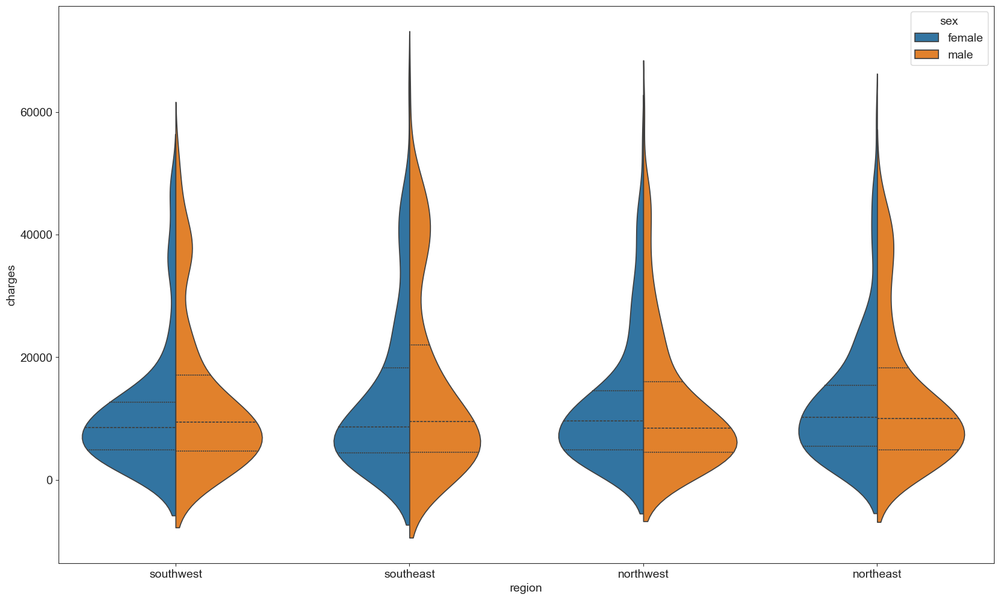

In [220]:
sns.violinplot(data=medical_df, x="region", y="charges", hue = "sex", 
               fill = True, legend = "full",
               split=True, inner="quart")

As noted in the above visualisations, individuals with children have higher charges in both first and third quartile, however, the median (or a second quartile) are very similar.

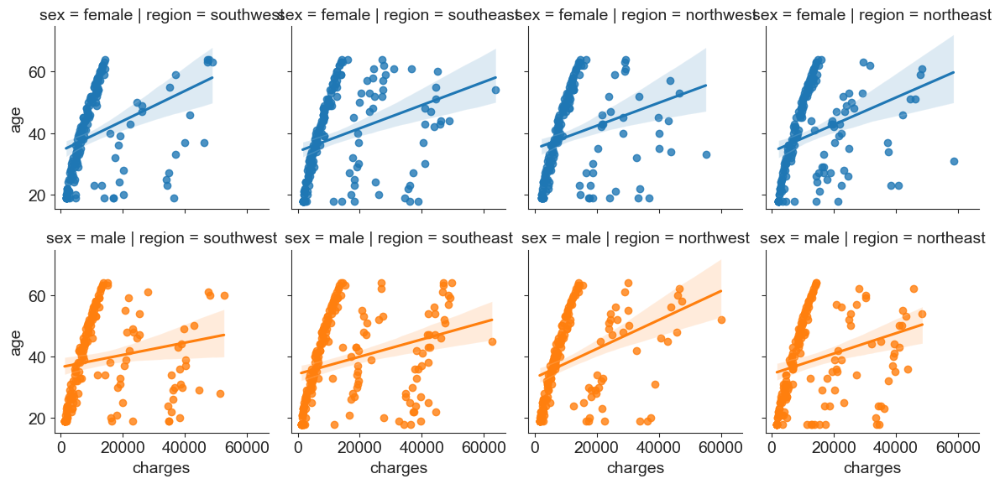

In [221]:
sns.lmplot(
    data=medical_df, x="charges", y="age",
    col="region", row="sex", hue="sex", height=3,
)

## 1.4 Multivariate analysis

I will more deeply check for any other meaningful insights. The first tech of multivariate analysis is clustering.

In [222]:
# saving session
dill.dump_session('medical_expenses.db')

In [223]:
dill.load_session('medical_expenses.db')

#### Bivariate analysis
  

Scatter plots, Pair plots, heatmaps  

#### Multivariate analysis

Advanced statistics (PCA to reduce dimensionality and identify patterns  
Multi-dimensional plots (pair plots, 3d plots)

#### Patterns and insights

Trend Analysis  
Anomaly detection: detect outliers

#### Summary statistics 

Compile key findings  
Dashboard
Report

#### Modeling

Feature selection  
Data split

# Linear Regression for non-smokers

We will create our first Linear Regression model where we will analyse if charges can be predicted by age for non-smoker clients only.

In [224]:
non_smoker_df = medical_df[medical_df.smoker == 'no']

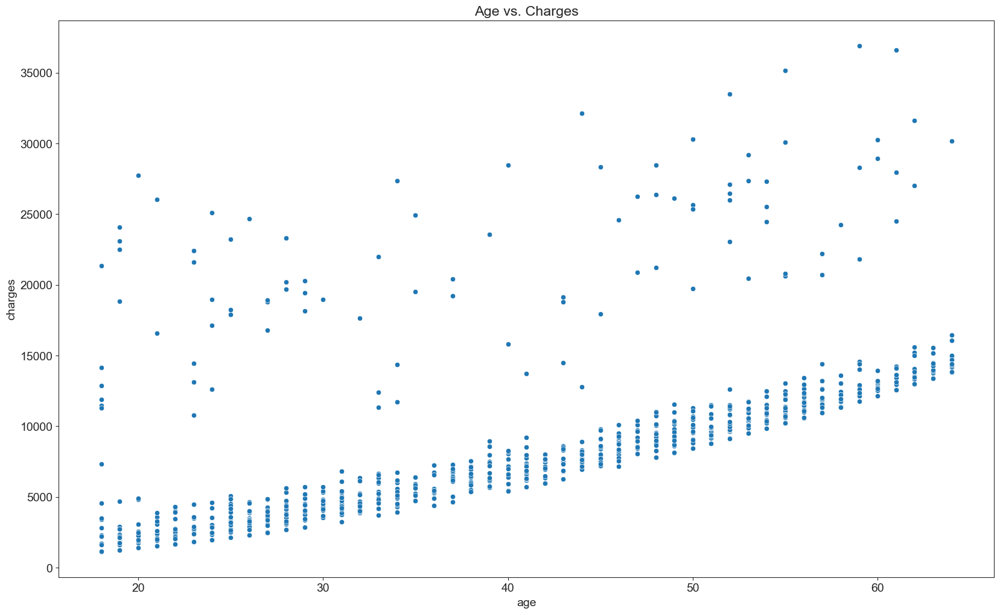

In [225]:
plt.title('Age vs. Charges')
sns.scatterplot(data = non_smoker_df, x = 'age', y = 'charges');

Linear Regression is basicaly a function below:

$$
y = wx + b;
$$

where $w$ is called *slope* and $b$ is called *intercept*.

We will now try to predict slope and intercept ourselves, both by creating functions or trying to guess the value. Then we will use Python package to analyse data and create best fit for it automatically.

#### Guessing slope and intercept values

Function below will calculate the charges value based on given slope (w) and intercept (b) values.

In [226]:
def estimate_charges(age, w, b):
    return w * age + b

Here is our guessed values:

In [227]:
w = 100
b = 50

We will try to calculate charges at age 20 with given w and b values:

In [228]:
estimate_charges(20, w, b)

2050

A quick look at scatter plot shows that the value might be correct. However, that is only one point we're guessing, and we need to keep in mind all other data points and values that we have. Therefore, we will try to calculate the line for all age points at once:

In [229]:
age = non_smoker_df.age

In [230]:
estimated_charges = estimate_charges(age, w, b)

Here is the result of our initial guess:

In [231]:
estimated_charges

1       1850
2       2850
3       3350
4       3250
5       3150
        ... 
1332    5250
1333    5050
1334    1850
1335    1850
1336    2150
Name: age, Length: 1063, dtype: int64

Text(0, 0.5, 'Charges')

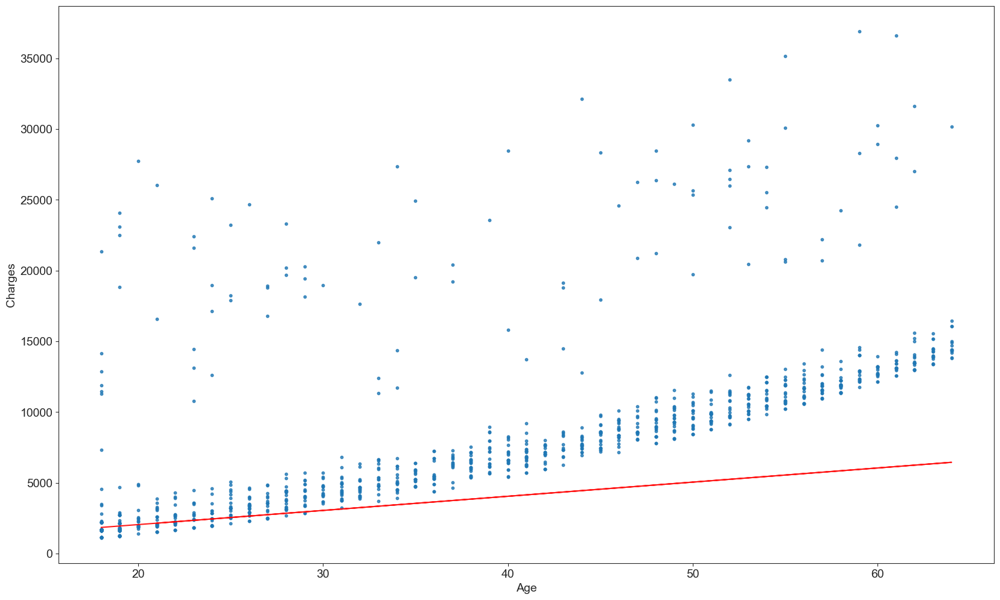

In [232]:
target = non_smoker_df.charges

plt.plot(age, estimated_charges, 'r', alpha = 0.9);
plt.scatter(age, target, s = 10, alpha = 0.8);
plt.xlabel('Age');
plt.ylabel('Charges')

So the guess was OK till year 20, and then it fell way too low for remaining data points. So our guess was incorrect.  

We can try to create an automatic function to plot our guesses, so we can play with parameters and try to find the more reliable fit:

In [233]:
def try_parameters (w, b):
    age = non_smoker_df.age
    charges = non_smoker_df.charges
    
    estimated_charges = estimate_charges(age, w, b)
    
    plt.plot(age, estimated_charges, 'r', alpha = 0.9);
    plt.scatter(age, charges, s = 10, alpha = 0.8);
    plt.xlabel('Age');
    plt.ylabel('Charges');

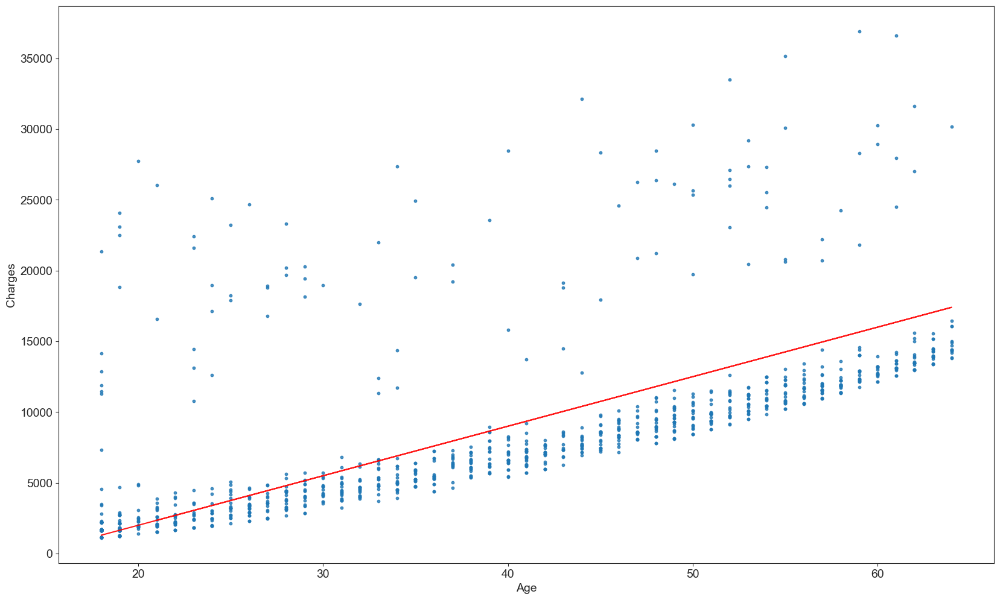

In [234]:
try_parameters (350, -5000)

Even though we can guess the more accurate value, it takes too much time. We would need to calculate function accuracy as well to know if our guessed numbers are reliable.

## Loss / Cost Function

To test our created model accuracy we need other mathematical funtions to step in.

**Root mean squared error (RMSE)** can be calculated as follows:

* Calculate the difference between target and prediction (residual);
* Square all residuals to remove negative values;
* Calculate the average of all elements;
* Take a square root of the result number.

$$RMSE = \sqrt{\displaystyle\sum_{i=1}^N = \frac{(Predicted_i - Actual_i)^2}{N}}$$

The thing to remember while calculating RMSE error is that the value is sensitive to outliers, which will be visible in this dataset.

Below there is a function to calculate RMSE values:

In [237]:
def rmse(target, predictions):
    return np.sqrt(np.mean(np.square(target - predictions)))

On average, each element in the prediction differs from the actual target by $6862.25. Basically, if created model is bad, then RMSE errors will be very high.

In [238]:
def try_parameters_rmse(w, b):
    age = non_smoker_df.age
    charges = non_smoker_df.charges
    estimated_charges = estimate_charges(age, w, b)
    
    plt.plot(age, estimated_charges, 'r') ## prediction line
    plt.scatter(age, charges) ## actual values in a scatter plot
    plt.xlabel('Age')
    plt.ylabel('Charges')
    
    loss = rmse(charges, estimated_charges)
    print("RMSE loss; ", loss)

RMSE loss;  4994.24516372874


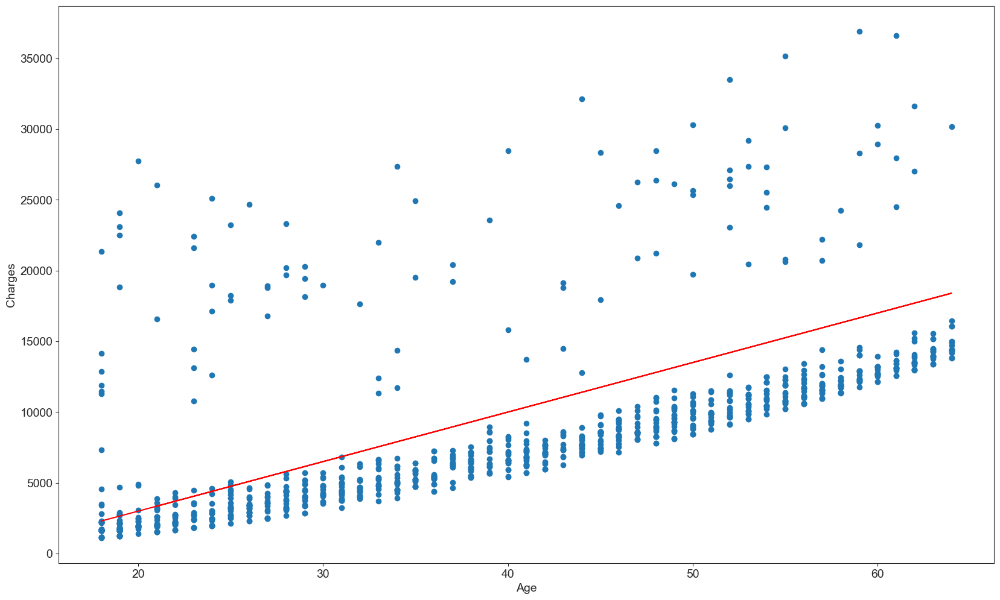

In [239]:
try_parameters_rmse(350, -4000)

After guessing various parameters, we get RSME 4994, which is less than previous guesses. However, such loss is not acceptable and as per scatter plot data we can see that the outliers are increasing the predicted values. Due to this, predicted charges valeues goes way to high in later age for average consumers.

### Basic Linear Regression model based on age for non-smokers

In [68]:
X, y = non_smoker_df[['age']], non_smoker_df['charges']

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [70]:
model = LinearRegression().fit(X_train, y_train)

In [75]:
predictions = model.predict(X_test)

In [76]:
print(f"Root mean squared error: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"Coefficient of determination: {r2_score(y_test, predictions):.2f}")

Root mean squared error: 4748.90
Coefficient of determination: 0.32


### Optimizer

There are strategies to reduce loss and modify wight $w$ and intercept $b$:

* **Ordinary Least Squares** (for smaller data sets);
* **Stochastic Gradient Descent** (for larger data sets).

#### OLS

In [77]:
# defining the variables
X = non_smoker_df['age'].tolist()
y = non_smoker_df['charges'].tolist()

# adding the constant term
X = sm.add_constant(X)

# performing the regression
# and fitting the model
result = sm.OLS(y, X).fit()

# printing the summary table
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.394
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     688.8
Date:                Mon, 17 Feb 2025   Prob (F-statistic):          2.15e-117
Time:                        13:28:34   Log-Likelihood:                -10488.
No. Observations:                1063   AIC:                         2.098e+04
Df Residuals:                    1061   BIC:                         2.099e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2085.0077    425.865     -4.896      0.0

Basic OLS analysis provides the slope as 267.1183 and intercept as -2085.0077 with determination coefficient 0.394. We can try to visualise such parameters with our previously created functions:

RMSE loss;  4664.514914257873


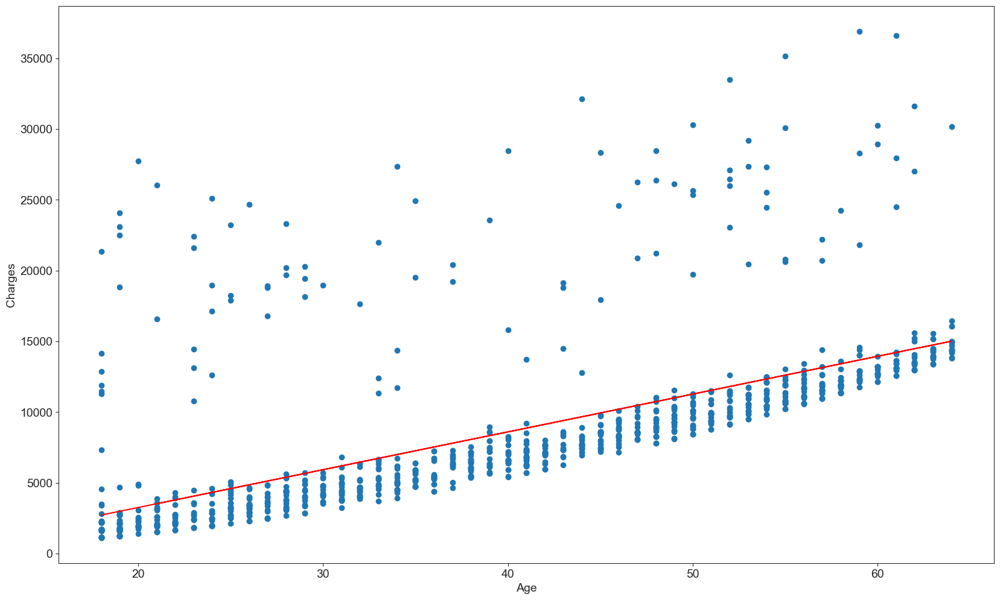

In [246]:
try_parameters_rmse(267.1183, -2085.0077)

The loss decreased, and the line is less dependent on the outlier values we have.

#### SGD

I will build a linear regression model using Stochastic Gradient Descent optimization algorithm. First, we need to create arrays for X (age) and y (charges) for non-smokers.

In [78]:
non_smoker_df = medical_df[medical_df.smoker == 'no']

In [79]:
X = non_smoker_df[['age']]
y = non_smoker_df.charges
print('X.shape :', X.shape)
print('y.shape :', y.shape)

X.shape : (1063, 1)
y.shape : (1063,)


Creating a train - test data split for model creation:

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

SGD algorithm is sensitive to count of iterations and learning rate. We played with various parameters and used epsilon to adress outliers issues as well:

In [81]:
SGD_model = SGDRegressor(loss="squared_error", max_iter=6000, eta0=0.001, epsilon=0.8, learning_rate='adaptive')

In [82]:
SGD_model.fit(X_train, y_train)

SGDRegressor(epsilon=0.8, eta0=0.001, learning_rate='adaptive', max_iter=6000)

In [86]:
predictions = SGD_model.predict(X_test)

Below we will evaluate model accuracy using $R^2$ and $RMSE$:

In [88]:
print(f"Root mean squared error: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"Coefficient of determination: {r2_score(y_test, predictions):.2f}")

Root mean squared error: 4952.47
Coefficient of determination: 0.34


As per RMSE value, above model on average will have 4676$ error in it's predictions.

$R^2$ is 0.39, which basically says that 39% of yearly charges are explained by a non-smoker consumer's age, while 66% of charges are not explained by the above linear regression model. 

Based of the above model, the function to calculate charges based on consumer's age for non-smokers is:
$$
Yearly Charges = 289.82 \times Age - 4676.14
$$

In [92]:
y_pred = SGD_model.predict(X_test)

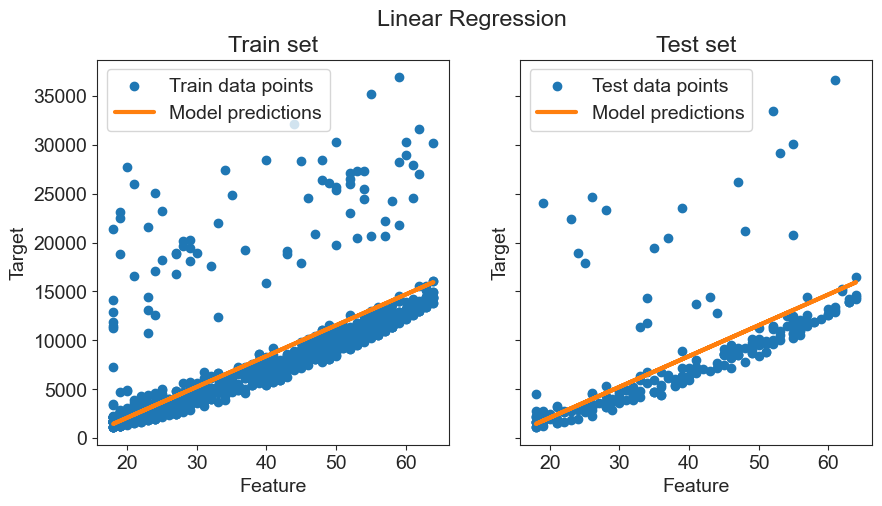

In [93]:
fig, ax = plt.subplots(ncols=2, figsize=(10, 5), sharex=True, sharey=True)

ax[0].scatter(X_train, y_train, label="Train data points")
ax[0].plot(
    X_train,
    SGD_model.predict(X_train),
    linewidth=3,
    color="tab:orange",
    label="Model predictions",
)
ax[0].set(xlabel="Feature", ylabel="Target", title="Train set")
ax[0].legend()

ax[1].scatter(X_test, y_test, label="Test data points")
ax[1].plot(X_test, y_pred, linewidth=3, color="tab:orange", label="Model predictions")
ax[1].set(xlabel="Feature", ylabel="Target", title="Test set")
ax[1].legend()

fig.suptitle("Linear Regression")

plt.show()

When we visualise model's behaviour on train and test data, it is visible that for linear regression it is hard to keep outlier's data not included into main line. Therefore RMSE values are high all the time, even if we can see the trend clearly.

# Linear Regression for smokers

We will try to create linear regression model for smokers as well, even if data doesn't look suitable.

In [262]:
smoker_df = medical_df[medical_df.smoker == 'yes']

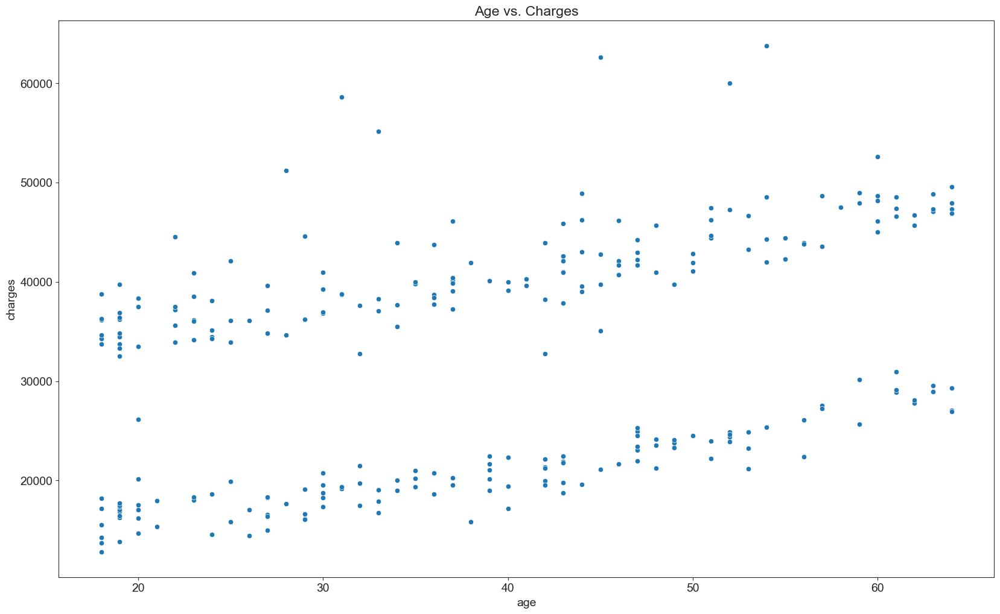

In [263]:
plt.title('Age vs. Charges')
sns.scatterplot(data = smoker_df, x = 'age', y = 'charges');

#### Guessing slope and intercept values

Function below will calculate the charges value based on given slope (w) and intercept (b) values. Here is our guessed values:

In [264]:
w = 100
b = 10000

We will try to calculate charges at age 20 with given w and b values:

In [265]:
estimate_charges(20, w, b)

12000

A quick look at scatter plot shows that the value might be correct. However, that is only one point we're guessing, and we need to keep in mind all other data points and values that we have. Therefore, we will try to calculate the line for all age points at once:

In [266]:
age = smoker_df.age

In [267]:
estimated_charges_smokers = estimate_charges(age, w, b)

Here is the result of our initial guess:

In [268]:
estimated_charges_smokers

0       11900
11      16200
14      12700
19      13000
23      13400
        ...  
1313    11900
1314    13000
1321    16200
1323    14200
1337    16100
Name: age, Length: 274, dtype: int64

Text(0, 0.5, 'Charges')

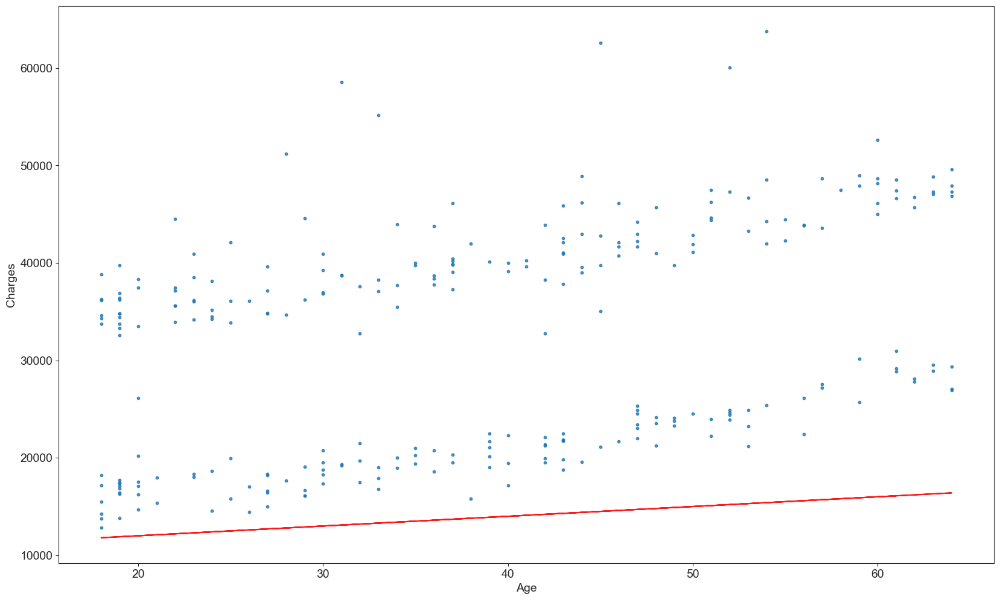

In [269]:
smoker_charges = smoker_df.charges

plt.plot(age, estimated_charges_smokers, 'r', alpha = 0.9);
plt.scatter(age, smoker_charges, s = 10, alpha = 0.8);
plt.xlabel('Age');
plt.ylabel('Charges')

Our guess was incorrect.

We will try the automatic function again:

In [270]:
def try_parameters (w, b):
    age = smoker_df.age
    charges = smoker_df.charges
    
    estimated_charges_smoker = estimate_charges(age, w, b)
    
    plt.plot(age, estimated_charges_smoker, 'r', alpha = 0.9);
    plt.scatter(age, charges, s = 10, alpha = 0.8);
    plt.xlabel('Age');
    plt.ylabel('Charges');

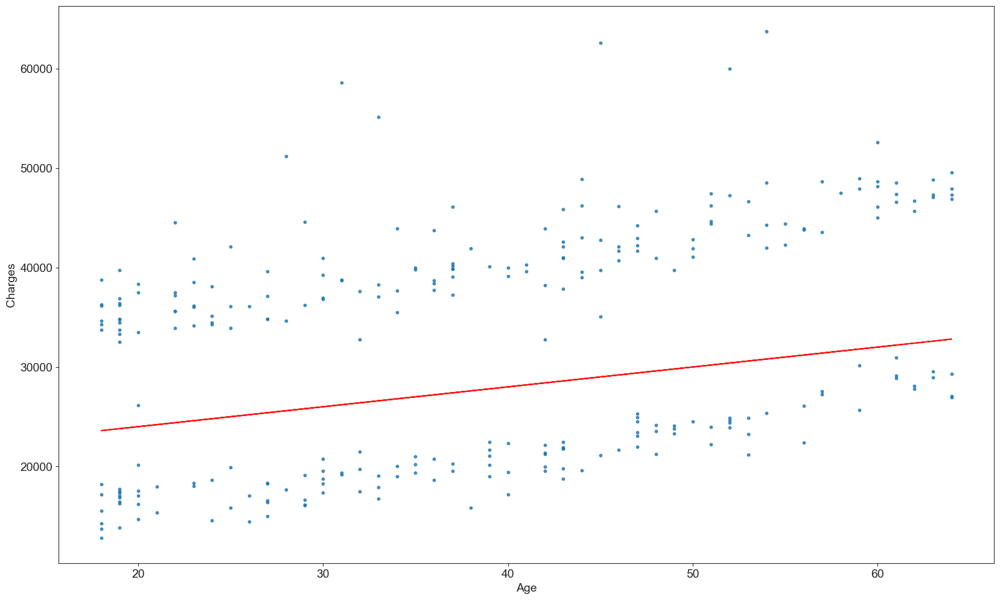

In [271]:
try_parameters (200, 20000)

Even though we can guess the more accurate value, it takes too much time. We would need to calculate function accuracy as well to know if our guessed numbers are reliable.

### Linear Regression based on age for smokers

In [95]:
X, y = smoker_df[['age']], smoker_df['charges']

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [97]:
model = LinearRegression().fit(X_train, y_train)

In [98]:
predictions = model.predict(X_test)

In [100]:
print(f"RMSE loss: {root_mean_squared_error(y_test, predictions): .2f}")
print(f"Determination Coefficient: {r2_score(y_test, predictions): .2f}")

RMSE loss:  10187.46
Determination Coefficient:  0.03


## Loss / Cost Function

We will calculate RMSE for our guess now:

In [272]:
def smoker_try_parameters_rmse(w, b):
    age = smoker_df.age
    charges = smoker_df.charges
    estimated_charges_smoker = estimate_charges(age, w, b)
    
    plt.plot(age, estimated_charges_smoker, 'r') ## prediction line
    plt.scatter(age, charges) ## actual values in a scatter plot
    plt.xlabel('Age')
    plt.ylabel('Charges')
    
    loss = rmse(charges, estimated_charges_smoker)
    print("RMSE loss; ", loss)

RMSE loss;  11651.773082344658


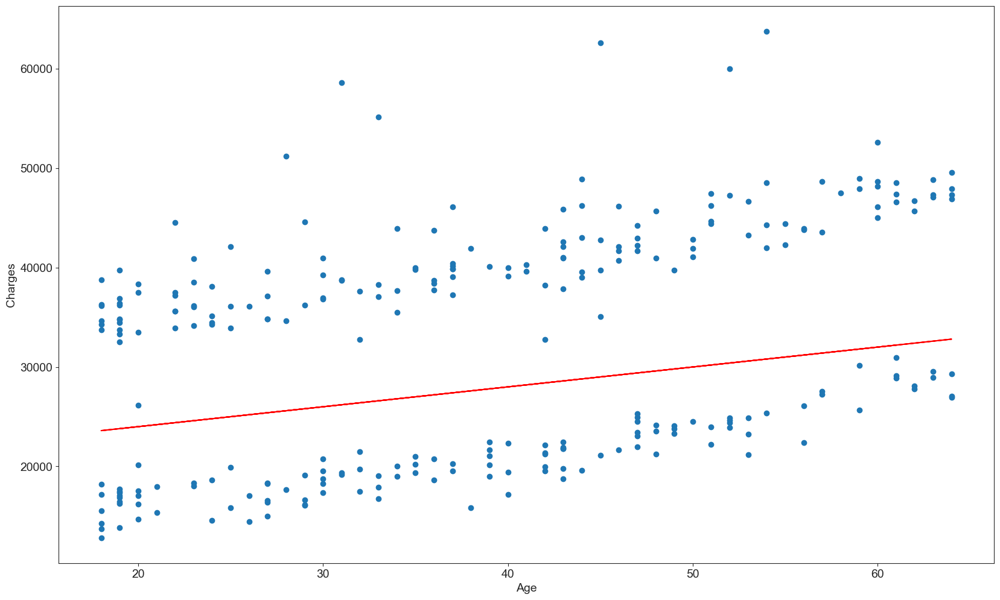

In [273]:
smoker_try_parameters_rmse(200, 20000)

After guessing various parameters, we get RSME 11651, which is way too high for a accurate model. Therefore we will rely on optimizer algorithms to help out finding least RMSE values.

### Optimizer

#### OLS

In [274]:
# defining the variables
X = smoker_df['age'].tolist()
y = smoker_df['charges'].tolist()

# adding the constant term
X = sm.add_constant(X)

# performing the regression
# and fitting the model
result = sm.OLS(y, X).fit()

# printing the summary table
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.132
Method:                 Least Squares   F-statistic:                     42.67
Date:                Sat, 15 Feb 2025   Prob (F-statistic):           3.18e-10
Time:                        12:49:12   Log-Likelihood:                -2931.2
No. Observations:                 274   AIC:                             5866.
Df Residuals:                     272   BIC:                             5874.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.029e+04   1913.400     10.606      0.0

Basic OLS analysis provides the slope as 305.2376 and intercept as 20290 with determination coefficient 0.132. We can try to visualise such parameters with our previously created functions:

RMSE loss;  10711.004143644226


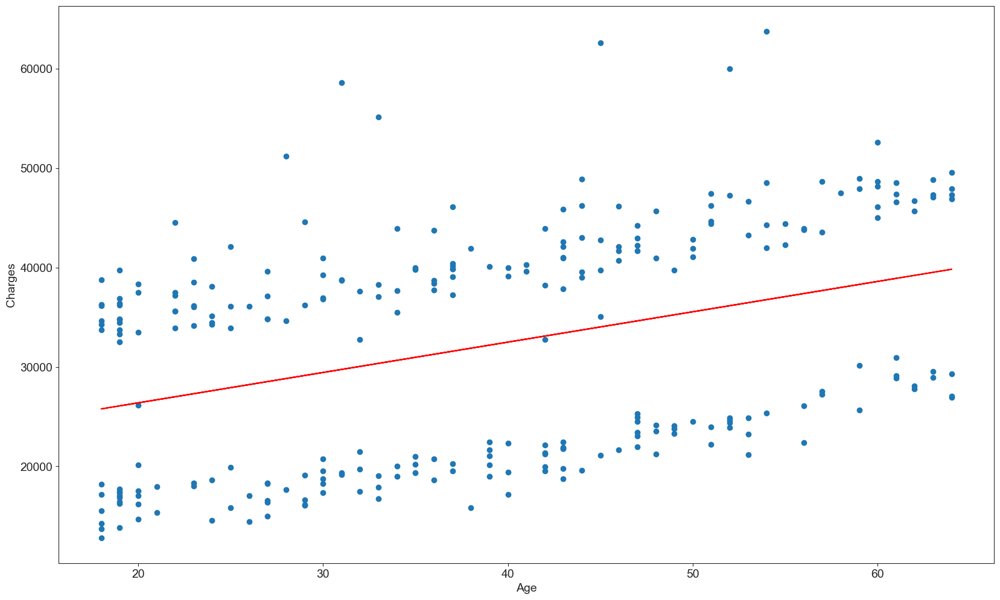

In [275]:
smoker_try_parameters_rmse(305.2376, 20290)

The loss decreased, but the RMSE error is still very high. However, as we can see in the scatter plot, the model simply cannot perform better as there are two large groups of smokers and model has to predict in between both of them.

#### SGD

I will build a linear regression model using Stochastic Gradient Descent optimization algorithm. First, we need to create arrays for X (age) and y (charges) for smokers.

In [276]:
smoker_df = medical_df[medical_df.smoker == 'yes']

In [277]:
X = smoker_df[['age']]
y = smoker_df.charges
print('X.shape :', X.shape)
print('y.shape :', y.shape)

X.shape : (274, 1)
y.shape : (274,)


Creating a train - test data split for model creation:

In [278]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

SGD algorithm is sensitive to count of iterations and learning rate. We played with various parameters and used epsilon to adress outliers issues as well:

In [279]:
SGD_model = SGDRegressor(loss="squared_error", max_iter=9000, eta0=0.001, epsilon = 0.1, learning_rate='adaptive')

In [280]:
SGD_model.fit(X_train, y_train)

SGDRegressor(eta0=0.001, learning_rate='adaptive', max_iter=9000)

In [281]:
predictions = SGD_model.predict(X_test)

Below we will evaluate model accuracy using $R^2$ and $RMSE$:

In [285]:
predictions = SGD_model.predict(X)

print(f"Root mean squared error: {root_mean_squared_error(y, predictions):.2f}")
print(f"Coefficient of determination: {r2_score(y, predictions):.2f}")

Root mean squared error: 12562.60
Coefficient of determination: -0.19


Basically the model doesn't fit data we have therefore no matter how we change the parameters it won't fit.

# Linear Regression using multiple features

## Age and BMI for non-smokers

In [102]:
X, y = non_smoker_df[['age', 'bmi']], non_smoker_df['charges']

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

In [104]:
model = LinearRegression().fit(X_train, y_train)

In [105]:
predictions = model.predict(X_test)

In [106]:
print(f"RMSE loss: {root_mean_squared_error(y_test, predictions): .2f}")
print(f"Determination Coefficient: {r2_score(y_test, predictions): .2f}")

RMSE loss:  4478.81
Determination Coefficient:  0.43


### Linear Regression for non-smokers using only BMI

I will try to train a linear regression model to estimate charges using BMI alone, similarly as I did before with age. I would expect this model will perform worse, but won't be completely off.

In [107]:
X, y = non_smoker_df[['bmi']], non_smoker_df['charges']

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

In [109]:
model_bmi = LinearRegression().fit(X_train, y_train)

In [110]:
predictions = model_bmi.predict(X_test)

In [111]:
print(f"RMSE loss: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"Determination coefficient: {r2_score(y_test, predictions):.2f}")

RMSE loss: 6204.37
Determination coefficient: 0.00


## Age, BMI and children for non-smokers

In [112]:
X, y = non_smoker_df[['age', 'bmi', 'children']], non_smoker_df['charges']

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

In [114]:
model_3 = LinearRegression().fit(X_train, y_train)

In [115]:
predictions = model_3.predict(X_test)

In [116]:
print(f"Root mean squared error: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"Coefficient of determination: {r2_score(y_test, predictions):.2f}")

Root mean squared error: 4682.05
Coefficient of determination: 0.40


### Linear Regression with multiple features for smokers

#### Linear Regression with Age and BMI for smokers

In [125]:
X, y = smoker_df[['age', 'bmi']], smoker_df['charges']

In [126]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [127]:
model = LinearRegression().fit(X_train, y_train)

In [128]:
predictions = model.predict(X_test)

In [129]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 5291.67
R2: 0.78


#### Linear Regression with Age, BMI and children for smokers

In [322]:
X, y = smoker_df[['age', 'bmi', 'children']], smoker_df['charges']

In [130]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [131]:
model = LinearRegression().fit(X_train, y_train)

In [132]:
predictions = model.predict(X_test)

print(f"Root mean squared error: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"Coefficient of determination: {r2_score(y_test, predictions):.2f}")

Root mean squared error: 5602.53
Coefficient of determination: 0.75


# Linear Regression based on Age, BMI and Children

This time we won't split the dataset based on smoking habits.

## Age only

In [134]:
X, y = medical_df[['age']], medical_df['charges']

In [135]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [136]:
model = LinearRegression().fit(X_train, y_train)

In [137]:
predictions = model.predict(X_test)

In [139]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 11604.91
R2: 0.09


## BMI only

In [140]:
X, y = medical_df[['bmi']], medical_df['charges']

In [141]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [142]:
model = LinearRegression().fit(X_train, y_train)

In [143]:
predictions = model.predict(X_test)

In [144]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 11474.98
R2: 0.05


## Age and BMI

In [145]:
X, y = medical_df[['age', 'bmi']], medical_df['charges']

In [146]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [147]:
model = LinearRegression().fit(X_train, y_train)

In [148]:
predictions = model.predict(X_test)

In [149]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 11425.23
R2: 0.14


## Age, BMI and Children

In [150]:
X, y = medical_df[['age', 'bmi', 'children']], medical_df['charges']

In [151]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [152]:
model = LinearRegression().fit(X_train, y_train)

In [153]:
predictions = model.predict(X_test)

In [154]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 11601.98
R2: 0.09


# Adding Categorical Features

The main thing is to convert categorical values to numbers. This can be done in a few different ways based on category type:
* For **two categories**: convert categories to number (1 and 0);
* For **more than two coategories**: one-hot encoding;
* For **ordinal values** (e.g. cold, neutral, warm, hot): convert to numbers and preserve order. This technique should be used when there is a correlation between some of the values and the target variable, e.g. something happens more often in hot temperature.

## Adding smoker indicator

In [9]:
smoker_indicator = {'no': 0, 'yes': 1}

In [10]:
medical_df['smoker_indicator'] = medical_df.smoker.map(smoker_indicator)

In [12]:
medical_df.charges.corr(medical_df.smoker_indicator)

0.7872343672800323

We are now able to use smoker indicator for simple linear regression model.

In [13]:
X, y = medical_df[['age', 'bmi', 'children', 'smoker_indicator']], medical_df['charges']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [16]:
model = LinearRegression().fit(X_train, y_train)

In [17]:
predictions = model.predict(X_test)

In [20]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 6468.20
R2: 0.70


## Adding gender indicator

In [21]:
gender_indicator = {'female': 0, 'male': 1}

In [22]:
medical_df['gender_indicator'] = medical_df.sex.map(gender_indicator)

In [24]:
medical_df.charges.corr(medical_df.gender_indicator)

0.05804449579031284

In [25]:
X, y = medical_df[['age', 'bmi', 'children', 'smoker_indicator', 'gender_indicator']], medical_df['charges']

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [27]:
model = LinearRegression().fit(X_train, y_train)

In [28]:
predictions = model.predict(X_test)

In [29]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 6200.20
R2: 0.75


# Adding region

To do this we will use one-hot encoding.

In [66]:
enc = preprocessing.OneHotEncoder()
enc.fit(medical_df[['region']])
enc.categories_

[array(['northeast', 'northwest', 'southeast', 'southwest'], dtype=object)]

In [24]:
enc.transform([['northeast']]).toarray()

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but OneHotEncoder was fitted with feature names



array([[1., 0., 0., 0.]])

In [25]:
one_hot = enc.transform(medical_df[['region']]).toarray()

In [26]:
medical_df[['northeast', 'northwest', 'southeast', 'southwest']] = one_hot

Now we are able to include region into our model:

In [29]:
features = ['age', 'bmi', 'children', 'smoker_indicator', 'gender_indicator', 'northeast', 'northwest', 'southeast', 'southwest']

In [30]:
X, y = medical_df[features], medical_df['charges']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

model = LinearRegression().fit(X_train, y_train)

predictions = model.predict(X_test)

print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 5279.70
R2: 0.80


# Two separate models for smokers and non-smokers

### Non-smokers

In [31]:
non_smoker_df = medical_df[medical_df.smoker == 'no']

In [32]:
features = ['age', 'bmi', 'children', 'gender_indicator', 'northeast', 'northwest', 'southeast', 'southwest']

In [33]:
X, y = non_smoker_df[features], non_smoker_df['charges']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

model = LinearRegression().fit(X_train, y_train)

predictions = model.predict(X_test)

print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 4878.15
R2: 0.39


### Smokers

In [34]:
smoker_df = medical_df[medical_df.smoker == 'yes']

In [35]:
X, y = smoker_df[features], smoker_df['charges']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

model = LinearRegression().fit(X_train, y_train)

predictions = model.predict(X_test)

print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 5518.16
R2: 0.78


# Feature Scaling

To understand our model, we can check the details we fed into and what was the response.

In [36]:
features = ['age', 'bmi', 'children', 'smoker_indicator', 'gender_indicator', 'northeast', 'northwest', 
            'southeast', 'southwest']

X, y = medical_df[features], medical_df['charges']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

model = LinearRegression().fit(X_train, y_train)

predictions = model.predict(X_test)

print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"R2: {r2_score(y_test, predictions):.2f}")

RMSE: 6411.72
R2: 0.75


In [37]:
medical_df[features].loc[10]

age                 25.00
bmi                 26.22
children             0.00
smoker_indicator     0.00
gender_indicator     1.00
northeast            1.00
northwest            0.00
southeast            0.00
southwest            0.00
Name: 10, dtype: float64

The above shows what was fed into the model: this is a 25 years old customer with BMI of 26. He has no children and does not smoke, and he lives in northeast.

In [39]:
model.predict([[25, 26.22, 0.00, 0.00, 1.00, 1.00, 0.00, 0.00, 0.00]])

C:\Users\Pica\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([3062.28515463])

Our model predicts that medical charges will be 3062.

The true charges for this individual are:

In [40]:
medical_df['charges'].loc[10]

2721.3208

So in such case our model predicted pretty well.

However, in real life examples, we need to have a proper understanding of our model and we need to be able to examine and explain why does our model works in such way. Fortunately, in Linear Regression this is pretty straightforward. So if the customer would ask why exactly they were given such numbers, and we need to be able to explain that.

In [41]:
model.coef_

array([  257.64680756,   328.05939851,   503.57776048, 23457.49774218,
          31.15207511,   356.75500205,   219.45279112,  -327.14615521,
        -249.06163796])

The above could be visualised properly:

In [44]:
weights_df = pd.DataFrame({
    'Feature': np.append(features, 1),
    'Weight': np.append(model.coef_, model.intercept_)
})

weights_df

,Feature,Weight
0,age,257.646808
1,bmi,328.059399
2,children,503.577760
3,smoker_indicator,23457.497742
4,gender_indicator,31.152075
5,northeast,356.755002
6,northwest,219.452791
7,southeast,-327.146155
8,southwest,-249.061638
9,1,-12368.509541


##  Standardisation

First of all, what is a standardisation?

This is a method which helps to scale numerical features to scale, which is common to all, usually from 1 to -1. The range between values is kept intact. The formula to do this is pretty straightforward:

$$z = \frac{x_i-\mu}{\sigma}$$

where $x_i$ is a data point, $\mu$ is a mean and $\sigma$ is a standard deviation.

So basicaly the formula can be seen as this:
$$z-score = \frac{CurrentValue - Mean}{Standard Deviation}$$

In [47]:
numerical_columns = ['age', 'bmi', 'children']
scaler = StandardScaler()
scaler.fit(medical_df[numerical_columns])

StandardScaler()

In [48]:
scaler.mean_

array([39.22213912, 30.66345176,  1.09573672])

The above shows that the mean of age is around 39, mean of BMI is around 30 and mean of children count is around 1.

In [49]:
scaler.var_

array([197.09575518,  37.18787958,   1.45231541])

The above shows variance (which is a square of Standard Deviation). So variance of age is 197, BMI - 37 and children count - 1.5.

I can now scale data:

In [50]:
scaled_inputs = scaler.transform(medical_df[numerical_columns])
scaled_inputs

array([[-1.44041773, -0.45315959, -0.90923416],
       [-1.51164747,  0.50942165, -0.07944162],
       [-0.79935006,  0.3831546 ,  1.58014347],
       ...,
       [-1.51164747,  1.01448983, -0.90923416],
       [-1.29795825, -0.79752426, -0.90923416],
       [ 1.55123139, -0.26129928, -0.90923416]])

I will combine scaled data with categorical columns now:

In [52]:
categorical_columns = ['smoker_indicator', 'gender_indicator', 'northwest', 'northeast', 'southeast', 'southwest']

In [53]:
categorical_data = medical_df[categorical_columns].values

In [55]:
X = np.concatenate((scaled_inputs, categorical_data), axis = 1)

In [57]:
y = medical_df.charges

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

In [60]:
model = LinearRegression().fit(X_train, y_train)

In [61]:
predictions = model.predict(X_test)

In [62]:
print(f"RMSE: {root_mean_squared_error(y_test, predictions):.2f}")
print(f"RMSE: {r2_score(y_test, predictions):.2f}")

RMSE: 5715.66
RMSE: 0.78


And we are able to compare the weights now:

In [64]:
scaled_weights_df = pd.DataFrame({
    'Features': np.append(numerical_columns + categorical_columns, 1),
    'Weights': np.append(model.coef_, model.intercept_)
})
scaled_weights_df

,Features,Weights
0,age,3535.487659
1,bmi,2187.826248
2,children,492.003986
3,smoker_indicator,23837.140861
4,gender_indicator,21.808327
5,northwest,477.270409
6,northeast,695.248802
7,southeast,-691.822410
8,southwest,-480.696801
9,1,8503.766017


Now looking at the new weights it can be seen that the highest weight is smoker, then age, and then bmi, with anything else not that big deal.

In [65]:
# saving session
dill.dump_session('medical_expenses.db')

In [4]:
dill.load_session('medical_expenses.db')

This is actually where the tutorial ended. So the main point was to analyse data and create a Linear Regression model for it, which we saw didn't fit the data at all. All things below this line will be made by myself, after exploring different types of machine learning models.